# Digital Retinal Images for Vessel Segmentation
Project ID: 033


Group Name: Group One
- **Qingru Liu**: z5449255
- **Jeremy Lu**: z5536953
- **Ash Peng**: z5473493
- **Anthony Chen**: z5581750
- **Peilin Tan**: z5530348
---

# Directory

1. [Introduction](#Introduction)
    - Motivation
    - Problem Statement
2. [Datasets](#Datasets)
    - Datasets overall (including Data Source)
    - Exploratory Analysis of Data
3. [Models](#Models)
    - Baseline Models
    - Modified Models
4. [Algorithm Implemented Pipeline](#Pipeline)
    - Environment Requirements
    - Datasets load
    - Data Preprocess
    - Split train-val-test
    - Training
    - Evaluation
5. [Experiments](#Experiments)
    - Baseline models
    - Data Augmentation Experiments
    - Improvemnet Model Experiments
**Including all the training and evaluation process & Logs**
6. [Results](#Results)
    - Experiments Results Summaries
    - Evaluation Metrics
7. [Discussion](#Discussion)
    - Result Analysis
    - Limitations
    - Future Work


# Introduction

Our project is to develop an efficient semantic segmentation algorithm to achieve retinal blood vessel segmentation.

## Motivation

- **Application:** Segmenting retinal blood vessels from eye fundus images is crucial for diagnosing ocular diseases like diabetic retinopathy and glaucoma.
- **Improvement Performance:** Accurate segmentation aids early detection, allowing for timely medical intervention and improving patient outcomes.

## Problem Statement

- **Task**: Develop an automatic segmentation algorithm to segment the retinal vascular components from a digital retinal image.
- **Method**: Use an algorithm based on deep learning for semantic segmentation, apply binary classification for each pixel of the input image, and output a binary image with the category of blood vessels.

# Datasets
## Overview of Datasets for Retinal Vessel Segmentation

- Diverse Sources: **DRIVE**, **STARE**, and **HRF** datasets offer retinal images from diabetic screenings and ophthalmology clinics, encompassing a wide demographic.
- Expert Annotations: Each dataset includes images meticulously annotated by experts, crucial for precise vessel segmentation.

---
Here're our all datasets used for train, validation and test in this projects.

| Dataset Name | Image Count | Annotation Count | Data Source                                        | Link                                      |
|--------------|-------------|------------------|----------------------------------------------------|-------------------------------------------|
| DRIVE        | 20          | 20               | Diabetic retinopathy screening in The Netherlands | [DRIVE](https://drive.grand-challenge.org/) |
| STARE        | 20          | 20               | Shiley Eye Center, University of California       | [STARE](https://cecas.clemson.edu/~ahoover/stare/probing/index.html) |
| HRF          | 45          | 45               | Public database from various ophthalmology clinics| [HRF](https://www5.cs.fau.de/research/data/fundus-images/)           |

---
## Exploratory Analysis of Data

- **Data Availability Limitation**: The field of medical imaging suffers from a severe scarcity of publicly available datasets.
  - Currently, we only have access to **85** images, which poses a significant challenge for deep learning methodologies that typically require large datasets to perform effectively.
  - This limitation is particularly stringent in medical applications where the accuracy of segmentation directly impacts clinical outcomes.

- **Data Augmentation Strategy**:
  - To address the dataset size constraint, our initial step involved implementing data augmentation techniques.
  - The goal was to select augmentation methods that are appropriate for medical images, which do not distort the inherent medical structures. We experimented with various augmentation techniques to train and evaluate our models, ultimately selecting the most effective methods to expand our dataset.
  - This expanded dataset will serve as a foundation for subsequent experiments aimed at improving model performance.

*The detailed DA experiments will be introduced in the `Data Augmentation Experiments` Section.*

- **Fine Detailed Feartures Extraction**:
  - Our project specifically focuses on the segmentation of retinal blood vessels, which requires high precision to capture fine details.
  - This necessitates the development of models that can perform detailed segmentation without losing sight of the overall structural integrity of the blood vessels.

# Models
- Baseline models
  - ResUNet: use ResNet as backbone of U-Net
  - Deeplabv3
  - FCN
  - Attention UNet
  - UNet++ (Nested UNet)
- Our imporvement model based on UNet
  - Aggregation UNet
    - modified Residual Block in ResUNet
    - add Feature Fuse Module after every down sampling layer
   - add Attention Module

## ResUNet


In [ ]:
import torch
import torch.nn as nn
import torchvision.models as models

class ResNetUNet(nn.Module):
    def __init__(self, n_class):
        super(ResNetUNet, self).__init__()
        self.base_model = models.resnet18(pretrained=True)
        self.base_layers = list(self.base_model.children())

        self.layer0 = nn.Sequential(*self.base_layers[:3]) # size=(N, 64, x.H/2, x.W/2)
        self.layer1 = nn.Sequential(*self.base_layers[3:5]) # size=(N, 64, x.H/4, x.W/4)
        self.layer2 = self.base_layers[5] # size=(N, 128, x.H/8, x.W/8)
        self.layer3 = self.base_layers[6] # size=(N, 256, x.H/16, x.W/16)
        self.layer4 = self.base_layers[7] # size=(N, 512, x.H/32, x.W/32)

        self.upsample = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)

        self.conv_up3 = self.create_convrelu(256 + 512, 512, 3, 1)
        self.conv_up2 = self.create_convrelu(128 + 512, 256, 3, 1)
        self.conv_up1 = self.create_convrelu(64 + 256, 256, 3, 1)
        self.conv_up0 = self.create_convrelu(64 + 256, 128, 3, 1)

        self.conv_original_size0 = self.create_convrelu(3, 64, 3, 1)
        self.conv_original_size1 = self.create_convrelu(64, 64, 3, 1)
        self.conv_original_size2 = self.create_convrelu(64 + 128, 64, 3, 1)

        self.conv_last = nn.Conv2d(64, n_class, 1)

    def create_convrelu(self, in_channels, out_channels, kernel, padding):
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel, padding=padding),
            nn.ReLU(inplace=True),
        )

    def forward(self, input):
        x_original = self.conv_original_size0(input)
        x_original = self.conv_original_size1(x_original)

        layer0 = self.layer0(input)
        layer1 = self.layer1(layer0)
        layer2 = self.layer2(layer1)
        layer3 = self.layer3(layer2)
        layer4 = self.layer4(layer3)

        layer4 = self.conv_up3(torch.cat([self.upsample(layer4), layer3], dim=1))
        layer3 = self.conv_up2(torch.cat([self.upsample(layer4), layer2], dim=1))
        layer2 = self.conv_up1(torch.cat([self.upsample(layer3), layer1], dim=1))
        layer1 = self.conv_up0(torch.cat([self.upsample(layer2), layer0], dim=1))
        x = self.upsample(layer1)
        x = torch.cat([x, x_original], dim=1)
        out = self.conv_last(self.conv_original_size2(x))
        return out

In [ ]:
class conv_block_nested(nn.Module):

    def __init__(self, in_ch, mid_ch, out_ch):
        super(conv_block_nested, self).__init__()
        self.activation = nn.ReLU(inplace=True)
        self.conv1 = nn.Conv2d(in_ch, mid_ch, kernel_size=3, padding=1, bias=True)
        self.bn1 = nn.BatchNorm2d(mid_ch)
        self.conv2 = nn.Conv2d(mid_ch, out_ch, kernel_size=3, padding=1, bias=True)
        self.bn2 = nn.BatchNorm2d(out_ch)

    def forward(self, x):
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.activation(x)

        x = self.conv2(x)
        x = self.bn2(x)
        output = self.activation(x)

        return output

#Nested Unet
class NestedUNet(nn.Module):
    """
    Implementation of this paper:
    https://arxiv.org/pdf/1807.10165.pdf
    """
    def __init__(self, in_ch=3, out_ch=1):
        super(NestedUNet, self).__init__()

        n1 = 64
        filters = [n1, n1 * 2, n1 * 4, n1 * 8, n1 * 16]

        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
        self.Up = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)

        self.conv0_0 = conv_block_nested(in_ch, filters[0], filters[0])
        self.conv1_0 = conv_block_nested(filters[0], filters[1], filters[1])
        self.conv2_0 = conv_block_nested(filters[1], filters[2], filters[2])
        self.conv3_0 = conv_block_nested(filters[2], filters[3], filters[3])
        self.conv4_0 = conv_block_nested(filters[3], filters[4], filters[4])

        self.conv0_1 = conv_block_nested(filters[0] + filters[1], filters[0], filters[0])
        self.conv1_1 = conv_block_nested(filters[1] + filters[2], filters[1], filters[1])
        self.conv2_1 = conv_block_nested(filters[2] + filters[3], filters[2], filters[2])
        self.conv3_1 = conv_block_nested(filters[3] + filters[4], filters[3], filters[3])

        self.conv0_2 = conv_block_nested(filters[0]*2 + filters[1], filters[0], filters[0])
        self.conv1_2 = conv_block_nested(filters[1]*2 + filters[2], filters[1], filters[1])
        self.conv2_2 = conv_block_nested(filters[2]*2 + filters[3], filters[2], filters[2])

        self.conv0_3 = conv_block_nested(filters[0]*3 + filters[1], filters[0], filters[0])
        self.conv1_3 = conv_block_nested(filters[1]*3 + filters[2], filters[1], filters[1])

        self.conv0_4 = conv_block_nested(filters[0]*4 + filters[1], filters[0], filters[0])

        self.final = nn.Conv2d(filters[0], out_ch, kernel_size=1)


    def forward(self, x):

        x0_0 = self.conv0_0(x)
        x1_0 = self.conv1_0(self.pool(x0_0))
        x0_1 = self.conv0_1(torch.cat([x0_0, self.Up(x1_0)], 1))

        x2_0 = self.conv2_0(self.pool(x1_0))
        x1_1 = self.conv1_1(torch.cat([x1_0, self.Up(x2_0)], 1))
        x0_2 = self.conv0_2(torch.cat([x0_0, x0_1, self.Up(x1_1)], 1))

        x3_0 = self.conv3_0(self.pool(x2_0))
        x2_1 = self.conv2_1(torch.cat([x2_0, self.Up(x3_0)], 1))
        x1_2 = self.conv1_2(torch.cat([x1_0, x1_1, self.Up(x2_1)], 1))
        x0_3 = self.conv0_3(torch.cat([x0_0, x0_1, x0_2, self.Up(x1_2)], 1))

        x4_0 = self.conv4_0(self.pool(x3_0))
        x3_1 = self.conv3_1(torch.cat([x3_0, self.Up(x4_0)], 1))
        x2_2 = self.conv2_2(torch.cat([x2_0, x2_1, self.Up(x3_1)], 1))
        x1_3 = self.conv1_3(torch.cat([x1_0, x1_1, x1_2, self.Up(x2_2)], 1))
        x0_4 = self.conv0_4(torch.cat([x0_0, x0_1, x0_2, x0_3, self.Up(x1_3)], 1))

        output = self.final(x0_4)
        return output

## Attention UNet

In [ ]:
class AttentionBlock(nn.Module):
    def __init__(self, F_g, F_l, F_int):
        super(AttentionBlock, self).__init__()
        self.W_g = nn.Sequential(
            nn.Conv2d(F_g, F_int, kernel_size=1, stride=1, padding=0, bias=True),
            nn.BatchNorm2d(F_int)
        )

        self.W_x = nn.Sequential(
            nn.Conv2d(F_l, F_int, kernel_size=1, stride=1, padding=0, bias=True),
            nn.BatchNorm2d(F_int)
        )

        self.psi = nn.Sequential(
            nn.Conv2d(F_int, 1, kernel_size=1, stride=1, padding=0, bias=True),
            nn.BatchNorm2d(1),
            nn.Sigmoid()
        )

        self.relu = nn.ReLU(inplace=True)

    def forward(self, g, x):
        g1 = self.W_g(g)
        x1 = self.W_x(x)
        psi = self.relu(g1 + x1)
        psi = self.psi(psi)
        return x * psi

class AttentionUNet(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(AttentionUNet, self).__init__()

        self.encoder1 = self.conv_block(in_channels, 64)
        self.encoder2 = self.conv_block(64, 128)
        self.encoder3 = self.conv_block(128, 256)
        self.encoder4 = self.conv_block(256, 512)

        self.center = self.conv_block(512, 1024)

        self.decoder4 = self.up_conv(1024, 512)
        self.attention4 = AttentionBlock(512, 512, 256)
        self.decoder3 = self.up_conv(512, 256)
        self.attention3 = AttentionBlock(256, 256, 128)
        self.decoder2 = self.up_conv(256, 128)
        self.attention2 = AttentionBlock(128, 128, 64)
        self.decoder1 = self.up_conv(128, 64)

        self.final = nn.Conv2d(64, out_channels, kernel_size=1, stride=1, padding=0)

    def conv_block(self, in_channels, out_channels):
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def up_conv(self, in_channels, out_channels):
        return nn.Sequential(
            nn.ConvTranspose2d(in_channels, out_channels, kernel_size=2, stride=2),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        enc1 = self.encoder1(x)
        enc2 = self.encoder2(nn.MaxPool2d(kernel_size=2, stride=2)(enc1))
        enc3 = self.encoder3(nn.MaxPool2d(kernel_size=2, stride=2)(enc2))
        enc4 = self.encoder4(nn.MaxPool2d(kernel_size=2, stride=2)(enc3))

        center = self.center(nn.MaxPool2d(kernel_size=2, stride=2)(enc4))

        dec4 = self.decoder4(center)
        att4 = self.attention4(dec4, enc4)
        dec3 = self.decoder3(att4)
        att3 = self.attention3(dec3, enc3)
        dec2 = self.decoder2(att3)
        att2 = self.attention2(dec2, enc2)
        dec1 = self.decoder1(att2)

        return self.final(dec1)

## DeepLabv3

In [ ]:
import torchvision.models.segmentation
import torch.optim as optim

num_classes = 2
deeplabv3 = torchvision.models.segmentation.deeplabv3_resnet50(pretrained=True)
deeplabv3.classifier[4] = torch.nn.Conv2d(256, num_classes, kernel_size=(1, 1))  # modified the classifier output num to 2

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DeepLabV3_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1`. You can also use `weights=DeepLabV3_ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/deeplabv3_resnet50_coco-cd0a2569.pth" to /root/.cache/torch/hub/checkpoints/deeplabv3_resnet50_coco-cd0a2569.pth
100%|██████████| 161M/161M [00:01<00:00, 147MB/s]


NameError: name 'torch' is not defined

## FCN

In [ ]:
from torchvision import transforms, models
fcn = models.segmentation.fcn_resnet50(pretrained=False)

fcn.classifier[4] = nn.Conv2d(512, 1, kernel_size=1)  # modified the classifier output num to 1

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 171MB/s]


## Aggregation UNet: Improved model based on U-Net

### Aggregation UNet

In [ ]:
import torch
import torch.nn as nn
import torchvision.models as models
import numpy as np
import cv2

class FeatureFuse(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(FeatureFuse, self).__init__()
        self.conv1x1 = nn.Conv2d(in_channels, out_channels, kernel_size=1, padding=0, bias=False)
        self.conv3x3 = nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1, bias=False)
        self.conv3x3_dilated = nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=2, bias=False, dilation=2)
        self.norm = nn.BatchNorm2d(out_channels)

    def forward(self, x):
        x1 = self.conv1x1(x)
        x2 = self.conv3x3(x)
        x3 = self.conv3x3_dilated(x)
        out = self.norm(x1 + x2 + x3)
        return out


class ResidualBlock(nn.Module):
    def __init__(self, in_channels, out_channels, dropout=0.0):
        super(ResidualBlock, self).__init__()
        self.block = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(0.1, inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(0.1, inplace=True),
            nn.Dropout2d(dropout)
        )
        self.residual = nn.Conv2d(in_channels, out_channels, kernel_size=1, padding=0, bias=False)
        self.norm = nn.BatchNorm2d(out_channels)

    def forward(self, x):
        residual = self.residual(x)
        out = self.block(x)
        out += residual
        out = self.norm(out)
        return out

class AggreUNet(nn.Module):
    def __init__(self, n_class):
        super(AggreUNet, self).__init__()
        self.base_model = models.resnet18(pretrained=True)
        self.base_layers = list(self.base_model.children())

        self.layer0 = nn.Sequential(*self.base_layers[:3])  # size=(N, 64, x.H/2, x.W/2)
        self.layer1 = nn.Sequential(*self.base_layers[3:5], FeatureFuse(64, 64))  # size=(N, 64, x.H/4, x.W/4)
        self.layer2 = nn.Sequential(self.base_layers[5], FeatureFuse(128, 128))  # size=(N, 128, x.H/8, x.W/8)
        self.layer3 = nn.Sequential(self.base_layers[6], FeatureFuse(256, 256))  # size=(N, 256, x.H/16, x.W/16)
        self.layer4 = nn.Sequential(self.base_layers[7], FeatureFuse(512, 512))  # size=(N, 512, x.H/32, x.W/32)

        self.upsample = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)

        self.conv_up3 = ResidualBlock(256 + 512, 512, 0.1)
        self.conv_up2 = ResidualBlock(128 + 512, 256, 0.1)
        self.conv_up1 = ResidualBlock(64 + 256, 256, 0.1)
        self.conv_up0 = ResidualBlock(64 + 256, 128, 0.1)

        self.conv_original_size0 = ResidualBlock(3, 64, 0.1)
        self.conv_original_size1 = ResidualBlock(64, 64, 0.1)
        self.conv_original_size2 = ResidualBlock(64 + 128, 64, 0.1)

        self.conv_last = nn.Conv2d(64, n_class, 1)

    def forward(self, input):
        x_original = self.conv_original_size0(input)
        x_original = self.conv_original_size1(x_original)

        layer0 = self.layer0(input)
        layer1 = self.layer1(layer0)
        layer2 = self.layer2(layer1)
        layer3 = self.layer3(layer2)
        layer4 = self.layer4(layer3)

        layer4 = self.conv_up3(torch.cat([self.upsample(layer4), layer3], dim=1))
        layer3 = self.conv_up2(torch.cat([self.upsample(layer4), layer2], dim=1))
        layer2 = self.conv_up1(torch.cat([self.upsample(layer3), layer1], dim=1))
        layer1 = self.conv_up0(torch.cat([self.upsample(layer2), layer0], dim=1))
        x = self.upsample(layer1)
        x = torch.cat([x, x_original], dim=1)
        out = self.conv_last(self.conv_original_size2(x))
        return out


### Aggregation UNet with Residual Attention

In [ ]:
class FeatureFuse(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(FeatureFuse, self).__init__()
        self.conv1x1 = nn.Conv2d(in_channels, out_channels, kernel_size=1, padding=0, bias=False)
        self.conv3x3 = nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1, bias=False)
        self.conv3x3_dilated = nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=2, bias=False, dilation=2)
        self.norm = nn.BatchNorm2d(out_channels)

    def forward(self, x):
        x1 = self.conv1x1(x)
        x2 = self.conv3x3(x)
        x3 = self.conv3x3_dilated(x)
        out = self.norm(x1 + x2 + x3)
        return out

# Attention Block
class AttentionBlock(nn.Module):
    def __init__(self, F_g, F_l, F_int):
        super(AttentionBlock, self).__init__()
        self.W_g = nn.Sequential(
            nn.Conv2d(F_g, F_int, kernel_size=1, stride=1, padding=0, bias=True),
            nn.BatchNorm2d(F_int)
        )

        self.W_x = nn.Sequential(
            nn.Conv2d(F_l, F_int, kernel_size=1, stride=1, padding=0, bias=True),
            nn.BatchNorm2d(F_int)
        )

        self.psi = nn.Sequential(
            nn.Conv2d(F_int, 1, kernel_size=1, stride=1, padding=0, bias=True),
            nn.BatchNorm2d(1),
            nn.Sigmoid()
        )

        self.relu = nn.ReLU(inplace=True)

    def forward(self, g, x):
        g1 = self.W_g(g)
        x1 = self.W_x(x)
        psi = self.relu(g1 + x1)
        psi = self.psi(psi)
        return x * psi

# Attention Residual Block
class AttentionResidualBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(AttentionResidualBlock, self).__init__()
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1)
        self.bn1 = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU(inplace=True)
        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1)
        self.bn2 = nn.BatchNorm2d(out_channels)
        self.att = AttentionBlock(out_channels, out_channels, out_channels // 2)
        self.shortcut = nn.Conv2d(in_channels, out_channels, kernel_size=1, padding=0)

    def forward(self, x):
        identity = self.shortcut(x)
        out = self.relu(self.bn1(self.conv1(x)))
        out = self.bn2(self.conv2(out))
        out = self.att(out, identity)
        out += identity
        return self.relu(out)

class ResidualBlock(nn.Module):
    def __init__(self, in_channels, out_channels, dropout=0.0):
        super(ResidualBlock, self).__init__()
        self.block = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(0.1, inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(0.1, inplace=True),
            nn.Dropout2d(dropout)
        )
        self.residual = nn.Conv2d(in_channels, out_channels, kernel_size=1, padding=0, bias=False)
        self.norm = nn.BatchNorm2d(out_channels)

    def forward(self, x):
        residual = self.residual(x)
        out = self.block(x)
        out += residual
        out = self.norm(out)
        return out


class AtResNetUNet(nn.Module):
    def __init__(self, n_class):
        super(AtResNetUNet, self).__init__()
        self.base_model = models.resnet18(pretrained=True)
        self.base_layers = list(self.base_model.children())

        self.layer0 = nn.Sequential(*self.base_layers[:3])  # size=(N, 64, x.H/2, x.W/2)
        self.layer1 = nn.Sequential(*self.base_layers[3:5], FeatureFuse(64, 64))  # size=(N, 64, x.H/4, x.W/4)
        self.layer2 = nn.Sequential(self.base_layers[5], FeatureFuse(128, 128))  # size=(N, 128, x.H/8, x.W/8)
        self.layer3 = nn.Sequential(self.base_layers[6], FeatureFuse(256, 256))  # size=(N, 256, x.H/16, x.W/16)
        self.layer4 = nn.Sequential(self.base_layers[7], FeatureFuse(512, 512))  # size=(N, 512, x.H/32, x.W/32)

        self.upsample = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)

        self.conv_up3 = AttentionResidualBlock(256 + 512, 512)
        self.conv_up2 = AttentionResidualBlock(128 + 512, 256)
        self.conv_up1 = AttentionResidualBlock(64 + 256, 256)
        self.conv_up0 = AttentionResidualBlock(64 + 256, 128)

        self.conv_original_size0 = ResidualBlock(3, 64, 0.1)
        self.conv_original_size1 = ResidualBlock(64, 64, 0.1)
        self.conv_original_size2 = ResidualBlock(64 + 128, 64, 0.1)

        self.conv_last = nn.Conv2d(64, n_class, 1)

    def forward(self, input):
        x_original = self.conv_original_size0(input)
        x_original = self.conv_original_size1(x_original)

        layer0 = self.layer0(input)
        layer1 = self.layer1(layer0)
        layer2 = self.layer2(layer1)
        layer3 = self.layer3(layer2)
        layer4 = self.layer4(layer3)

        layer4 = self.conv_up3(torch.cat([self.upsample(layer4), layer3], dim=1))
        layer3 = self.conv_up2(torch.cat([self.upsample(layer4), layer2], dim=1))
        layer2 = self.conv_up1(torch.cat([self.upsample(layer3), layer1], dim=1))
        layer1 = self.conv_up0(torch.cat([self.upsample(layer2), layer0], dim=1))
        x = self.upsample(layer1)
        x = torch.cat([x, x_original], dim=1)
        out = self.conv_last(self.conv_original_size2(x))
        return out


# Pipeline
Retinal Blood Vessel Semantic Segmentation Pipeline

## Environment Requirements

In [ ]:
import os
import random
from PIL import Image, ImageOps
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader, random_split
import torch.nn as nn
import torch.optim as optim
from datetime import datetime
from tqdm import tqdm
import torch
import matplotlib.pyplot as plt
import re
import pandas as pd
from IPython.display import display


## Load Datasets
- **Step 1**: Merge files from three datasets to create a consolidated CSV file.
- **Step 2**: Read from the CSV file to create data loaders for the dataset.



In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
# create a combined csv file of 3 datasets folder
def generate_and_save_image_info_csv(folder_path):
    folder_name = os.path.basename(os.path.normpath(folder_path))

    image_info_list = []

    for filename in os.listdir(folder_path):
        if filename.endswith(('.tif', '.ppm', '.jpg', '.png')):
            dataset_name, image_id = filename.split('_')
            image_id = image_id.split('.')[0]

            image_path = os.path.join(folder_path, filename)

            image_type = filename.split('.')[-1]

            image_info_list.append({
                f'{folder_name}_id': image_id,
                f'{folder_name}_path': image_path,
                f'{folder_name}_type': image_type,
                f'{folder_name}_dataset': dataset_name
            })

    image_info_df = pd.DataFrame(image_info_list)

    display(image_info_df)

    output_csv = f'./drive/MyDrive/9444/{folder_name}_info.csv'
    image_info_df.to_csv(output_csv, index=False)
    print(f"CSV file for {folder_name} has been saved to {output_csv}")
    return image_info_df

In [ ]:
# create datasets from csv file
def create_dataset_from_dfs(df_images, df_masks):
    paired_image_paths = []
    paired_mask_paths = []

    for idx, img_row in df_images.iterrows():
        mask_row = df_masks[(df_masks['manual_id'] == img_row['images_id']) & (df_masks['manual_dataset'] == img_row['images_dataset'])]

        if not mask_row.empty:
            paired_image_paths.append(img_row['images_path'])
            paired_mask_paths.append(mask_row.iloc[0]['manual_path'])

    return paired_image_paths, paired_mask_paths

In [ ]:
def create_datasets(image_dir, mask_dir):
    # Collect full paths of images and masks into dictionaries with filenames as keys
    image_paths = {f: os.path.join(image_dir, f) for f in os.listdir(image_dir) if f.endswith('.tif')}
    mask_paths = {f: os.path.join(mask_dir, f) for f in os.listdir(mask_dir) if f.endswith('.tif')}

    paired_image_paths = []
    paired_mask_paths = []

    # Ensure only pairs with matching filenames are added
    for image_filename, image_path in image_paths.items():
        if image_filename in mask_paths:
            # Extract the identifier from the filename
            paired_image_paths.append(image_path)
            paired_mask_paths.append(mask_paths[image_filename])
            # print(f"Image: {image_path}, Mask: {mask_paths[image_filename]}")

    return paired_image_paths, paired_mask_paths

In [ ]:
# Create the datasets csv files to combine 3 datasets' images & masks
images_folder_path = './drive/MyDrive/9444/complete datasets/images'
manual_folder_path = './drive/MyDrive/9444/complete datasets/manual'


CREATE_CSV = False

if not CREATE_CSV:
  df_img = generate_and_save_image_info_csv(images_folder_path)
  df_mask = generate_and_save_image_info_csv(manual_folder_path)
else:
  df_img = pd.read_csv('./drive/MyDrive/9444/images_info.csv')
  df_mask = pd.read_csv('./drive/MyDrive/9444/manual_info.csv')

,images_id,images_path,images_type,images_dataset
0,09,./drive/MyDrive/9444/complete datasets/images/...,tif,drive
1,10,./drive/MyDrive/9444/complete datasets/images/...,tif,drive
2,11,./drive/MyDrive/9444/complete datasets/images/...,tif,drive
3,12,./drive/MyDrive/9444/complete datasets/images/...,tif,drive
4,18,./drive/MyDrive/9444/complete datasets/images/...,tif,drive
...,...,...,...,...
72,24,./drive/MyDrive/9444/complete datasets/images/...,tif,HRF
73,22,./drive/MyDrive/9444/complete datasets/images/...,tif,HRF
74,42,./drive/MyDrive/9444/complete datasets/images/...,tif,HRF
75,45,./drive/MyDrive/9444/complete datasets/images/...,tif,HRF


CSV file for images has been saved to ./drive/MyDrive/9444/images_info.csv


,manual_id,manual_path,manual_type,manual_dataset
0,12,./drive/MyDrive/9444/complete datasets/manual/...,tif,HRF
1,16,./drive/MyDrive/9444/complete datasets/manual/...,tif,HRF
2,15,./drive/MyDrive/9444/complete datasets/manual/...,tif,HRF
3,13,./drive/MyDrive/9444/complete datasets/manual/...,tif,HRF
4,10,./drive/MyDrive/9444/complete datasets/manual/...,tif,HRF
...,...,...,...,...
72,20,./drive/MyDrive/9444/complete datasets/manual/...,tif,drive
73,17,./drive/MyDrive/9444/complete datasets/manual/...,tif,drive
74,16,./drive/MyDrive/9444/complete datasets/manual/...,tif,drive
75,19,./drive/MyDrive/9444/complete datasets/manual/...,tif,drive


CSV file for manual has been saved to ./drive/MyDrive/9444/manual_info.csv


In [ ]:
df_img = pd.read_csv('./drive/MyDrive/9444/images_info.csv')
df_mask = pd.read_csv('./drive/MyDrive/9444/manual_info.csv')

## Dataset preprocess
- read img & mask
- data augmentation
  - rotate
  - add noise
  - Gaussian blur
- transform img into tensor

In [ ]:
image_transform = transforms.Compose([
    transforms.Resize((512, 512)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.4974, 0.2707, 0.1625], std=[0.3308, 0.1771, 0.0976])
])

mask_transform = transforms.Compose([
    transforms.Resize((512, 512), interpolation=Image.NEAREST),
    transforms.ToTensor()
])

class RetinalDataset(Dataset):
    def __init__(self, image_paths, mask_paths, augmentations=None):
        self.image_paths = image_paths
        self.mask_paths = mask_paths
        self.augmentations = augmentations

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        mask_path = self.mask_paths[idx]
        image = Image.open(img_path).convert("RGB")
        mask = Image.open(mask_path).convert("L")

        if self.augmentations:
          aug = self.augmentations
          if aug == 'rotate':
              image, mask = random_rotate(image, mask)
          elif aug == 'noise':
              image, mask = add_noise(image, mask)
          elif aug == 'blur':
              image, mask = blur(image, mask)

        image = image_transform(image)
        mask = mask_transform(mask)

        return image, mask

## Split Train-val-test

The dataset contains 85 images divided as follows:

- **Training Set**: 70 images (80%) are used for training to develop the model.
- **Validation Set**: 7 images (10%) are designated for model tuning and validation.
- **Testing Set**: 8 images (10%) are set aside for final model evaluation on unseen data.


In [ ]:
image_paths, mask_paths = create_dataset_from_dfs(df_img, df_mask)
random.seed(42)
indices = list(range(len(image_paths)))
random.shuffle(indices)

num_total = len(indices)
num_val = int(0.1 * num_total)  # 10% of the data is used for validation
num_train = num_total - num_val  # The remaining 80% is used for training


val_indices = indices[:num_val]
train_indices = indices[num_val:]

train_image_paths = [image_paths[i] for i in train_indices]
train_mask_paths = [mask_paths[i] for i in train_indices]
val_image_paths = [image_paths[i] for i in val_indices]
val_mask_paths = [mask_paths[i] for i in val_indices]

# create val dataloader
val_dataset = RetinalDataset(val_image_paths, val_mask_paths)
val_loader = DataLoader(val_dataset, batch_size=1, shuffle=False)

# create train dataloader
train_dataset = RetinalDataset(train_image_paths, train_mask_paths)
train_loader = DataLoader(train_dataset, batch_size=1, shuffle=False)


# create test data loader
test_image_dir = "./drive/MyDrive/9444/test-drive/images"
test_mask_dir = "./drive/MyDrive/9444/test-drive/masks"
image_paths, mask_paths = create_datasets(test_image_dir, test_mask_dir)
test_dataset = RetinalDataset(image_paths, mask_paths)
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)


print(f"Train dataset length: {len(train_dataset)}")
print(f"Val dataset length: {len(val_dataset)}")
print(f"Test dataset length: {len(test_dataset)}")

Train dataset length: 70
Val dataset length: 7
Test dataset length: 8


## Display the images & masks in dataloader
Before training, make sure the image and mask loaded to model are matched

In [ ]:
import matplotlib.pyplot as plt

def show_dataloader(dataloader, num_batches=3):
    """
    Displays images and their corresponding masks from a dataloader to verify if they match.

    Parameters:
    - dataloader (DataLoader): The PyTorch DataLoader to show the data from.
    - num_batches (int): The number of batches to display before stopping.
    """
    for i, (images, masks) in enumerate(dataloader):
        for j in range(images.shape[0]):
            img = images[j].permute(1, 2, 0).cpu().numpy()
            img = (img - img.min()) / (img.max() - img.min())
            mask = masks[j].squeeze().cpu().numpy()

            plt.figure(figsize=(10, 5))

            plt.subplot(1, 2, 1)
            plt.imshow(img)
            plt.title(f'Training Image {i*dataloader.batch_size + j}')

            plt.subplot(1, 2, 2)
            plt.imshow(mask, cmap='gray')
            plt.title(f'Training Mask {i*dataloader.batch_size + j}')

            plt.show()

        if i >= num_batches - 1:
            break


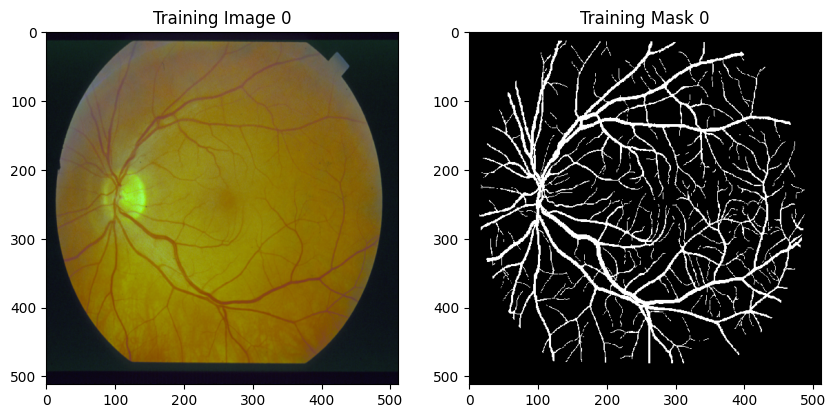

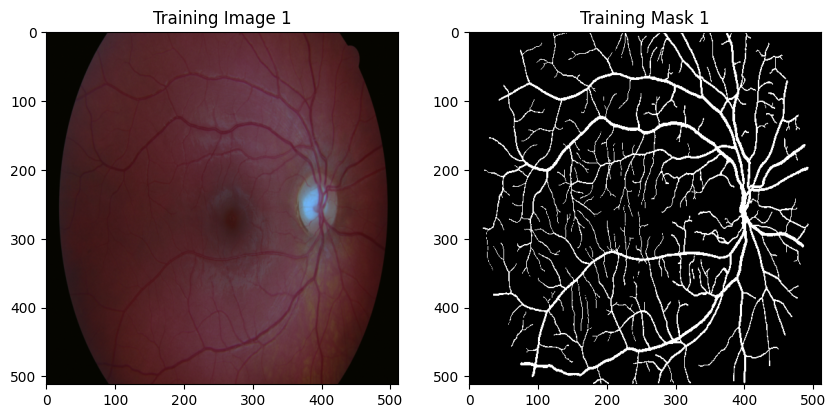

In [ ]:
show_dataloader(train_loader, num_batches=2)

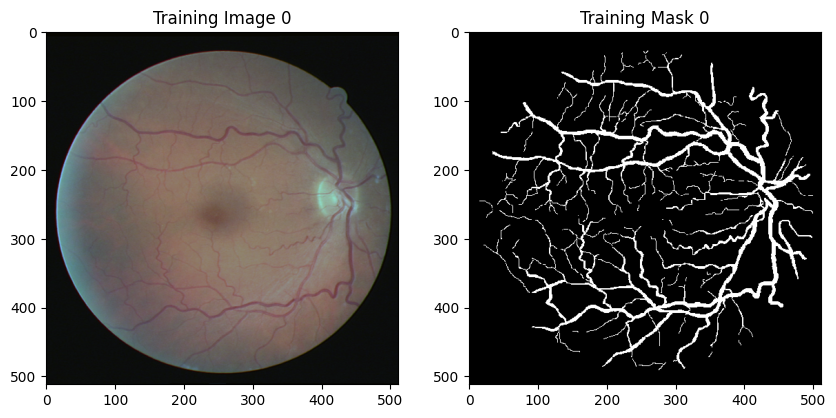

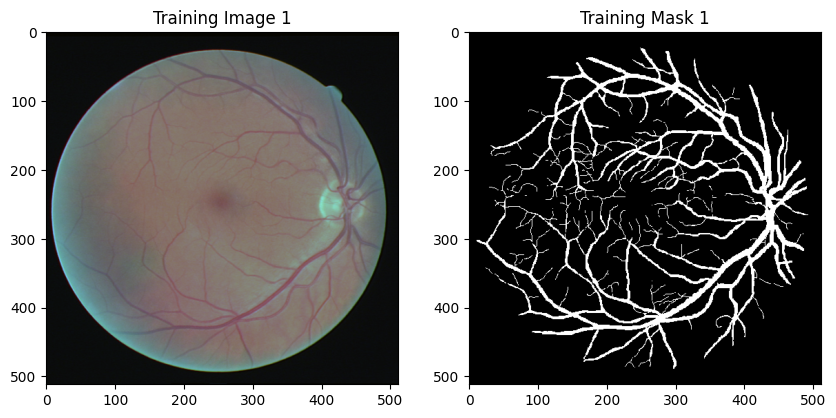

In [ ]:
show_dataloader(test_loader,num_batches = 2)

## Trainnig model
- early stopping mechanism added
- calculate val loss during training, to save the best model.pth on val
- plot the loss during training

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from tqdm import tqdm
import sys
import os
from datetime import datetime

# Define log and model save path
dir_save = "./drive/MyDrive/9517/"

os.makedirs(dir_save, exist_ok=True)

def train_unet(model, train_loader, val_loader, criterion, optimizer, num_epochs, device, model_save_path, patience=10):
    best_loss = float('inf')
    best_epoch = 0
    losses = []  # Initialize a list to store training losses for each epoch
    val_losses = []   # Store validation losses
    no_improve_epoch = 0  # Track the number of epochs without improvement

    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        train_loader_tqdm = tqdm(train_loader, desc=f"Epoch {epoch + 1}/{num_epochs} Training")

        for images, masks in train_loader_tqdm:
            images = images.to(device)
            masks = masks.to(device)

            optimizer.zero_grad()
            if model.__class__.__name__ == "DeepLabV3":
                masks = masks.squeeze(1).long()
                outputs = model(images)['out']
            elif model.__class__.__name__ == "FCN":
              outputs = model(images)['out']
            else:
                outputs = model(images)
            loss = criterion(outputs, masks)
            loss.backward()
            optimizer.step()

            running_loss += loss.item() * images.size(0)
            train_loader_tqdm.set_postfix(loss=loss.item())

        epoch_loss = running_loss / len(train_loader.dataset)
        losses.append(epoch_loss)
        print(f"Epoch {epoch + 1}/{num_epochs}, Training Loss: {epoch_loss:.4f}")

        # Calculate validation loss
        model.eval()
        with torch.no_grad():
            running_val_loss = 0.0
            for images, masks in val_loader:
                images = images.to(device)
                masks = masks.to(device)
                # outputs = model(images)
                if model.__class__.__name__ == "DeepLabV3":
                    masks = masks.squeeze(1).long()
                    outputs = model(images)['out']
                elif model.__class__.__name__ == "FCN":
                  outputs = model(images)['out']
                else:
                    outputs = model(images)
                val_loss = criterion(outputs, masks)
                running_val_loss += val_loss.item() * images.size(0)

        epoch_val_loss = running_val_loss / len(val_loader.dataset)
        val_losses.append(epoch_val_loss)
        print(f"Epoch {epoch + 1}/{num_epochs}, Validation Loss: {epoch_val_loss:.4f}")

        # Update best model (if validation loss improves)
        if epoch_val_loss < best_loss:
            best_loss = epoch_val_loss
            best_epoch = epoch
            no_improve_epoch = 0
            torch.save(model.state_dict(), model_save_path)
            print(f"Best model saved at epoch {epoch + 1} with validation loss: {best_loss:.4f}")
        else:
            no_improve_epoch += 1

        if no_improve_epoch >= patience:
          print(f"Early stopping triggered after {patience} epochs without improvement.")
          break
    print(f"Training completed. Best model was saved at epoch {best_epoch + 1} with a validation loss of {best_loss:.4f}")
    return losses, val_losses




### plot the loss during training

In [ ]:
import matplotlib.pyplot as plt

def plot_losses(train_losses, val_losses, title='Training and Validation Loss'):
    """
    Plots the training and validation loss curves from lists of losses recorded during training epochs.

    Parameters:
    - train_losses (list of floats): List containing the loss values for each training epoch.
    - val_losses (list of floats): List containing the loss values for each validation epoch.
    - title (str): The title of the plot.
    """
    plt.figure(figsize=(10, 6))
    plt.plot(train_losses, label='Training Loss', marker='o', color='blue')
    plt.plot(val_losses, label='Validation Loss', marker='x', color='red')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title(title)
    plt.grid(True)
    plt.legend()
    plt.show()


## Evaluate the model
- Metrics we used to evaluate:
  - dice_coefficient
  - IoU
  - Accuracy
- Display the input image & model predicted output & ground truth

In [ ]:
def dice_coefficient(pred, target):
    smooth = 1.0  # Add a smoothing value to prevent division by zero.
    pred_flat = pred.view(-1)
    target_flat = target.view(-1)
    intersection = (pred_flat * target_flat).sum()
    dice = (2. * intersection + smooth) / (pred_flat.sum() + target_flat.sum() + smooth)
    return dice

def iou_score(pred, target):
    pred_flat = pred.view(-1)
    target_flat = target.view(-1)
    intersection = (pred_flat * target_flat).sum()
    union = pred_flat.sum() + target_flat.sum() - intersection
    iou = (intersection + 1.0) / (union + 1.0)  # Add a small constant to avoid division by zero.
    return iou


def accuracy(pred, target):
    correct = (pred == target).float().sum()
    acc = correct / target.numel()
    return acc

def evaluate_model(model, dataloader, device):
    model.eval()  # Set the model to evaluation mode.
    total_dice = 0.0
    total_iou = 0.0
    total_acc = 0.0
    num_batches = len(dataloader)

    with torch.no_grad():
        for images, true_masks in dataloader:
            images = images.to(device)
            # true_masks = true_masks.to(device)
            true_masks = true_masks.to(device).squeeze(1)  # Ensure removing the channel dimension.
            if model.__class__.__name__ == "DeepLabV3" or model.__class__.__name__ == "FCN":
              outputs = model(images)['out']
            else:
              outputs = model(images)
            preds = torch.sigmoid(outputs)  # Apply sigmoid activation to the outputs.
            preds = (preds > 0.1).float()  # Apply a threshold to obtain binary predictions.

            if model.__class__.__name__ == "DeepLabV3":
              preds = preds[:, 1, :, :]
            else:
              preds = preds.squeeze(1)
            # print(preds.shape)
            # print(true_masks.shape)
            if preds.shape != true_masks.shape:
                print("Mismatched dimensions:", preds.shape, true_masks.shape)
                continue  # Or handle the error differently.


            dice = dice_coefficient(preds, true_masks)
            iou = iou_score(preds, true_masks)
            acc = accuracy(preds, true_masks)

            total_dice += dice.item()
            total_iou += iou.item()
            total_acc += acc.item()

    # Calculate average metrics
    avg_dice = total_dice / num_batches
    avg_iou = total_iou / num_batches
    avg_acc = total_acc / num_batches

    print(f"Average Dice Coefficient: {avg_dice:.4f}")
    print(f"Average IoU: {avg_iou:.4f}")
    print(f"Average Accuracy: {avg_acc:.4f}")


In [ ]:
import matplotlib.pyplot as plt
import torch

def evaluate_and_plot(model, dataloader, device, num_images_to_plot=3):
    model.eval()
    images_collected = []
    masks_collected = []
    preds_collected = []

    with torch.no_grad():
        for images, true_masks in dataloader:
            images = images.to(device)
            true_masks = true_masks.to(device)

            if model.__class__.__name__ == "DeepLabV3" or model.__class__.__name__ == "FCN":
                outputs = model(images)['out']
            else:
                outputs = model(images)

            preds = torch.sigmoid(outputs)  # Apply the sigmoid activation function.
            preds = (preds > 0.1).float()  # Apply thresholding.

            # Adjust the shape of the prediction results based on the model type.
            if model.__class__.__name__ == "DeepLabV3":
                preds = preds[:, 1, :, :]  # DeepLabV3 may output multiple classes.
            else:
                preds = preds.squeeze(1)  # Ensure no batch dimension.

            # Collect images, masks, and predictions for display.
            images_collected.append(images)
            masks_collected.append(true_masks)
            preds_collected.append(preds)

            # Check if enough images have been collected for display.
            if len(images_collected) >= num_images_to_plot:
                break

    # Display the collected images.
    plot_images(torch.cat(images_collected)[:num_images_to_plot],
                torch.cat(masks_collected)[:num_images_to_plot],
                torch.cat(preds_collected)[:num_images_to_plot],
                num_images=num_images_to_plot)

def plot_images(images, true_masks, preds, num_images=2):
    if num_images == 1:
        # Note that here it's changed to 1 row and 3 columns.
        fig, axs = plt.subplots(1, 3, figsize=(10, 3))
        # Force conversion to a 2D array, even if there's only one row.
        axs = axs.reshape(1, -1)
    else:
        fig, axs = plt.subplots(num_images, 3, figsize=(10, num_images * 3))

    for idx in range(num_images):
        img = images[idx].cpu().permute(1, 2, 0)
        img = (img - img.min()) / (img.max() - img.min())  # Normalize to the range 0-1.
        axs[idx, 0].imshow(img, norm=plt.Normalize(0, 1))
        axs[idx, 0].set_title('Original Image')
        axs[idx, 0].axis('off')

        axs[idx, 1].imshow(true_masks[idx].cpu().squeeze(), cmap='gray')
        axs[idx, 1].set_title('True Mask')
        axs[idx, 1].axis('off')

        axs[idx, 2].imshow(preds[idx].cpu().squeeze(), cmap='gray')
        axs[idx, 2].set_title('Predicted Mask')
        axs[idx, 2].axis('off')

    plt.show()


---
# Experiments & Results
- Baseline models experiments
- DA Comparsion experiments on ResUNet
- Improved model on the original datasets and after DA
---
## Experimental Setup

- **Loss Function**: `nn.BCEWithLogitsLoss` for binary classification.
- **Optimizer**: `optim.AdamW` with `lr=0.001` and `weight_decay=0.01`.
- **Epochs**: Set to train for max 100 epochs. (May stop earlier with no improvement on val)

## Baseline models experiments
- Baseline models on the original datasets (no Data Augmentation)
  - As our datasets size limited, did some batch size expiremnets first to choose the appropriate batch size
  - Also conduct experiments with different optimizers, choose the AdamW used in the following experiments.

### Batch Size Experiment
- **Context**: Given the small size of our dataset.
- **Experiment**: Tested batch sizes of 8 and 1.
- **Results**: A smaller batch size of 1 is more effective, likely due to more frequent updates providing better generalization on limited data.

#### Large Batch size

cuda


Epoch 1/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.02s/it, loss=0.355]


Epoch 1/100, Training Loss: 0.5017
Epoch 1/100, Validation Loss: 0.3674
Best model saved at epoch 1 with validation loss: 0.3674


Epoch 2/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.01s/it, loss=0.319]


Epoch 2/100, Training Loss: 0.2875
Epoch 2/100, Validation Loss: 0.2952
Best model saved at epoch 2 with validation loss: 0.2952


Epoch 3/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.02s/it, loss=0.223]


Epoch 3/100, Training Loss: 0.2689
Epoch 3/100, Validation Loss: 0.2835
Best model saved at epoch 3 with validation loss: 0.2835


Epoch 4/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.04s/it, loss=0.237]


Epoch 4/100, Training Loss: 0.2620
Epoch 4/100, Validation Loss: 0.2757
Best model saved at epoch 4 with validation loss: 0.2757


Epoch 5/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.04s/it, loss=0.272]


Epoch 5/100, Training Loss: 0.2561
Epoch 5/100, Validation Loss: 0.2698
Best model saved at epoch 5 with validation loss: 0.2698


Epoch 6/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.01s/it, loss=0.262]


Epoch 6/100, Training Loss: 0.2521
Epoch 6/100, Validation Loss: 0.2645
Best model saved at epoch 6 with validation loss: 0.2645


Epoch 7/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.02s/it, loss=0.225]


Epoch 7/100, Training Loss: 0.2451
Epoch 7/100, Validation Loss: 0.2577
Best model saved at epoch 7 with validation loss: 0.2577


Epoch 8/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.00s/it, loss=0.252]


Epoch 8/100, Training Loss: 0.2375
Epoch 8/100, Validation Loss: 0.2469
Best model saved at epoch 8 with validation loss: 0.2469


Epoch 9/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.02s/it, loss=0.224]


Epoch 9/100, Training Loss: 0.2265
Epoch 9/100, Validation Loss: 0.2337
Best model saved at epoch 9 with validation loss: 0.2337


Epoch 10/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.00s/it, loss=0.193]


Epoch 10/100, Training Loss: 0.2099
Epoch 10/100, Validation Loss: 0.2200
Best model saved at epoch 10 with validation loss: 0.2200


Epoch 11/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.05s/it, loss=0.175]


Epoch 11/100, Training Loss: 0.1952
Epoch 11/100, Validation Loss: 0.2131
Best model saved at epoch 11 with validation loss: 0.2131


Epoch 12/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.00s/it, loss=0.191]


Epoch 12/100, Training Loss: 0.1847
Epoch 12/100, Validation Loss: 0.2003
Best model saved at epoch 12 with validation loss: 0.2003


Epoch 13/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.01s/it, loss=0.153]


Epoch 13/100, Training Loss: 0.1752
Epoch 13/100, Validation Loss: 0.1988
Best model saved at epoch 13 with validation loss: 0.1988


Epoch 14/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.00s/it, loss=0.185]


Epoch 14/100, Training Loss: 0.1686
Epoch 14/100, Validation Loss: 0.1876
Best model saved at epoch 14 with validation loss: 0.1876


Epoch 15/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.03s/it, loss=0.17]


Epoch 15/100, Training Loss: 0.1640
Epoch 15/100, Validation Loss: 0.1881


Epoch 16/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.00s/it, loss=0.171]


Epoch 16/100, Training Loss: 0.1582
Epoch 16/100, Validation Loss: 0.1814
Best model saved at epoch 16 with validation loss: 0.1814


Epoch 17/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.00s/it, loss=0.161]


Epoch 17/100, Training Loss: 0.1558
Epoch 17/100, Validation Loss: 0.1728
Best model saved at epoch 17 with validation loss: 0.1728


Epoch 18/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.01s/it, loss=0.133]


Epoch 18/100, Training Loss: 0.1500
Epoch 18/100, Validation Loss: 0.1772


Epoch 19/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.02s/it, loss=0.152]


Epoch 19/100, Training Loss: 0.1474
Epoch 19/100, Validation Loss: 0.1687
Best model saved at epoch 19 with validation loss: 0.1687


Epoch 20/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.00s/it, loss=0.153]


Epoch 20/100, Training Loss: 0.1461
Epoch 20/100, Validation Loss: 0.1651
Best model saved at epoch 20 with validation loss: 0.1651


Epoch 21/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.02s/it, loss=0.153]


Epoch 21/100, Training Loss: 0.1440
Epoch 21/100, Validation Loss: 0.1642
Best model saved at epoch 21 with validation loss: 0.1642


Epoch 22/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.03s/it, loss=0.132]


Epoch 22/100, Training Loss: 0.1408
Epoch 22/100, Validation Loss: 0.1617
Best model saved at epoch 22 with validation loss: 0.1617


Epoch 23/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.00s/it, loss=0.161]


Epoch 23/100, Training Loss: 0.1380
Epoch 23/100, Validation Loss: 0.1598
Best model saved at epoch 23 with validation loss: 0.1598


Epoch 24/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.02s/it, loss=0.124]


Epoch 24/100, Training Loss: 0.1359
Epoch 24/100, Validation Loss: 0.1591
Best model saved at epoch 24 with validation loss: 0.1591


Epoch 25/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.02s/it, loss=0.144]


Epoch 25/100, Training Loss: 0.1338
Epoch 25/100, Validation Loss: 0.1570
Best model saved at epoch 25 with validation loss: 0.1570


Epoch 26/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.00s/it, loss=0.122]


Epoch 26/100, Training Loss: 0.1319
Epoch 26/100, Validation Loss: 0.1559
Best model saved at epoch 26 with validation loss: 0.1559


Epoch 27/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.00s/it, loss=0.132]


Epoch 27/100, Training Loss: 0.1309
Epoch 27/100, Validation Loss: 0.1538
Best model saved at epoch 27 with validation loss: 0.1538


Epoch 28/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.03s/it, loss=0.133]


Epoch 28/100, Training Loss: 0.1289
Epoch 28/100, Validation Loss: 0.1592


Epoch 29/100 Training: 100%|██████████| 9/9 [00:08<00:00,  1.01it/s, loss=0.112]


Epoch 29/100, Training Loss: 0.1283
Epoch 29/100, Validation Loss: 0.1554


Epoch 30/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.01s/it, loss=0.132]


Epoch 30/100, Training Loss: 0.1283
Epoch 30/100, Validation Loss: 0.1499
Best model saved at epoch 30 with validation loss: 0.1499


Epoch 31/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.03s/it, loss=0.128]


Epoch 31/100, Training Loss: 0.1257
Epoch 31/100, Validation Loss: 0.1485
Best model saved at epoch 31 with validation loss: 0.1485


Epoch 32/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.02s/it, loss=0.12]


Epoch 32/100, Training Loss: 0.1243
Epoch 32/100, Validation Loss: 0.1492


Epoch 33/100 Training: 100%|██████████| 9/9 [00:08<00:00,  1.00it/s, loss=0.126]


Epoch 33/100, Training Loss: 0.1221
Epoch 33/100, Validation Loss: 0.1499


Epoch 34/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.01s/it, loss=0.139]


Epoch 34/100, Training Loss: 0.1216
Epoch 34/100, Validation Loss: 0.1458
Best model saved at epoch 34 with validation loss: 0.1458


Epoch 35/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.05s/it, loss=0.11]


Epoch 35/100, Training Loss: 0.1197
Epoch 35/100, Validation Loss: 0.1432
Best model saved at epoch 35 with validation loss: 0.1432


Epoch 36/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.02s/it, loss=0.12]


Epoch 36/100, Training Loss: 0.1183
Epoch 36/100, Validation Loss: 0.1431
Best model saved at epoch 36 with validation loss: 0.1431


Epoch 37/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.05s/it, loss=0.127]


Epoch 37/100, Training Loss: 0.1165
Epoch 37/100, Validation Loss: 0.1473


Epoch 38/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.02s/it, loss=0.124]


Epoch 38/100, Training Loss: 0.1169
Epoch 38/100, Validation Loss: 0.1483


Epoch 39/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.03s/it, loss=0.121]


Epoch 39/100, Training Loss: 0.1156
Epoch 39/100, Validation Loss: 0.1443


Epoch 40/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.02s/it, loss=0.129]


Epoch 40/100, Training Loss: 0.1156
Epoch 40/100, Validation Loss: 0.1424
Best model saved at epoch 40 with validation loss: 0.1424


Epoch 41/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.01s/it, loss=0.102]


Epoch 41/100, Training Loss: 0.1159
Epoch 41/100, Validation Loss: 0.1576


Epoch 42/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.03s/it, loss=0.106]


Epoch 42/100, Training Loss: 0.1163
Epoch 42/100, Validation Loss: 0.1428


Epoch 43/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.03s/it, loss=0.109]


Epoch 43/100, Training Loss: 0.1144
Epoch 43/100, Validation Loss: 0.1408
Best model saved at epoch 43 with validation loss: 0.1408


Epoch 44/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.02s/it, loss=0.134]


Epoch 44/100, Training Loss: 0.1170
Epoch 44/100, Validation Loss: 0.1384
Best model saved at epoch 44 with validation loss: 0.1384


Epoch 45/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.07s/it, loss=0.11]


Epoch 45/100, Training Loss: 0.1166
Epoch 45/100, Validation Loss: 0.1435


Epoch 46/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.01s/it, loss=0.111]


Epoch 46/100, Training Loss: 0.1139
Epoch 46/100, Validation Loss: 0.1361
Best model saved at epoch 46 with validation loss: 0.1361


Epoch 47/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.04s/it, loss=0.0919]


Epoch 47/100, Training Loss: 0.1096
Epoch 47/100, Validation Loss: 0.1373


Epoch 48/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.05s/it, loss=0.0814]


Epoch 48/100, Training Loss: 0.1073
Epoch 48/100, Validation Loss: 0.1435


Epoch 49/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.00s/it, loss=0.116]


Epoch 49/100, Training Loss: 0.1085
Epoch 49/100, Validation Loss: 0.1369


Epoch 50/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.02s/it, loss=0.106]


Epoch 50/100, Training Loss: 0.1076
Epoch 50/100, Validation Loss: 0.1345
Best model saved at epoch 50 with validation loss: 0.1345


Epoch 51/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.02s/it, loss=0.122]


Epoch 51/100, Training Loss: 0.1051
Epoch 51/100, Validation Loss: 0.1358


Epoch 52/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.04s/it, loss=0.112]


Epoch 52/100, Training Loss: 0.1045
Epoch 52/100, Validation Loss: 0.1362


Epoch 53/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.01s/it, loss=0.0863]


Epoch 53/100, Training Loss: 0.1032
Epoch 53/100, Validation Loss: 0.1359


Epoch 54/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.03s/it, loss=0.12]


Epoch 54/100, Training Loss: 0.1034
Epoch 54/100, Validation Loss: 0.1374


Epoch 55/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.00s/it, loss=0.0967]


Epoch 55/100, Training Loss: 0.1016
Epoch 55/100, Validation Loss: 0.1337
Best model saved at epoch 55 with validation loss: 0.1337


Epoch 56/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.04s/it, loss=0.107]


Epoch 56/100, Training Loss: 0.1009
Epoch 56/100, Validation Loss: 0.1326
Best model saved at epoch 56 with validation loss: 0.1326


Epoch 57/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.03s/it, loss=0.0993]


Epoch 57/100, Training Loss: 0.1008
Epoch 57/100, Validation Loss: 0.1328


Epoch 58/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.02s/it, loss=0.0976]


Epoch 58/100, Training Loss: 0.0999
Epoch 58/100, Validation Loss: 0.1347


Epoch 59/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.06s/it, loss=0.115]


Epoch 59/100, Training Loss: 0.1002
Epoch 59/100, Validation Loss: 0.1358


Epoch 60/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.01s/it, loss=0.104]


Epoch 60/100, Training Loss: 0.0991
Epoch 60/100, Validation Loss: 0.1335


Epoch 61/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.03s/it, loss=0.109]


Epoch 61/100, Training Loss: 0.0982
Epoch 61/100, Validation Loss: 0.1321
Best model saved at epoch 61 with validation loss: 0.1321


Epoch 62/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.04s/it, loss=0.109]


Epoch 62/100, Training Loss: 0.0994
Epoch 62/100, Validation Loss: 0.1405


Epoch 63/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.04s/it, loss=0.0789]


Epoch 63/100, Training Loss: 0.0985
Epoch 63/100, Validation Loss: 0.1349


Epoch 64/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.06s/it, loss=0.0895]


Epoch 64/100, Training Loss: 0.0971
Epoch 64/100, Validation Loss: 0.1339


Epoch 65/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.02s/it, loss=0.0972]


Epoch 65/100, Training Loss: 0.0968
Epoch 65/100, Validation Loss: 0.1351


Epoch 66/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.07s/it, loss=0.0947]


Epoch 66/100, Training Loss: 0.0965
Epoch 66/100, Validation Loss: 0.1324


Epoch 67/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.00s/it, loss=0.0832]


Epoch 67/100, Training Loss: 0.0957
Epoch 67/100, Validation Loss: 0.1341


Epoch 68/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.03s/it, loss=0.0883]


Epoch 68/100, Training Loss: 0.0947
Epoch 68/100, Validation Loss: 0.1316
Best model saved at epoch 68 with validation loss: 0.1316


Epoch 69/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.03s/it, loss=0.0911]


Epoch 69/100, Training Loss: 0.0948
Epoch 69/100, Validation Loss: 0.1314
Best model saved at epoch 69 with validation loss: 0.1314


Epoch 70/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.04s/it, loss=0.102]


Epoch 70/100, Training Loss: 0.0943
Epoch 70/100, Validation Loss: 0.1327


Epoch 71/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.02s/it, loss=0.0854]


Epoch 71/100, Training Loss: 0.0939
Epoch 71/100, Validation Loss: 0.1331


Epoch 72/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.01s/it, loss=0.0845]


Epoch 72/100, Training Loss: 0.0936
Epoch 72/100, Validation Loss: 0.1396


Epoch 73/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.02s/it, loss=0.0991]


Epoch 73/100, Training Loss: 0.0985
Epoch 73/100, Validation Loss: 0.1268
Best model saved at epoch 73 with validation loss: 0.1268


Epoch 74/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.03s/it, loss=0.104]


Epoch 74/100, Training Loss: 0.0957
Epoch 74/100, Validation Loss: 0.1301


Epoch 75/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.00s/it, loss=0.0991]


Epoch 75/100, Training Loss: 0.0979
Epoch 75/100, Validation Loss: 0.1323


Epoch 76/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.02s/it, loss=0.101]


Epoch 76/100, Training Loss: 0.0957
Epoch 76/100, Validation Loss: 0.1302


Epoch 77/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.03s/it, loss=0.09]


Epoch 77/100, Training Loss: 0.0938
Epoch 77/100, Validation Loss: 0.1336


Epoch 78/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.01s/it, loss=0.0911]


Epoch 78/100, Training Loss: 0.0926
Epoch 78/100, Validation Loss: 0.1315


Epoch 79/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.00s/it, loss=0.0967]


Epoch 79/100, Training Loss: 0.0918
Epoch 79/100, Validation Loss: 0.1319


Epoch 80/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.02s/it, loss=0.0922]


Epoch 80/100, Training Loss: 0.0908
Epoch 80/100, Validation Loss: 0.1317


Epoch 81/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.04s/it, loss=0.0907]


Epoch 81/100, Training Loss: 0.0903
Epoch 81/100, Validation Loss: 0.1324


Epoch 82/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.01s/it, loss=0.0953]


Epoch 82/100, Training Loss: 0.0898
Epoch 82/100, Validation Loss: 0.1311


Epoch 83/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.02s/it, loss=0.09]


Epoch 83/100, Training Loss: 0.0895
Epoch 83/100, Validation Loss: 0.1320
Early stopping triggered after 10 epochs without improvement.
Training completed. Best model was saved at epoch 73 with a validation loss of 0.1268


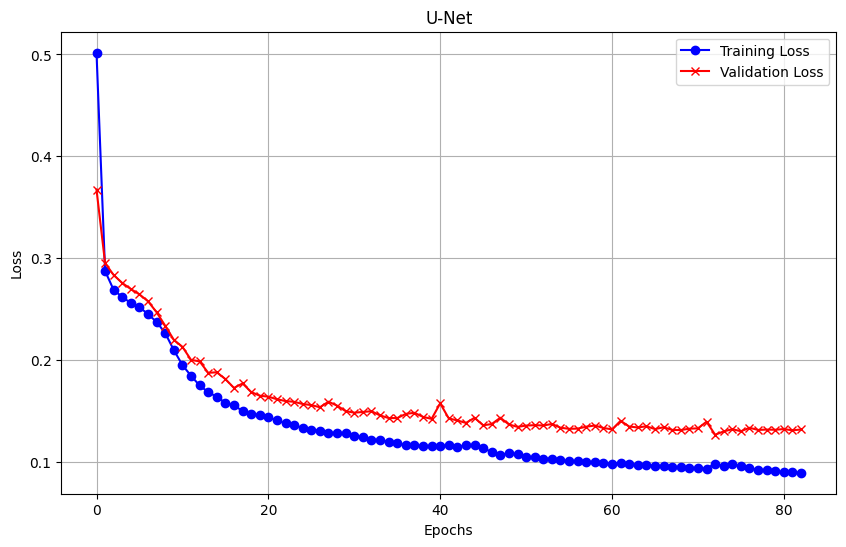

In [ ]:
"""
  Large batch size = 8
  Time-comsuming: 10min
  loss on val: 0.1413
"""
# init U-Net model

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)
model = ResNetUNet(n_class=1).to(device)


# init training parameters
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(model.parameters(), lr=0.0001)
num_epochs = 100
batch_size=8

model_save_path = os.path.join(dir_save, f'best_model_{batch_size}.pth')
train_loader = DataLoader(train_dataset, batch_size, shuffle=True)

train_loss, val_loss = train_unet(model, train_loader, val_loader, criterion, optimizer, num_epochs, device, model_save_path)


cuda


Epoch 1/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.01s/it, loss=0.279]


Epoch 1/100, Training Loss: 0.5952
Epoch 1/100, Validation Loss: 0.3693
Best model saved at epoch 1 with validation loss: 0.3693


Epoch 2/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.02s/it, loss=0.314]


Epoch 2/100, Training Loss: 0.3138
Epoch 2/100, Validation Loss: 0.3238
Best model saved at epoch 2 with validation loss: 0.3238


Epoch 3/100 Training: 100%|██████████| 9/9 [00:08<00:00,  1.01it/s, loss=0.28]


Epoch 3/100, Training Loss: 0.2928
Epoch 3/100, Validation Loss: 0.3017
Best model saved at epoch 3 with validation loss: 0.3017


Epoch 4/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.01s/it, loss=0.27]


Epoch 4/100, Training Loss: 0.2731
Epoch 4/100, Validation Loss: 0.2752
Best model saved at epoch 4 with validation loss: 0.2752


Epoch 5/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.03s/it, loss=0.215]


Epoch 5/100, Training Loss: 0.2454
Epoch 5/100, Validation Loss: 0.2415
Best model saved at epoch 5 with validation loss: 0.2415


Epoch 6/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.00s/it, loss=0.195]


Epoch 6/100, Training Loss: 0.2183
Epoch 6/100, Validation Loss: 0.2253
Best model saved at epoch 6 with validation loss: 0.2253


Epoch 7/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.00s/it, loss=0.239]


Epoch 7/100, Training Loss: 0.1967
Epoch 7/100, Validation Loss: 0.2069
Best model saved at epoch 7 with validation loss: 0.2069


Epoch 8/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.03s/it, loss=0.186]


Epoch 8/100, Training Loss: 0.1893
Epoch 8/100, Validation Loss: 0.2104


Epoch 9/100 Training: 100%|██████████| 9/9 [00:08<00:00,  1.01it/s, loss=0.195]


Epoch 9/100, Training Loss: 0.1814
Epoch 9/100, Validation Loss: 0.1952
Best model saved at epoch 9 with validation loss: 0.1952


Epoch 10/100 Training: 100%|██████████| 9/9 [00:08<00:00,  1.01it/s, loss=0.149]


Epoch 10/100, Training Loss: 0.1736
Epoch 10/100, Validation Loss: 0.1920
Best model saved at epoch 10 with validation loss: 0.1920


Epoch 11/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.01s/it, loss=0.151]


Epoch 11/100, Training Loss: 0.1684
Epoch 11/100, Validation Loss: 0.1844
Best model saved at epoch 11 with validation loss: 0.1844


Epoch 12/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.01s/it, loss=0.164]


Epoch 12/100, Training Loss: 0.1640
Epoch 12/100, Validation Loss: 0.1836
Best model saved at epoch 12 with validation loss: 0.1836


Epoch 13/100 Training: 100%|██████████| 9/9 [00:08<00:00,  1.01it/s, loss=0.165]


Epoch 13/100, Training Loss: 0.1599
Epoch 13/100, Validation Loss: 0.1802
Best model saved at epoch 13 with validation loss: 0.1802


Epoch 14/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.01s/it, loss=0.179]


Epoch 14/100, Training Loss: 0.1601
Epoch 14/100, Validation Loss: 0.1740
Best model saved at epoch 14 with validation loss: 0.1740


Epoch 15/100 Training: 100%|██████████| 9/9 [00:08<00:00,  1.01it/s, loss=0.183]


Epoch 15/100, Training Loss: 0.1572
Epoch 15/100, Validation Loss: 0.1742


Epoch 16/100 Training: 100%|██████████| 9/9 [00:08<00:00,  1.01it/s, loss=0.146]


Epoch 16/100, Training Loss: 0.1561
Epoch 16/100, Validation Loss: 0.1745


Epoch 17/100 Training: 100%|██████████| 9/9 [00:08<00:00,  1.01it/s, loss=0.138]


Epoch 17/100, Training Loss: 0.1487
Epoch 17/100, Validation Loss: 0.1623
Best model saved at epoch 17 with validation loss: 0.1623


Epoch 18/100 Training: 100%|██████████| 9/9 [00:08<00:00,  1.01it/s, loss=0.126]


Epoch 18/100, Training Loss: 0.1397
Epoch 18/100, Validation Loss: 0.1566
Best model saved at epoch 18 with validation loss: 0.1566


Epoch 19/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.01s/it, loss=0.141]


Epoch 19/100, Training Loss: 0.1373
Epoch 19/100, Validation Loss: 0.1535
Best model saved at epoch 19 with validation loss: 0.1535


Epoch 20/100 Training: 100%|██████████| 9/9 [00:08<00:00,  1.01it/s, loss=0.136]


Epoch 20/100, Training Loss: 0.1334
Epoch 20/100, Validation Loss: 0.1506
Best model saved at epoch 20 with validation loss: 0.1506


Epoch 21/100 Training: 100%|██████████| 9/9 [00:08<00:00,  1.02it/s, loss=0.136]


Epoch 21/100, Training Loss: 0.1343
Epoch 21/100, Validation Loss: 0.1620


Epoch 22/100 Training: 100%|██████████| 9/9 [00:08<00:00,  1.01it/s, loss=0.145]


Epoch 22/100, Training Loss: 0.1326
Epoch 22/100, Validation Loss: 0.1500
Best model saved at epoch 22 with validation loss: 0.1500


Epoch 23/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.01s/it, loss=0.161]


Epoch 23/100, Training Loss: 0.1280
Epoch 23/100, Validation Loss: 0.1460
Best model saved at epoch 23 with validation loss: 0.1460


Epoch 24/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.01s/it, loss=0.12]


Epoch 24/100, Training Loss: 0.1245
Epoch 24/100, Validation Loss: 0.1469


Epoch 25/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.01s/it, loss=0.131]


Epoch 25/100, Training Loss: 0.1220
Epoch 25/100, Validation Loss: 0.1422
Best model saved at epoch 25 with validation loss: 0.1422


Epoch 26/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.05s/it, loss=0.115]


Epoch 26/100, Training Loss: 0.1227
Epoch 26/100, Validation Loss: 0.1721


Epoch 27/100 Training: 100%|██████████| 9/9 [00:08<00:00,  1.01it/s, loss=0.123]


Epoch 27/100, Training Loss: 0.1262
Epoch 27/100, Validation Loss: 0.1442


Epoch 28/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.02s/it, loss=0.113]


Epoch 28/100, Training Loss: 0.1220
Epoch 28/100, Validation Loss: 0.1406
Best model saved at epoch 28 with validation loss: 0.1406


Epoch 29/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.03s/it, loss=0.123]


Epoch 29/100, Training Loss: 0.1205
Epoch 29/100, Validation Loss: 0.1403
Best model saved at epoch 29 with validation loss: 0.1403


Epoch 30/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.01s/it, loss=0.12]


Epoch 30/100, Training Loss: 0.1178
Epoch 30/100, Validation Loss: 0.1378
Best model saved at epoch 30 with validation loss: 0.1378


Epoch 31/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.03s/it, loss=0.115]


Epoch 31/100, Training Loss: 0.1155
Epoch 31/100, Validation Loss: 0.1365
Best model saved at epoch 31 with validation loss: 0.1365


Epoch 32/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.02s/it, loss=0.123]


Epoch 32/100, Training Loss: 0.1144
Epoch 32/100, Validation Loss: 0.1387


Epoch 33/100 Training: 100%|██████████| 9/9 [00:08<00:00,  1.00it/s, loss=0.123]


Epoch 33/100, Training Loss: 0.1139
Epoch 33/100, Validation Loss: 0.1356
Best model saved at epoch 33 with validation loss: 0.1356


Epoch 34/100 Training: 100%|██████████| 9/9 [00:08<00:00,  1.01it/s, loss=0.113]


Epoch 34/100, Training Loss: 0.1135
Epoch 34/100, Validation Loss: 0.1354
Best model saved at epoch 34 with validation loss: 0.1354


Epoch 35/100 Training: 100%|██████████| 9/9 [00:08<00:00,  1.00it/s, loss=0.0966]


Epoch 35/100, Training Loss: 0.1130
Epoch 35/100, Validation Loss: 0.1344
Best model saved at epoch 35 with validation loss: 0.1344


Epoch 36/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.01s/it, loss=0.112]


Epoch 36/100, Training Loss: 0.1102
Epoch 36/100, Validation Loss: 0.1334
Best model saved at epoch 36 with validation loss: 0.1334


Epoch 37/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.03s/it, loss=0.0988]


Epoch 37/100, Training Loss: 0.1164
Epoch 37/100, Validation Loss: 0.1432


Epoch 38/100 Training: 100%|██████████| 9/9 [00:08<00:00,  1.02it/s, loss=0.11]


Epoch 38/100, Training Loss: 0.1122
Epoch 38/100, Validation Loss: 0.1349


Epoch 39/100 Training: 100%|██████████| 9/9 [00:08<00:00,  1.01it/s, loss=0.0985]


Epoch 39/100, Training Loss: 0.1096
Epoch 39/100, Validation Loss: 0.1419


Epoch 40/100 Training: 100%|██████████| 9/9 [00:08<00:00,  1.01it/s, loss=0.123]


Epoch 40/100, Training Loss: 0.1097
Epoch 40/100, Validation Loss: 0.1351


Epoch 41/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.03s/it, loss=0.095]


Epoch 41/100, Training Loss: 0.1065
Epoch 41/100, Validation Loss: 0.1372


Epoch 42/100 Training: 100%|██████████| 9/9 [00:08<00:00,  1.01it/s, loss=0.121]


Epoch 42/100, Training Loss: 0.1063
Epoch 42/100, Validation Loss: 0.1311
Best model saved at epoch 42 with validation loss: 0.1311


Epoch 43/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.01s/it, loss=0.107]


Epoch 43/100, Training Loss: 0.1064
Epoch 43/100, Validation Loss: 0.1338


Epoch 44/100 Training: 100%|██████████| 9/9 [00:08<00:00,  1.01it/s, loss=0.102]


Epoch 44/100, Training Loss: 0.1059
Epoch 44/100, Validation Loss: 0.1321


Epoch 45/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.01s/it, loss=0.113]


Epoch 45/100, Training Loss: 0.1057
Epoch 45/100, Validation Loss: 0.1437


Epoch 46/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.00s/it, loss=0.104]


Epoch 46/100, Training Loss: 0.1045
Epoch 46/100, Validation Loss: 0.1363


Epoch 47/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.00s/it, loss=0.0988]


Epoch 47/100, Training Loss: 0.1037
Epoch 47/100, Validation Loss: 0.1325


Epoch 48/100 Training: 100%|██████████| 9/9 [00:08<00:00,  1.01it/s, loss=0.0977]


Epoch 48/100, Training Loss: 0.1033
Epoch 48/100, Validation Loss: 0.1307
Best model saved at epoch 48 with validation loss: 0.1307


Epoch 49/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.01s/it, loss=0.099]


Epoch 49/100, Training Loss: 0.1018
Epoch 49/100, Validation Loss: 0.1292
Best model saved at epoch 49 with validation loss: 0.1292


Epoch 50/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.02s/it, loss=0.0961]


Epoch 50/100, Training Loss: 0.1008
Epoch 50/100, Validation Loss: 0.1288
Best model saved at epoch 50 with validation loss: 0.1288


Epoch 51/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.01s/it, loss=0.094]


Epoch 51/100, Training Loss: 0.1008
Epoch 51/100, Validation Loss: 0.1445


Epoch 52/100 Training: 100%|██████████| 9/9 [00:08<00:00,  1.01it/s, loss=0.114]


Epoch 52/100, Training Loss: 0.1027
Epoch 52/100, Validation Loss: 0.1276
Best model saved at epoch 52 with validation loss: 0.1276


Epoch 53/100 Training: 100%|██████████| 9/9 [00:08<00:00,  1.01it/s, loss=0.109]


Epoch 53/100, Training Loss: 0.0999
Epoch 53/100, Validation Loss: 0.1277


Epoch 54/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.00s/it, loss=0.0926]


Epoch 54/100, Training Loss: 0.1010
Epoch 54/100, Validation Loss: 0.1445


Epoch 55/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.00s/it, loss=0.118]


Epoch 55/100, Training Loss: 0.1034
Epoch 55/100, Validation Loss: 0.1292


Epoch 56/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.00s/it, loss=0.1]


Epoch 56/100, Training Loss: 0.0997
Epoch 56/100, Validation Loss: 0.1266
Best model saved at epoch 56 with validation loss: 0.1266


Epoch 57/100 Training: 100%|██████████| 9/9 [00:08<00:00,  1.01it/s, loss=0.0977]


Epoch 57/100, Training Loss: 0.1007
Epoch 57/100, Validation Loss: 0.1515


Epoch 58/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.00s/it, loss=0.111]


Epoch 58/100, Training Loss: 0.0991
Epoch 58/100, Validation Loss: 0.1310


Epoch 59/100 Training: 100%|██████████| 9/9 [00:08<00:00,  1.00it/s, loss=0.102]


Epoch 59/100, Training Loss: 0.0989
Epoch 59/100, Validation Loss: 0.1440


Epoch 60/100 Training: 100%|██████████| 9/9 [00:08<00:00,  1.00it/s, loss=0.105]


Epoch 60/100, Training Loss: 0.0977
Epoch 60/100, Validation Loss: 0.1258
Best model saved at epoch 60 with validation loss: 0.1258


Epoch 61/100 Training: 100%|██████████| 9/9 [00:08<00:00,  1.01it/s, loss=0.089]


Epoch 61/100, Training Loss: 0.0977
Epoch 61/100, Validation Loss: 0.1298


Epoch 62/100 Training: 100%|██████████| 9/9 [00:08<00:00,  1.01it/s, loss=0.114]


Epoch 62/100, Training Loss: 0.0968
Epoch 62/100, Validation Loss: 0.1269


Epoch 63/100 Training: 100%|██████████| 9/9 [00:08<00:00,  1.02it/s, loss=0.0938]


Epoch 63/100, Training Loss: 0.0945
Epoch 63/100, Validation Loss: 0.1264


Epoch 64/100 Training: 100%|██████████| 9/9 [00:08<00:00,  1.01it/s, loss=0.0956]


Epoch 64/100, Training Loss: 0.0938
Epoch 64/100, Validation Loss: 0.1349


Epoch 65/100 Training: 100%|██████████| 9/9 [00:08<00:00,  1.01it/s, loss=0.084]


Epoch 65/100, Training Loss: 0.0936
Epoch 65/100, Validation Loss: 0.1304


Epoch 66/100 Training: 100%|██████████| 9/9 [00:08<00:00,  1.01it/s, loss=0.0993]


Epoch 66/100, Training Loss: 0.0963
Epoch 66/100, Validation Loss: 0.1312


Epoch 67/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.02s/it, loss=0.0906]


Epoch 67/100, Training Loss: 0.0934
Epoch 67/100, Validation Loss: 0.1267


Epoch 68/100 Training: 100%|██████████| 9/9 [00:08<00:00,  1.01it/s, loss=0.0983]


Epoch 68/100, Training Loss: 0.0945
Epoch 68/100, Validation Loss: 0.1367


Epoch 69/100 Training: 100%|██████████| 9/9 [00:09<00:00,  1.02s/it, loss=0.0942]


Epoch 69/100, Training Loss: 0.0922
Epoch 69/100, Validation Loss: 0.1325


Epoch 70/100 Training: 100%|██████████| 9/9 [00:08<00:00,  1.02it/s, loss=0.0861]


Epoch 70/100, Training Loss: 0.0910
Epoch 70/100, Validation Loss: 0.1278
Early stopping triggered after 10 epochs without improvement.
Training completed. Best model was saved at epoch 60 with a validation loss of 0.1258


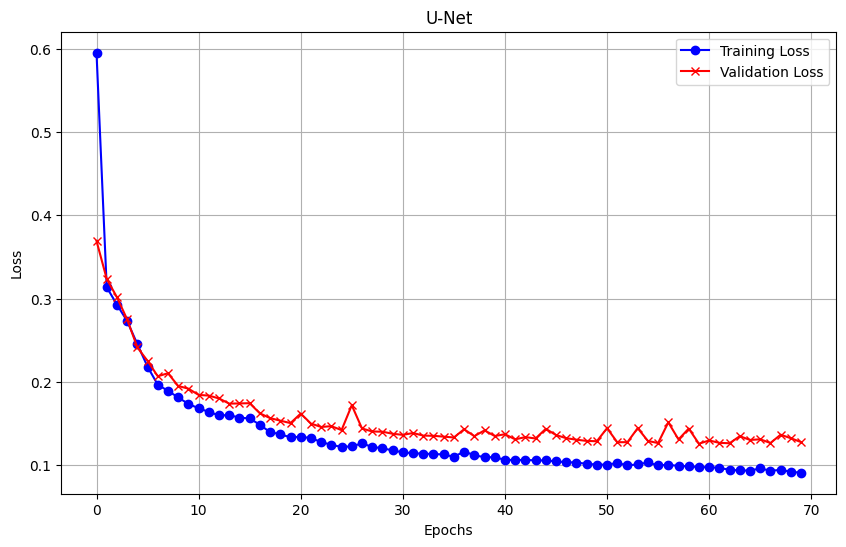

In [ ]:
# change optimizer to AdamW
"""
  Large batch size = 8
  Time-comsuming: 11min
  loss on val: 0.12
"""
# init U-Net model

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)
model = ResNetUNet(n_class=1).to(device)


# init training parameters
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.AdamW(model.parameters(), lr=0.001, weight_decay=0.01)

num_epochs = 100
batch_size=8

model_save_path = os.path.join(dir_save, f'best_model_{batch_size}_adamw.pth')
train_loader = DataLoader(train_dataset, batch_size, shuffle=True)

train_loss, val_loss = train_unet(model, train_loader, val_loader, criterion, optimizer, num_epochs, device, model_save_path)

plot_losses(train_loss, val_loss, title='U-Net')

In [ ]:
model_path = os.path.join(dir_save, f'best_model_{batch_size}.pth')
model.load_state_dict(torch.load(model_path))
evaluate_model(model, test_loader, device)

Average Dice Coefficient: 0.6224
Average IoU: 0.4574
Average Accuracy: 0.9120


#### Small Batch size

In [ ]:
# Small batch size = 1
"""
  Small batch size = 1
  Time-comsuming: 4 min
  loss on val: 0.1164
"""

# init U-Net model

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)
model = ResNetUNet(n_class=1).to(device)


# init training parameters
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.AdamW(model.parameters(), lr=0.001, weight_decay=0.01)
num_epochs = 100

batch_size=1

model_save_path = os.path.join(dir_save, f'best_model_{batch_size}.pth')
train_loader = DataLoader(train_dataset, batch_size, shuffle=False)

train_loss, val_loss = train_unet(model, train_loader, val_loader, criterion, optimizer, num_epochs, device, model_save_path)

cuda


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Epoch 1/100 Training: 100%|██████████| 70/70 [00:09<00:00,  7.67it/s, loss=0.136]


Epoch 1/100, Training Loss: 0.2985
Epoch 1/100, Validation Loss: 0.1866
Best model saved at epoch 1 with validation loss: 0.1866


Epoch 2/100 Training: 100%|██████████| 70/70 [00:09<00:00,  7.67it/s, loss=0.117]


Epoch 2/100, Training Loss: 0.1783
Epoch 2/100, Validation Loss: 0.1698
Best model saved at epoch 2 with validation loss: 0.1698


Epoch 3/100 Training: 100%|██████████| 70/70 [00:09<00:00,  7.71it/s, loss=0.101]


Epoch 3/100, Training Loss: 0.1595
Epoch 3/100, Validation Loss: 0.1516
Best model saved at epoch 3 with validation loss: 0.1516


Epoch 4/100 Training: 100%|██████████| 70/70 [00:09<00:00,  7.60it/s, loss=0.0922]


Epoch 4/100, Training Loss: 0.1436
Epoch 4/100, Validation Loss: 0.1408
Best model saved at epoch 4 with validation loss: 0.1408


Epoch 5/100 Training: 100%|██████████| 70/70 [00:09<00:00,  7.60it/s, loss=0.0894]


Epoch 5/100, Training Loss: 0.1361
Epoch 5/100, Validation Loss: 0.1329
Best model saved at epoch 5 with validation loss: 0.1329


Epoch 6/100 Training: 100%|██████████| 70/70 [00:09<00:00,  7.61it/s, loss=0.0867]


Epoch 6/100, Training Loss: 0.1292
Epoch 6/100, Validation Loss: 0.1305
Best model saved at epoch 6 with validation loss: 0.1305


Epoch 7/100 Training: 100%|██████████| 70/70 [00:09<00:00,  7.74it/s, loss=0.0859]


Epoch 7/100, Training Loss: 0.1269
Epoch 7/100, Validation Loss: 0.1260
Best model saved at epoch 7 with validation loss: 0.1260


Epoch 8/100 Training: 100%|██████████| 70/70 [00:09<00:00,  7.62it/s, loss=0.0833]


Epoch 8/100, Training Loss: 0.1242
Epoch 8/100, Validation Loss: 0.1247
Best model saved at epoch 8 with validation loss: 0.1247


Epoch 9/100 Training: 100%|██████████| 70/70 [00:09<00:00,  7.76it/s, loss=0.0809]


Epoch 9/100, Training Loss: 0.1206
Epoch 9/100, Validation Loss: 0.1221
Best model saved at epoch 9 with validation loss: 0.1221


Epoch 10/100 Training: 100%|██████████| 70/70 [00:09<00:00,  7.68it/s, loss=0.0818]


Epoch 10/100, Training Loss: 0.1181
Epoch 10/100, Validation Loss: 0.1274


Epoch 11/100 Training: 100%|██████████| 70/70 [00:09<00:00,  7.70it/s, loss=0.0841]


Epoch 11/100, Training Loss: 0.1164
Epoch 11/100, Validation Loss: 0.1203
Best model saved at epoch 11 with validation loss: 0.1203


Epoch 12/100 Training: 100%|██████████| 70/70 [00:09<00:00,  7.73it/s, loss=0.0898]


Epoch 12/100, Training Loss: 0.1171
Epoch 12/100, Validation Loss: 0.1225


Epoch 13/100 Training: 100%|██████████| 70/70 [00:09<00:00,  7.70it/s, loss=0.0923]


Epoch 13/100, Training Loss: 0.1123
Epoch 13/100, Validation Loss: 0.1247


Epoch 14/100 Training: 100%|██████████| 70/70 [00:09<00:00,  7.75it/s, loss=0.088]


Epoch 14/100, Training Loss: 0.1091
Epoch 14/100, Validation Loss: 0.1250


Epoch 15/100 Training: 100%|██████████| 70/70 [00:08<00:00,  7.79it/s, loss=0.0862]


Epoch 15/100, Training Loss: 0.1066
Epoch 15/100, Validation Loss: 0.1222


Epoch 16/100 Training: 100%|██████████| 70/70 [00:09<00:00,  7.72it/s, loss=0.0817]


Epoch 16/100, Training Loss: 0.1047
Epoch 16/100, Validation Loss: 0.1204


Epoch 17/100 Training: 100%|██████████| 70/70 [00:09<00:00,  7.75it/s, loss=0.0741]


Epoch 17/100, Training Loss: 0.1013
Epoch 17/100, Validation Loss: 0.1164
Best model saved at epoch 17 with validation loss: 0.1164


Epoch 18/100 Training: 100%|██████████| 70/70 [00:09<00:00,  7.59it/s, loss=0.0688]


Epoch 18/100, Training Loss: 0.0986
Epoch 18/100, Validation Loss: 0.1185


Epoch 19/100 Training: 100%|██████████| 70/70 [00:09<00:00,  7.76it/s, loss=0.0791]


Epoch 19/100, Training Loss: 0.0963
Epoch 19/100, Validation Loss: 0.1177


Epoch 20/100 Training: 100%|██████████| 70/70 [00:08<00:00,  7.80it/s, loss=0.0665]


Epoch 20/100, Training Loss: 0.0972
Epoch 20/100, Validation Loss: 0.1209


Epoch 21/100 Training: 100%|██████████| 70/70 [00:08<00:00,  7.79it/s, loss=0.0721]


Epoch 21/100, Training Loss: 0.0964
Epoch 21/100, Validation Loss: 0.1191


Epoch 22/100 Training: 100%|██████████| 70/70 [00:09<00:00,  7.77it/s, loss=0.0667]


Epoch 22/100, Training Loss: 0.0942
Epoch 22/100, Validation Loss: 0.1185


Epoch 23/100 Training: 100%|██████████| 70/70 [00:09<00:00,  7.73it/s, loss=0.0635]


Epoch 23/100, Training Loss: 0.0941
Epoch 23/100, Validation Loss: 0.1212


Epoch 24/100 Training: 100%|██████████| 70/70 [00:08<00:00,  7.80it/s, loss=0.066]


Epoch 24/100, Training Loss: 0.0927
Epoch 24/100, Validation Loss: 0.1256


Epoch 25/100 Training: 100%|██████████| 70/70 [00:08<00:00,  7.79it/s, loss=0.062]


Epoch 25/100, Training Loss: 0.0911
Epoch 25/100, Validation Loss: 0.1221


Epoch 26/100 Training: 100%|██████████| 70/70 [00:09<00:00,  7.74it/s, loss=0.0639]


Epoch 26/100, Training Loss: 0.0933
Epoch 26/100, Validation Loss: 0.1219


Epoch 27/100 Training: 100%|██████████| 70/70 [00:08<00:00,  7.78it/s, loss=0.0635]


Epoch 27/100, Training Loss: 0.0939
Epoch 27/100, Validation Loss: 0.1181
Early stopping triggered after 10 epochs without improvement.
Training completed. Best model was saved at epoch 17 with a validation loss of 0.1164


### ResUNet

In [ ]:

# init U-Net model

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)
model = ResNetUNet(n_class=1).to(device)


# init training parameters
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.AdamW(model.parameters(), lr=0.001, weight_decay=0.01)
num_epochs = 100

batch_size=1

model_save_path = os.path.join(dir_save, f'ResUNet_baseline.pth')
train_loader = DataLoader(train_dataset, batch_size, shuffle=False)

train_loss, val_loss = train_unet(model, train_loader, val_loader, criterion, optimizer, num_epochs, device, model_save_path)

cuda


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 70.4MB/s]
Epoch 1/100 Training: 100%|██████████| 70/70 [01:43<00:00,  1.48s/it, loss=0.124]


Epoch 1/100, Training Loss: 0.2947
Epoch 1/100, Validation Loss: 0.1913
Best model saved at epoch 1 with validation loss: 0.1913


Epoch 2/100 Training: 100%|██████████| 70/70 [00:13<00:00,  5.07it/s, loss=0.105]


Epoch 2/100, Training Loss: 0.1708
Epoch 2/100, Validation Loss: 0.1618
Best model saved at epoch 2 with validation loss: 0.1618


Epoch 3/100 Training: 100%|██████████| 70/70 [00:13<00:00,  5.06it/s, loss=0.0931]


Epoch 3/100, Training Loss: 0.1495
Epoch 3/100, Validation Loss: 0.1527
Best model saved at epoch 3 with validation loss: 0.1527


Epoch 4/100 Training: 100%|██████████| 70/70 [00:13<00:00,  5.19it/s, loss=0.0897]


Epoch 4/100, Training Loss: 0.1380
Epoch 4/100, Validation Loss: 0.1396
Best model saved at epoch 4 with validation loss: 0.1396


Epoch 5/100 Training: 100%|██████████| 70/70 [00:13<00:00,  5.16it/s, loss=0.085]


Epoch 5/100, Training Loss: 0.1275
Epoch 5/100, Validation Loss: 0.1311
Best model saved at epoch 5 with validation loss: 0.1311


Epoch 6/100 Training: 100%|██████████| 70/70 [00:13<00:00,  5.13it/s, loss=0.0923]


Epoch 6/100, Training Loss: 0.1228
Epoch 6/100, Validation Loss: 0.1280
Best model saved at epoch 6 with validation loss: 0.1280


Epoch 7/100 Training: 100%|██████████| 70/70 [00:13<00:00,  5.17it/s, loss=0.0892]


Epoch 7/100, Training Loss: 0.1193
Epoch 7/100, Validation Loss: 0.1351


Epoch 8/100 Training: 100%|██████████| 70/70 [00:13<00:00,  5.20it/s, loss=0.086]


Epoch 8/100, Training Loss: 0.1163
Epoch 8/100, Validation Loss: 0.1182
Best model saved at epoch 8 with validation loss: 0.1182


Epoch 9/100 Training: 100%|██████████| 70/70 [00:13<00:00,  5.16it/s, loss=0.0768]


Epoch 9/100, Training Loss: 0.1106
Epoch 9/100, Validation Loss: 0.1175
Best model saved at epoch 9 with validation loss: 0.1175


Epoch 10/100 Training: 100%|██████████| 70/70 [00:13<00:00,  5.07it/s, loss=0.0745]


Epoch 10/100, Training Loss: 0.1072
Epoch 10/100, Validation Loss: 0.1187


Epoch 11/100 Training: 100%|██████████| 70/70 [00:13<00:00,  5.07it/s, loss=0.078]


Epoch 11/100, Training Loss: 0.1077
Epoch 11/100, Validation Loss: 0.1224


Epoch 12/100 Training: 100%|██████████| 70/70 [00:13<00:00,  5.13it/s, loss=0.0736]


Epoch 12/100, Training Loss: 0.1062
Epoch 12/100, Validation Loss: 0.1180


Epoch 13/100 Training: 100%|██████████| 70/70 [00:13<00:00,  5.12it/s, loss=0.0742]


Epoch 13/100, Training Loss: 0.1035
Epoch 13/100, Validation Loss: 0.1171
Best model saved at epoch 13 with validation loss: 0.1171


Epoch 14/100 Training: 100%|██████████| 70/70 [00:13<00:00,  5.05it/s, loss=0.0721]


Epoch 14/100, Training Loss: 0.1043
Epoch 14/100, Validation Loss: 0.1190


Epoch 15/100 Training: 100%|██████████| 70/70 [00:13<00:00,  5.14it/s, loss=0.0723]


Epoch 15/100, Training Loss: 0.1023
Epoch 15/100, Validation Loss: 0.1157
Best model saved at epoch 15 with validation loss: 0.1157


Epoch 16/100 Training: 100%|██████████| 70/70 [00:13<00:00,  5.10it/s, loss=0.071]


Epoch 16/100, Training Loss: 0.1007
Epoch 16/100, Validation Loss: 0.1169


Epoch 17/100 Training: 100%|██████████| 70/70 [00:13<00:00,  5.18it/s, loss=0.0683]


Epoch 17/100, Training Loss: 0.1035
Epoch 17/100, Validation Loss: 0.1183


Epoch 18/100 Training: 100%|██████████| 70/70 [00:13<00:00,  5.18it/s, loss=0.0693]


Epoch 18/100, Training Loss: 0.1029
Epoch 18/100, Validation Loss: 0.1172


Epoch 19/100 Training: 100%|██████████| 70/70 [00:13<00:00,  5.15it/s, loss=0.0702]


Epoch 19/100, Training Loss: 0.1000
Epoch 19/100, Validation Loss: 0.1168


Epoch 20/100 Training: 100%|██████████| 70/70 [00:13<00:00,  5.11it/s, loss=0.0717]


Epoch 20/100, Training Loss: 0.0976
Epoch 20/100, Validation Loss: 0.1152
Best model saved at epoch 20 with validation loss: 0.1152


Epoch 21/100 Training: 100%|██████████| 70/70 [00:13<00:00,  5.12it/s, loss=0.0674]


Epoch 21/100, Training Loss: 0.0961
Epoch 21/100, Validation Loss: 0.1190


Epoch 22/100 Training: 100%|██████████| 70/70 [00:13<00:00,  5.15it/s, loss=0.0693]


Epoch 22/100, Training Loss: 0.0959
Epoch 22/100, Validation Loss: 0.1155


Epoch 23/100 Training: 100%|██████████| 70/70 [00:13<00:00,  5.16it/s, loss=0.0752]


Epoch 23/100, Training Loss: 0.0938
Epoch 23/100, Validation Loss: 0.1276


Epoch 24/100 Training: 100%|██████████| 70/70 [00:13<00:00,  5.16it/s, loss=0.0639]


Epoch 24/100, Training Loss: 0.0943
Epoch 24/100, Validation Loss: 0.1157


Epoch 25/100 Training: 100%|██████████| 70/70 [00:13<00:00,  5.15it/s, loss=0.0692]


Epoch 25/100, Training Loss: 0.0965
Epoch 25/100, Validation Loss: 0.1140
Best model saved at epoch 25 with validation loss: 0.1140


Epoch 26/100 Training: 100%|██████████| 70/70 [00:13<00:00,  5.08it/s, loss=0.0688]


Epoch 26/100, Training Loss: 0.0927
Epoch 26/100, Validation Loss: 0.1190


Epoch 27/100 Training: 100%|██████████| 70/70 [00:13<00:00,  5.17it/s, loss=0.0619]


Epoch 27/100, Training Loss: 0.0899
Epoch 27/100, Validation Loss: 0.1189


Epoch 28/100 Training: 100%|██████████| 70/70 [00:13<00:00,  5.14it/s, loss=0.0588]


Epoch 28/100, Training Loss: 0.0908
Epoch 28/100, Validation Loss: 0.1184


Epoch 29/100 Training: 100%|██████████| 70/70 [00:13<00:00,  5.14it/s, loss=0.0618]


Epoch 29/100, Training Loss: 0.0902
Epoch 29/100, Validation Loss: 0.1173


Epoch 30/100 Training: 100%|██████████| 70/70 [00:13<00:00,  5.16it/s, loss=0.0611]


Epoch 30/100, Training Loss: 0.0949
Epoch 30/100, Validation Loss: 0.1153


Epoch 31/100 Training: 100%|██████████| 70/70 [00:13<00:00,  5.16it/s, loss=0.0615]


Epoch 31/100, Training Loss: 0.0895
Epoch 31/100, Validation Loss: 0.1144


Epoch 32/100 Training: 100%|██████████| 70/70 [00:13<00:00,  5.17it/s, loss=0.0647]


Epoch 32/100, Training Loss: 0.0917
Epoch 32/100, Validation Loss: 0.1170


Epoch 33/100 Training: 100%|██████████| 70/70 [00:13<00:00,  5.15it/s, loss=0.0671]


Epoch 33/100, Training Loss: 0.0956
Epoch 33/100, Validation Loss: 0.1196


Epoch 34/100 Training: 100%|██████████| 70/70 [00:13<00:00,  5.15it/s, loss=0.0615]


Epoch 34/100, Training Loss: 0.0907
Epoch 34/100, Validation Loss: 0.1210


Epoch 35/100 Training: 100%|██████████| 70/70 [00:13<00:00,  5.18it/s, loss=0.0742]


Epoch 35/100, Training Loss: 0.0902
Epoch 35/100, Validation Loss: 0.1292
Early stopping triggered after 10 epochs without improvement.
Training completed. Best model was saved at epoch 25 with a validation loss of 0.1140


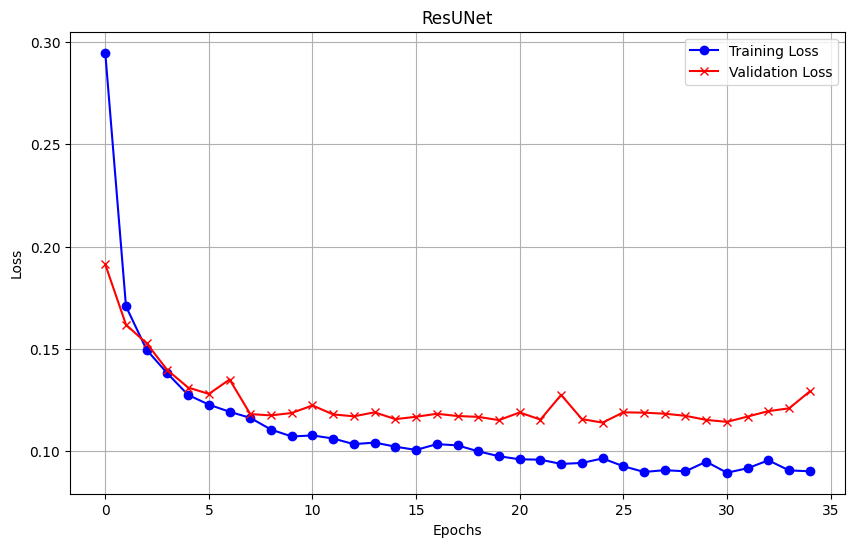

In [ ]:
plot_losses(train_loss, val_loss, title='ResUNet')

cuda


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 163MB/s]


Average Dice Coefficient: 0.7437
Average IoU: 0.5949
Average Accuracy: 0.9511


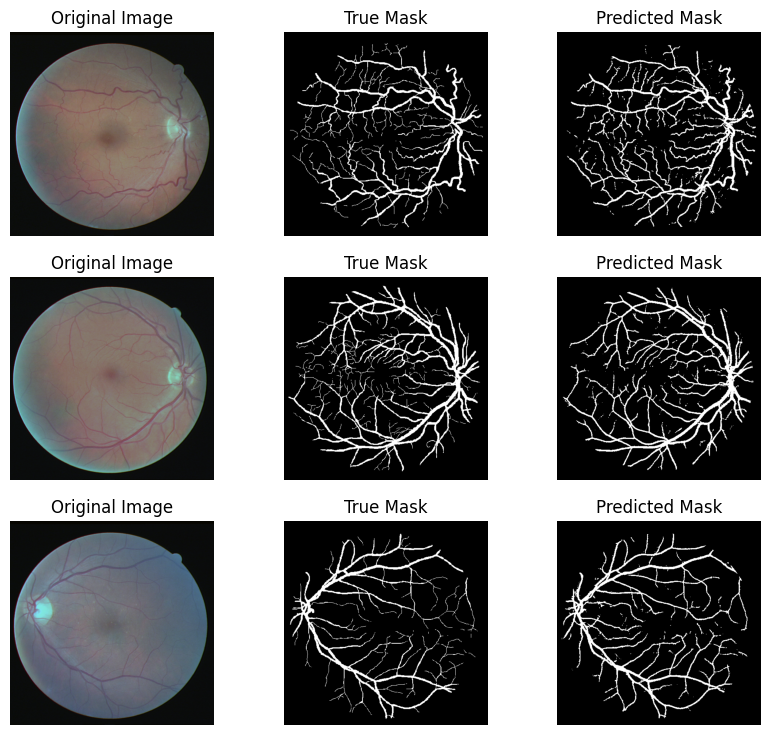

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)
model = ResNetUNet(n_class=1).to(device)
model_path = os.path.join(dir_save, f'ResUNet_baseline.pth')
model.load_state_dict(torch.load(model_path))
evaluate_model(model, test_loader, device)
evaluate_and_plot(model, test_loader, device, num_images_to_plot=3)

Average Dice Coefficient: 0.7063
Average IoU: 0.5493
Average Accuracy: 0.9391


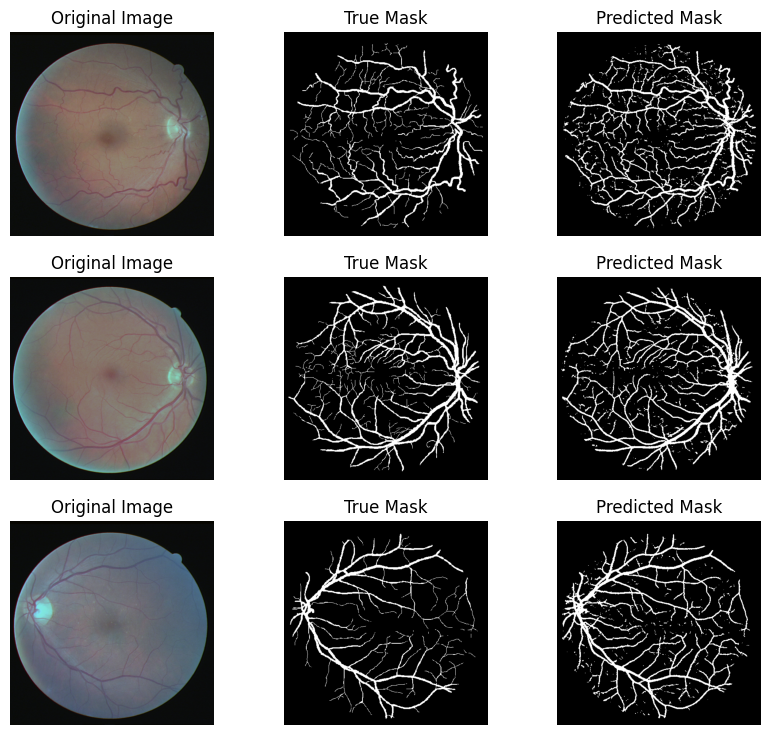

In [ ]:
model_path = os.path.join(dir_save, f'best_model_{batch_size}.pth')
model.load_state_dict(torch.load(model_path))
evaluate_model(model, test_loader, device)
evaluate_and_plot(model, test_loader, device, num_images_to_plot=3)

### FCN

In [ ]:

model = fcn
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = model.to(device)

criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)
num_epochs = 25

batch_size = 1
train_loader = DataLoader(train_dataset, batch_size, shuffle=True)
model_save_path = os.path.join(dir_save, 'fcn.pth')

train_loss, val_loss = train_unet(model, train_loader, val_loader, criterion, optimizer, num_epochs, device, model_save_path)
plot_losses(train_loss, val_loss, title='FCN')


Average Dice Coefficient: 0.6132
Average IoU: 0.4434
Average Accuracy: 0.9025


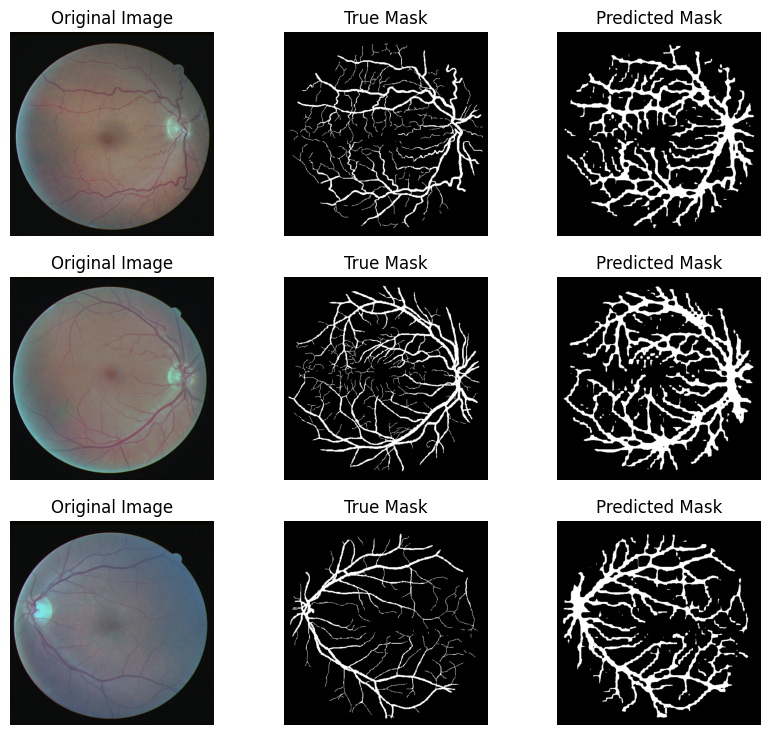

In [ ]:
model = fcn
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = model.to(device)
model_path = os.path.join(dir_save, f'fcn.pth')
model.load_state_dict(torch.load(model_path))
evaluate_model(model, test_loader, device)
evaluate_and_plot(model, test_loader, device, num_images_to_plot=3)

### Deeplabv3

Epoch 1/25 Training: 100%|██████████| 18/18 [00:10<00:00,  1.74it/s, loss=0.16]


Epoch 1/25, Training Loss: 0.2401
Epoch 1/25, Validation Loss: 0.4547
Best model saved at epoch 1 with validation loss: 0.4547


Epoch 2/25 Training: 100%|██████████| 18/18 [00:10<00:00,  1.66it/s, loss=0.141]


Epoch 2/25, Training Loss: 0.2010
Epoch 2/25, Validation Loss: 0.2166
Best model saved at epoch 2 with validation loss: 0.2166


Epoch 3/25 Training: 100%|██████████| 18/18 [00:10<00:00,  1.66it/s, loss=0.13]


Epoch 3/25, Training Loss: 0.1865
Epoch 3/25, Validation Loss: 0.1751
Best model saved at epoch 3 with validation loss: 0.1751


Epoch 4/25 Training: 100%|██████████| 18/18 [00:10<00:00,  1.74it/s, loss=0.123]


Epoch 4/25, Training Loss: 0.1781
Epoch 4/25, Validation Loss: 0.1705
Best model saved at epoch 4 with validation loss: 0.1705


Epoch 5/25 Training: 100%|██████████| 18/18 [00:10<00:00,  1.74it/s, loss=0.121]


Epoch 5/25, Training Loss: 0.1744
Epoch 5/25, Validation Loss: 0.1656
Best model saved at epoch 5 with validation loss: 0.1656


Epoch 6/25 Training: 100%|██████████| 18/18 [00:10<00:00,  1.66it/s, loss=0.117]


Epoch 6/25, Training Loss: 0.1714
Epoch 6/25, Validation Loss: 0.1618
Best model saved at epoch 6 with validation loss: 0.1618


Epoch 7/25 Training: 100%|██████████| 18/18 [00:10<00:00,  1.74it/s, loss=0.114]


Epoch 7/25, Training Loss: 0.1679
Epoch 7/25, Validation Loss: 0.1604
Best model saved at epoch 7 with validation loss: 0.1604


Epoch 8/25 Training: 100%|██████████| 18/18 [00:10<00:00,  1.73it/s, loss=0.112]


Epoch 8/25, Training Loss: 0.1656
Epoch 8/25, Validation Loss: 0.1597
Best model saved at epoch 8 with validation loss: 0.1597


Epoch 9/25 Training: 100%|██████████| 18/18 [00:10<00:00,  1.68it/s, loss=0.111]


Epoch 9/25, Training Loss: 0.1644
Epoch 9/25, Validation Loss: 0.1596
Best model saved at epoch 9 with validation loss: 0.1596


Epoch 10/25 Training: 100%|██████████| 18/18 [00:10<00:00,  1.69it/s, loss=0.11]


Epoch 10/25, Training Loss: 0.1634
Epoch 10/25, Validation Loss: 0.1613


Epoch 11/25 Training: 100%|██████████| 18/18 [00:10<00:00,  1.73it/s, loss=0.107]


Epoch 11/25, Training Loss: 0.1616
Epoch 11/25, Validation Loss: 0.1616


Epoch 12/25 Training: 100%|██████████| 18/18 [00:10<00:00,  1.74it/s, loss=0.107]


Epoch 12/25, Training Loss: 0.1604
Epoch 12/25, Validation Loss: 0.1587
Best model saved at epoch 12 with validation loss: 0.1587


Epoch 13/25 Training: 100%|██████████| 18/18 [00:10<00:00,  1.72it/s, loss=0.105]


Epoch 13/25, Training Loss: 0.1594
Epoch 13/25, Validation Loss: 0.1625


Epoch 14/25 Training: 100%|██████████| 18/18 [00:10<00:00,  1.73it/s, loss=0.105]


Epoch 14/25, Training Loss: 0.1593
Epoch 14/25, Validation Loss: 0.1645


Epoch 15/25 Training: 100%|██████████| 18/18 [00:10<00:00,  1.75it/s, loss=0.105]


Epoch 15/25, Training Loss: 0.1595
Epoch 15/25, Validation Loss: 0.1614


Epoch 16/25 Training: 100%|██████████| 18/18 [00:10<00:00,  1.75it/s, loss=0.104]


Epoch 16/25, Training Loss: 0.1589
Epoch 16/25, Validation Loss: 0.1615


Epoch 17/25 Training: 100%|██████████| 18/18 [00:10<00:00,  1.74it/s, loss=0.103]


Epoch 17/25, Training Loss: 0.1585
Epoch 17/25, Validation Loss: 0.1658


Epoch 18/25 Training: 100%|██████████| 18/18 [00:10<00:00,  1.74it/s, loss=0.102]


Epoch 18/25, Training Loss: 0.1573
Epoch 18/25, Validation Loss: 0.1669


Epoch 19/25 Training: 100%|██████████| 18/18 [00:10<00:00,  1.74it/s, loss=0.101]


Epoch 19/25, Training Loss: 0.1587
Epoch 19/25, Validation Loss: 0.1669


Epoch 20/25 Training: 100%|██████████| 18/18 [00:10<00:00,  1.74it/s, loss=0.101]


Epoch 20/25, Training Loss: 0.1579
Epoch 20/25, Validation Loss: 0.1642


Epoch 21/25 Training: 100%|██████████| 18/18 [00:10<00:00,  1.75it/s, loss=0.0994]


Epoch 21/25, Training Loss: 0.1540
Epoch 21/25, Validation Loss: 0.1654


Epoch 22/25 Training: 100%|██████████| 18/18 [00:10<00:00,  1.75it/s, loss=0.0977]


Epoch 22/25, Training Loss: 0.1523
Epoch 22/25, Validation Loss: 0.1676
Early stopping triggered after 10 epochs without improvement.
Training completed. Best model was saved at epoch 12 with a validation loss of 0.1587


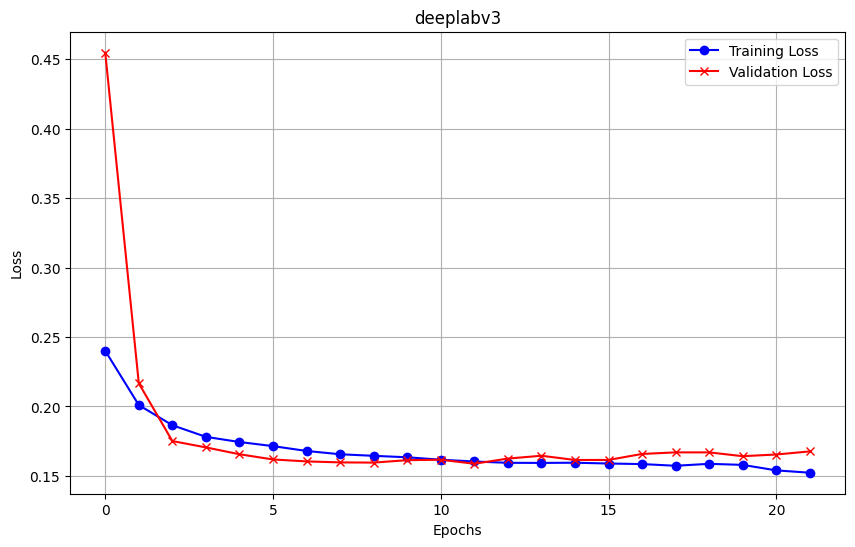

Average Dice Coefficient: 0.4424
Average IoU: 0.2854
Average Accuracy: 0.7848


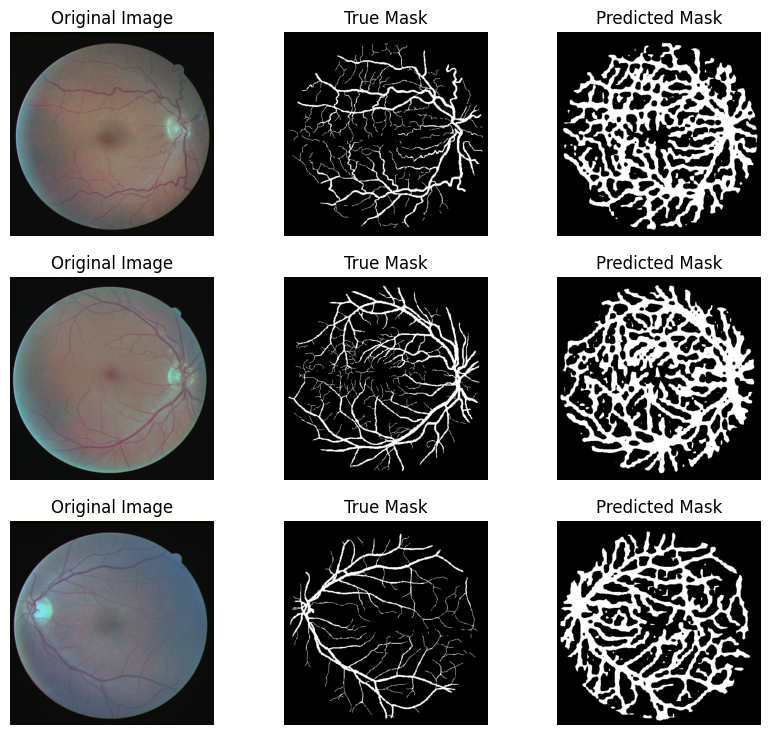

In [ ]:
model = deeplabv3
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = model.to(device)
criterion = torch.nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)
num_epochs = 25


model_save_path = os.path.join(dir_save, 'deeplabv3_custom.pth')

train_loss, val_loss = train_unet(model, train_loader, val_loader, criterion, optimizer, num_epochs, device, model_save_path)
plot_losses(train_loss, val_loss, title='deeplabv3')
model_path = os.path.join(dir_save, f'deeplabv3_custom.pth')
model.load_state_dict(torch.load(model_path))
evaluate_model(model, test_loader, device)
evaluate_and_plot(model, test_loader, device, num_images_to_plot=3)

### Attention UNet

In [ ]:
# init Attention UNet model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = AttentionUNet(in_channels=3, out_channels=1).to(device)

# define loss function and optimizer
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.AdamW(model.parameters(), lr=0.001, weight_decay=0.01)
num_epochs = 100
batch_size=1

model_save_path = os.path.join(dir_save, f'attention_unet.pth')
train_loader = DataLoader(train_dataset, batch_size, shuffle=True)

train_loss, val_loss = train_unet(model, train_loader, val_loader, criterion, optimizer, num_epochs, device, model_save_path)

Epoch 1/100 Training: 100%|██████████| 70/70 [00:09<00:00,  7.56it/s, loss=0.147]


Epoch 1/100, Training Loss: 0.2709
Epoch 1/100, Validation Loss: 0.1881
Best model saved at epoch 1 with validation loss: 0.1881


Epoch 2/100 Training: 100%|██████████| 70/70 [00:09<00:00,  7.59it/s, loss=0.167]


Epoch 2/100, Training Loss: 0.1628
Epoch 2/100, Validation Loss: 0.1681
Best model saved at epoch 2 with validation loss: 0.1681


Epoch 3/100 Training: 100%|██████████| 70/70 [00:09<00:00,  7.39it/s, loss=0.126]


Epoch 3/100, Training Loss: 0.1525
Epoch 3/100, Validation Loss: 0.1496
Best model saved at epoch 3 with validation loss: 0.1496


Epoch 4/100 Training: 100%|██████████| 70/70 [00:09<00:00,  7.32it/s, loss=0.137]


Epoch 4/100, Training Loss: 0.1431
Epoch 4/100, Validation Loss: 0.1476
Best model saved at epoch 4 with validation loss: 0.1476


Epoch 5/100 Training: 100%|██████████| 70/70 [00:09<00:00,  7.43it/s, loss=0.103]


Epoch 5/100, Training Loss: 0.1355
Epoch 5/100, Validation Loss: 0.1460
Best model saved at epoch 5 with validation loss: 0.1460


Epoch 6/100 Training: 100%|██████████| 70/70 [00:09<00:00,  7.45it/s, loss=0.101]


Epoch 6/100, Training Loss: 0.1296
Epoch 6/100, Validation Loss: 0.1417
Best model saved at epoch 6 with validation loss: 0.1417


Epoch 7/100 Training: 100%|██████████| 70/70 [00:09<00:00,  7.41it/s, loss=0.22]


Epoch 7/100, Training Loss: 0.1169
Epoch 7/100, Validation Loss: 0.1466


Epoch 8/100 Training: 100%|██████████| 70/70 [00:09<00:00,  7.52it/s, loss=0.0816]


Epoch 8/100, Training Loss: 0.1128
Epoch 8/100, Validation Loss: 0.1473


Epoch 9/100 Training: 100%|██████████| 70/70 [00:09<00:00,  7.65it/s, loss=0.106]


Epoch 9/100, Training Loss: 0.1086
Epoch 9/100, Validation Loss: 0.1363
Best model saved at epoch 9 with validation loss: 0.1363


Epoch 10/100 Training: 100%|██████████| 70/70 [00:09<00:00,  7.46it/s, loss=0.0876]


Epoch 10/100, Training Loss: 0.1072
Epoch 10/100, Validation Loss: 0.1290
Best model saved at epoch 10 with validation loss: 0.1290


Epoch 11/100 Training: 100%|██████████| 70/70 [00:09<00:00,  7.43it/s, loss=0.103]


Epoch 11/100, Training Loss: 0.1050
Epoch 11/100, Validation Loss: 0.1191
Best model saved at epoch 11 with validation loss: 0.1191


Epoch 12/100 Training: 100%|██████████| 70/70 [00:09<00:00,  7.50it/s, loss=0.107]


Epoch 12/100, Training Loss: 0.1013
Epoch 12/100, Validation Loss: 0.1245


Epoch 13/100 Training: 100%|██████████| 70/70 [00:09<00:00,  7.60it/s, loss=0.131]


Epoch 13/100, Training Loss: 0.0993
Epoch 13/100, Validation Loss: 0.1223


Epoch 14/100 Training: 100%|██████████| 70/70 [00:09<00:00,  7.61it/s, loss=0.0819]


Epoch 14/100, Training Loss: 0.1004
Epoch 14/100, Validation Loss: 0.1165
Best model saved at epoch 14 with validation loss: 0.1165


Epoch 15/100 Training: 100%|██████████| 70/70 [00:09<00:00,  7.44it/s, loss=0.112]


Epoch 15/100, Training Loss: 0.0974
Epoch 15/100, Validation Loss: 0.1286


Epoch 16/100 Training: 100%|██████████| 70/70 [00:09<00:00,  7.60it/s, loss=0.0763]


Epoch 16/100, Training Loss: 0.0946
Epoch 16/100, Validation Loss: 0.1152
Best model saved at epoch 16 with validation loss: 0.1152


Epoch 17/100 Training: 100%|██████████| 70/70 [00:09<00:00,  7.40it/s, loss=0.0778]


Epoch 17/100, Training Loss: 0.0957
Epoch 17/100, Validation Loss: 0.1233


Epoch 18/100 Training: 100%|██████████| 70/70 [00:09<00:00,  7.62it/s, loss=0.118]


Epoch 18/100, Training Loss: 0.0944
Epoch 18/100, Validation Loss: 0.1160


Epoch 19/100 Training: 100%|██████████| 70/70 [00:09<00:00,  7.61it/s, loss=0.0704]


Epoch 19/100, Training Loss: 0.0919
Epoch 19/100, Validation Loss: 0.1183


Epoch 20/100 Training: 100%|██████████| 70/70 [00:09<00:00,  7.61it/s, loss=0.0607]


Epoch 20/100, Training Loss: 0.0926
Epoch 20/100, Validation Loss: 0.1173


Epoch 21/100 Training: 100%|██████████| 70/70 [00:09<00:00,  7.58it/s, loss=0.117]


Epoch 21/100, Training Loss: 0.0921
Epoch 21/100, Validation Loss: 0.1214


Epoch 22/100 Training: 100%|██████████| 70/70 [00:09<00:00,  7.56it/s, loss=0.0824]


Epoch 22/100, Training Loss: 0.0911
Epoch 22/100, Validation Loss: 0.1096
Best model saved at epoch 22 with validation loss: 0.1096


Epoch 23/100 Training: 100%|██████████| 70/70 [00:09<00:00,  7.42it/s, loss=0.0631]


Epoch 23/100, Training Loss: 0.0904
Epoch 23/100, Validation Loss: 0.1113


Epoch 24/100 Training: 100%|██████████| 70/70 [00:09<00:00,  7.59it/s, loss=0.0659]


Epoch 24/100, Training Loss: 0.0904
Epoch 24/100, Validation Loss: 0.1131


Epoch 25/100 Training: 100%|██████████| 70/70 [00:09<00:00,  7.61it/s, loss=0.0672]


Epoch 25/100, Training Loss: 0.0877
Epoch 25/100, Validation Loss: 0.1115


Epoch 26/100 Training: 100%|██████████| 70/70 [00:09<00:00,  7.59it/s, loss=0.0842]


Epoch 26/100, Training Loss: 0.0871
Epoch 26/100, Validation Loss: 0.1154


Epoch 27/100 Training: 100%|██████████| 70/70 [00:09<00:00,  7.66it/s, loss=0.113]


Epoch 27/100, Training Loss: 0.0859
Epoch 27/100, Validation Loss: 0.1138


Epoch 28/100 Training: 100%|██████████| 70/70 [00:09<00:00,  7.61it/s, loss=0.0678]


Epoch 28/100, Training Loss: 0.0888
Epoch 28/100, Validation Loss: 0.1195


Epoch 29/100 Training: 100%|██████████| 70/70 [00:09<00:00,  7.59it/s, loss=0.0813]


Epoch 29/100, Training Loss: 0.0885
Epoch 29/100, Validation Loss: 0.1105


Epoch 30/100 Training: 100%|██████████| 70/70 [00:09<00:00,  7.62it/s, loss=0.0879]


Epoch 30/100, Training Loss: 0.0857
Epoch 30/100, Validation Loss: 0.1112


Epoch 31/100 Training: 100%|██████████| 70/70 [00:09<00:00,  7.60it/s, loss=0.0632]


Epoch 31/100, Training Loss: 0.0846
Epoch 31/100, Validation Loss: 0.1154


Epoch 32/100 Training: 100%|██████████| 70/70 [00:09<00:00,  7.57it/s, loss=0.116]


Epoch 32/100, Training Loss: 0.0842
Epoch 32/100, Validation Loss: 0.1105
Early stopping triggered after 10 epochs without improvement.
Training completed. Best model was saved at epoch 22 with a validation loss of 0.1096


Average Dice Coefficient: 0.7543
Average IoU: 0.6081
Average Accuracy: 0.9539


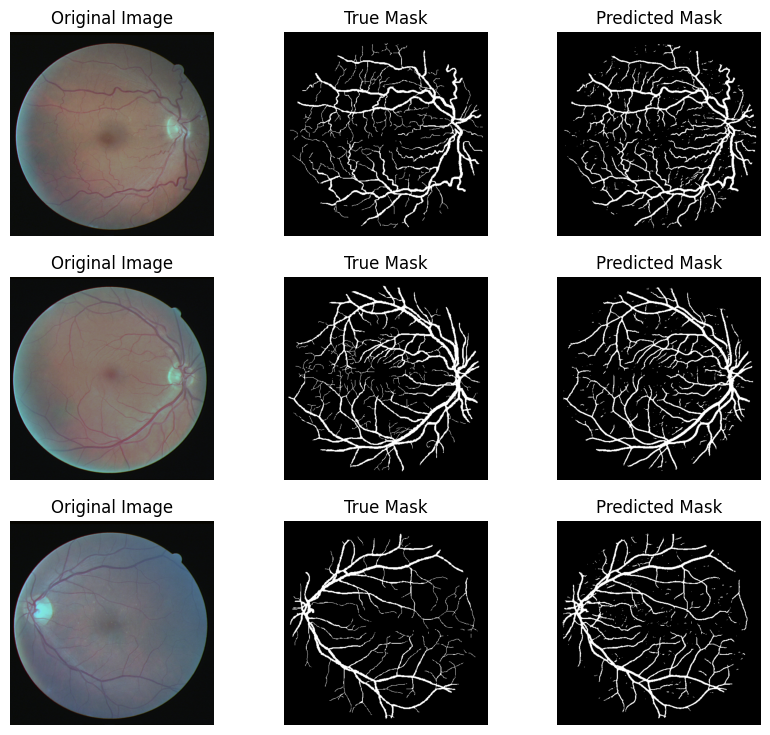

In [ ]:

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = AttentionUNet(in_channels=3, out_channels=1).to(device)

model_path = os.path.join(dir_save, f'attention_unet.pth')
model.load_state_dict(torch.load(model_path))
evaluate_model(model, test_loader, device)
evaluate_and_plot(model, test_loader, device, num_images_to_plot=3)

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)
# init UNet++ model
model = NestedUNet(in_ch=3, out_ch=1).to(device)

criterion = nn.BCEWithLogitsLoss()
optimizer = optim.AdamW(model.parameters(), lr=0.001, weight_decay=0.01)
num_epochs = 100
batch_size = 1
model_save_path = os.path.join(dir_save, f'best_nested_unet.pth')
train_loader = DataLoader(train_dataset, batch_size, shuffle=True)

train_loss, val_loss = train_unet(model, train_loader, val_loader, criterion, optimizer, num_epochs, device, model_save_path)

cuda


Epoch 1/100 Training: 100%|██████████| 70/70 [00:28<00:00,  2.47it/s, loss=0.188]


Epoch 1/100, Training Loss: 0.3020
Epoch 1/100, Validation Loss: 0.2368
Best model saved at epoch 1 with validation loss: 0.2368


Epoch 2/100 Training: 100%|██████████| 70/70 [00:28<00:00,  2.46it/s, loss=0.136]


Epoch 2/100, Training Loss: 0.1687
Epoch 2/100, Validation Loss: 0.1662
Best model saved at epoch 2 with validation loss: 0.1662


Epoch 3/100 Training: 100%|██████████| 70/70 [00:28<00:00,  2.48it/s, loss=0.138]


Epoch 3/100, Training Loss: 0.1408
Epoch 3/100, Validation Loss: 0.1733


Epoch 4/100 Training: 100%|██████████| 70/70 [00:28<00:00,  2.49it/s, loss=0.105]


Epoch 4/100, Training Loss: 0.1277
Epoch 4/100, Validation Loss: 0.1367
Best model saved at epoch 4 with validation loss: 0.1367


Epoch 5/100 Training: 100%|██████████| 70/70 [00:28<00:00,  2.48it/s, loss=0.187]


Epoch 5/100, Training Loss: 0.1228
Epoch 5/100, Validation Loss: 0.1441


Epoch 6/100 Training: 100%|██████████| 70/70 [00:28<00:00,  2.49it/s, loss=0.142]


Epoch 6/100, Training Loss: 0.1168
Epoch 6/100, Validation Loss: 0.1290
Best model saved at epoch 6 with validation loss: 0.1290


Epoch 7/100 Training: 100%|██████████| 70/70 [00:28<00:00,  2.48it/s, loss=0.11]


Epoch 7/100, Training Loss: 0.1112
Epoch 7/100, Validation Loss: 0.1342


Epoch 8/100 Training: 100%|██████████| 70/70 [00:28<00:00,  2.49it/s, loss=0.081]


Epoch 8/100, Training Loss: 0.1124
Epoch 8/100, Validation Loss: 0.1203
Best model saved at epoch 8 with validation loss: 0.1203


Epoch 9/100 Training: 100%|██████████| 70/70 [00:28<00:00,  2.48it/s, loss=0.0888]


Epoch 9/100, Training Loss: 0.1077
Epoch 9/100, Validation Loss: 0.1337


Epoch 10/100 Training: 100%|██████████| 70/70 [00:28<00:00,  2.48it/s, loss=0.127]


Epoch 10/100, Training Loss: 0.1056
Epoch 10/100, Validation Loss: 0.1282


Epoch 11/100 Training: 100%|██████████| 70/70 [00:28<00:00,  2.48it/s, loss=0.1]


Epoch 11/100, Training Loss: 0.1096
Epoch 11/100, Validation Loss: 0.1272


Epoch 12/100 Training: 100%|██████████| 70/70 [00:28<00:00,  2.49it/s, loss=0.0833]


Epoch 12/100, Training Loss: 0.1035
Epoch 12/100, Validation Loss: 0.1193
Best model saved at epoch 12 with validation loss: 0.1193


Epoch 13/100 Training: 100%|██████████| 70/70 [00:28<00:00,  2.48it/s, loss=0.0945]


Epoch 13/100, Training Loss: 0.0980
Epoch 13/100, Validation Loss: 0.1240


Epoch 14/100 Training: 100%|██████████| 70/70 [00:28<00:00,  2.49it/s, loss=0.138]


Epoch 14/100, Training Loss: 0.0984
Epoch 14/100, Validation Loss: 0.1151
Best model saved at epoch 14 with validation loss: 0.1151


Epoch 15/100 Training: 100%|██████████| 70/70 [00:28<00:00,  2.48it/s, loss=0.0912]


Epoch 15/100, Training Loss: 0.0972
Epoch 15/100, Validation Loss: 0.1174


Epoch 16/100 Training: 100%|██████████| 70/70 [00:28<00:00,  2.48it/s, loss=0.0873]


Epoch 16/100, Training Loss: 0.0941
Epoch 16/100, Validation Loss: 0.1231


Epoch 17/100 Training: 100%|██████████| 70/70 [00:28<00:00,  2.48it/s, loss=0.0956]


Epoch 17/100, Training Loss: 0.0941
Epoch 17/100, Validation Loss: 0.1176


Epoch 18/100 Training: 100%|██████████| 70/70 [00:28<00:00,  2.49it/s, loss=0.129]


Epoch 18/100, Training Loss: 0.0925
Epoch 18/100, Validation Loss: 0.1153


Epoch 19/100 Training: 100%|██████████| 70/70 [00:28<00:00,  2.48it/s, loss=0.16]


Epoch 19/100, Training Loss: 0.0912
Epoch 19/100, Validation Loss: 0.1100
Best model saved at epoch 19 with validation loss: 0.1100


Epoch 20/100 Training: 100%|██████████| 70/70 [00:28<00:00,  2.48it/s, loss=0.0741]


Epoch 20/100, Training Loss: 0.0917
Epoch 20/100, Validation Loss: 0.1158


Epoch 21/100 Training: 100%|██████████| 70/70 [00:28<00:00,  2.48it/s, loss=0.0684]


Epoch 21/100, Training Loss: 0.0927
Epoch 21/100, Validation Loss: 0.1112


Epoch 22/100 Training: 100%|██████████| 70/70 [00:28<00:00,  2.49it/s, loss=0.189]


Epoch 22/100, Training Loss: 0.0908
Epoch 22/100, Validation Loss: 0.1072
Best model saved at epoch 22 with validation loss: 0.1072


Epoch 23/100 Training: 100%|██████████| 70/70 [00:28<00:00,  2.48it/s, loss=0.114]


Epoch 23/100, Training Loss: 0.0886
Epoch 23/100, Validation Loss: 0.1101


Epoch 24/100 Training: 100%|██████████| 70/70 [00:28<00:00,  2.48it/s, loss=0.0826]


Epoch 24/100, Training Loss: 0.0878
Epoch 24/100, Validation Loss: 0.1106


Epoch 25/100 Training: 100%|██████████| 70/70 [00:28<00:00,  2.49it/s, loss=0.0884]


Epoch 25/100, Training Loss: 0.0884
Epoch 25/100, Validation Loss: 0.1045
Best model saved at epoch 25 with validation loss: 0.1045


Epoch 26/100 Training: 100%|██████████| 70/70 [00:28<00:00,  2.48it/s, loss=0.081]


Epoch 26/100, Training Loss: 0.0864
Epoch 26/100, Validation Loss: 0.1033
Best model saved at epoch 26 with validation loss: 0.1033


Epoch 27/100 Training: 100%|██████████| 70/70 [00:28<00:00,  2.45it/s, loss=0.0691]


Epoch 27/100, Training Loss: 0.0848
Epoch 27/100, Validation Loss: 0.1120


Epoch 28/100 Training: 100%|██████████| 70/70 [00:28<00:00,  2.49it/s, loss=0.0674]


Epoch 28/100, Training Loss: 0.0875
Epoch 28/100, Validation Loss: 0.1208


Epoch 29/100 Training: 100%|██████████| 70/70 [00:28<00:00,  2.48it/s, loss=0.0781]


Epoch 29/100, Training Loss: 0.0844
Epoch 29/100, Validation Loss: 0.1054


Epoch 30/100 Training: 100%|██████████| 70/70 [00:28<00:00,  2.48it/s, loss=0.127]


Epoch 30/100, Training Loss: 0.0839
Epoch 30/100, Validation Loss: 0.1081


Epoch 31/100 Training: 100%|██████████| 70/70 [00:28<00:00,  2.49it/s, loss=0.102]


Epoch 31/100, Training Loss: 0.0862
Epoch 31/100, Validation Loss: 0.1069


Epoch 32/100 Training: 100%|██████████| 70/70 [00:28<00:00,  2.48it/s, loss=0.106]


Epoch 32/100, Training Loss: 0.0852
Epoch 32/100, Validation Loss: 0.1047


Epoch 33/100 Training: 100%|██████████| 70/70 [00:28<00:00,  2.48it/s, loss=0.0754]


Epoch 33/100, Training Loss: 0.0832
Epoch 33/100, Validation Loss: 0.1032
Best model saved at epoch 33 with validation loss: 0.1032


Epoch 34/100 Training: 100%|██████████| 70/70 [00:28<00:00,  2.48it/s, loss=0.104]


Epoch 34/100, Training Loss: 0.0836
Epoch 34/100, Validation Loss: 0.1041


Epoch 35/100 Training: 100%|██████████| 70/70 [00:28<00:00,  2.48it/s, loss=0.0747]


Epoch 35/100, Training Loss: 0.0825
Epoch 35/100, Validation Loss: 0.1073


Epoch 36/100 Training: 100%|██████████| 70/70 [00:28<00:00,  2.48it/s, loss=0.0631]


Epoch 36/100, Training Loss: 0.0819
Epoch 36/100, Validation Loss: 0.1072


Epoch 37/100 Training: 100%|██████████| 70/70 [00:28<00:00,  2.48it/s, loss=0.0759]


Epoch 37/100, Training Loss: 0.0825
Epoch 37/100, Validation Loss: 0.1093


Epoch 38/100 Training: 100%|██████████| 70/70 [00:28<00:00,  2.48it/s, loss=0.0714]


Epoch 38/100, Training Loss: 0.0831
Epoch 38/100, Validation Loss: 0.1092


Epoch 39/100 Training: 100%|██████████| 70/70 [00:28<00:00,  2.48it/s, loss=0.121]


Epoch 39/100, Training Loss: 0.0832
Epoch 39/100, Validation Loss: 0.1070


Epoch 40/100 Training: 100%|██████████| 70/70 [00:28<00:00,  2.48it/s, loss=0.0908]


Epoch 40/100, Training Loss: 0.0807
Epoch 40/100, Validation Loss: 0.1085


Epoch 41/100 Training: 100%|██████████| 70/70 [00:28<00:00,  2.48it/s, loss=0.0859]


Epoch 41/100, Training Loss: 0.0807
Epoch 41/100, Validation Loss: 0.1098


Epoch 42/100 Training: 100%|██████████| 70/70 [00:28<00:00,  2.49it/s, loss=0.0747]


Epoch 42/100, Training Loss: 0.0803
Epoch 42/100, Validation Loss: 0.1068


Epoch 43/100 Training: 100%|██████████| 70/70 [00:28<00:00,  2.49it/s, loss=0.0817]


Epoch 43/100, Training Loss: 0.0790
Epoch 43/100, Validation Loss: 0.1058
Early stopping triggered after 10 epochs without improvement.
Training completed. Best model was saved at epoch 33 with a validation loss of 0.1032


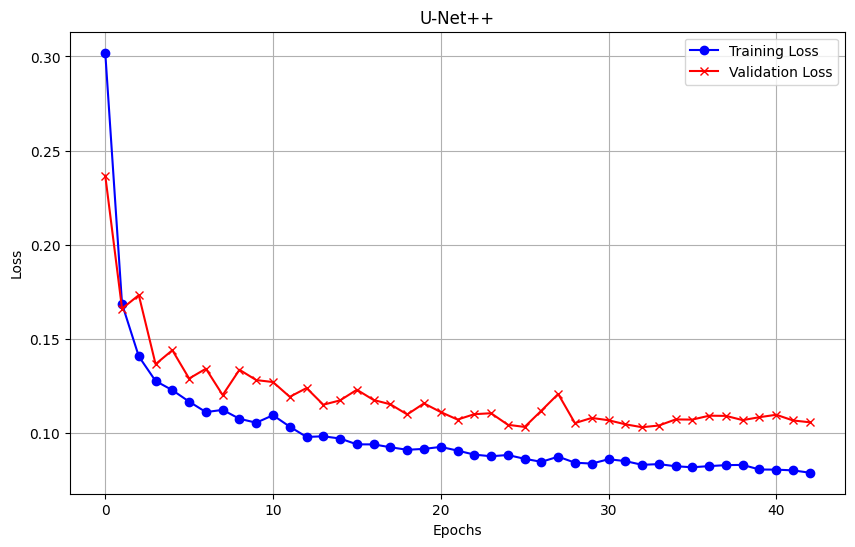

Average Dice Coefficient: 0.7767
Average IoU: 0.6363
Average Accuracy: 0.9606


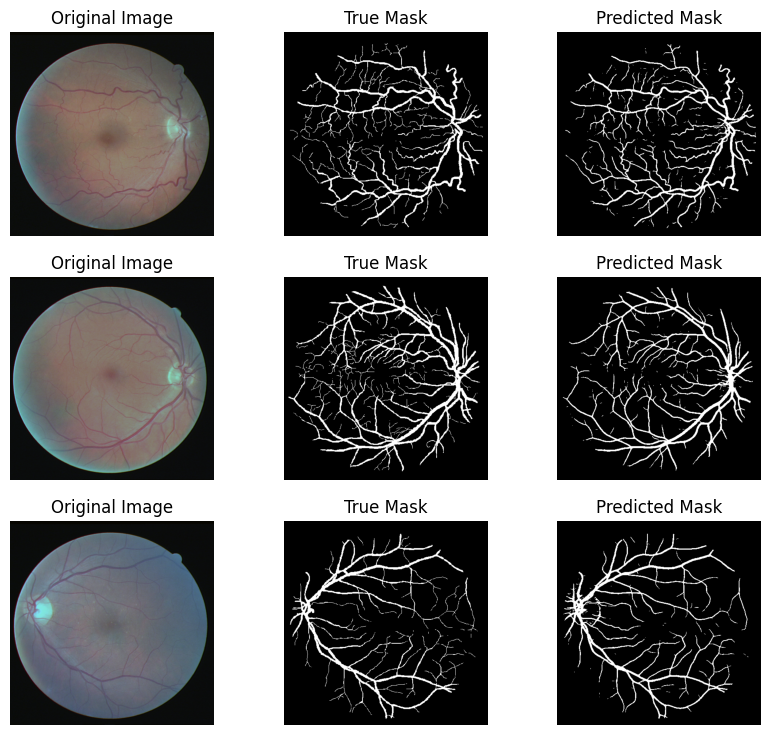

In [ ]:
plot_losses(train_loss, val_loss, title='U-Net++')
model_path = os.path.join(dir_save, f'best_nested_unet.pth')
model.load_state_dict(torch.load(model_path))
evaluate_model(model, test_loader, device)
evaluate_and_plot(model, test_loader, device, num_images_to_plot=3)

## Data Augmentation Expiremnets
For our experiments, we applied three data augmentation techniques to enhance our training dataset for a ResUNet model:

- Random Rotation
- Noise Addition
- Gaussian Blur


In [ ]:
def random_rotate(image, mask):
    angle = random.uniform(0, 360)
    image = image.rotate(angle)
    mask = mask.rotate(angle)
    return image, mask


def add_noise(image, mask):
    image = np.array(image)
    noise = np.random.normal(loc=0, scale=25, size=image.shape)
    image = image + noise
    image = np.clip(image, 0, 255).astype(np.uint8)
    image = Image.fromarray(image)
    return image, mask

def blur(image, mask):
    transform = transforms.GaussianBlur(kernel_size=(5, 9), sigma=(0.1, 5))
    image = transform(image)
    return image, mask

### Implement the DA comparsion pipeline
- load the original dataset
- apply DA method
- combine the datasets for trainnig
- comparsion the models performance with different DA method

In [ ]:
from torch.utils.data import ConcatDataset, DataLoader


def create_augmented_dataset(image_paths, mask_paths, augmentations, augment_multiplier=1, debug=False):
    # original dataset
    original_dataset = RetinalDataset(image_paths, mask_paths, augmentations=None)
    datasets = [original_dataset]
    if debug:
        train_loader = DataLoader(original_dataset, batch_size=1, shuffle=False)
        print(f"Original dataset: {len(original_dataset)}")
        show_dataloader(train_loader, num_batches=1)

    # Data augmentation apply i iter
    for i in range(augment_multiplier):
        augmented_dataset = RetinalDataset(image_paths, mask_paths, augmentations=augmentations)
        datasets.append(augmented_dataset)
        if debug:
            print(f"Augmentation {i+1} with methods: {augmentations}, dataset length: {len(augmented_dataset)}")
            aug_train_loader = DataLoader(augmented_dataset, batch_size=1, shuffle=False)
            show_dataloader(aug_train_loader, num_batches=1)

    # combine the datasets after DA
    combined_dataset = ConcatDataset(datasets)
    print(f"Combined dataset length: {len(combined_dataset)}")

    return combined_dataset

### Display of creating an augmentation dataset after random rotate

Original dataset: 70


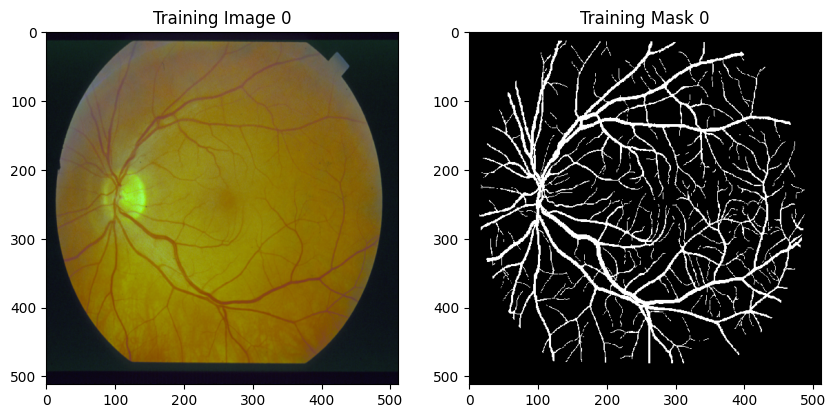

Augmentation 1 with methods: rotate, dataset length: 70


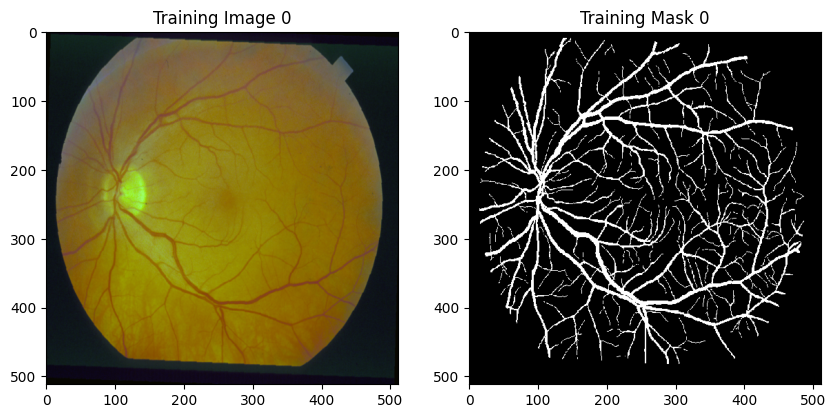

Combined dataset length: 140


In [ ]:
aug_dataset = create_augmented_dataset(train_image_paths, train_mask_paths, "rotate", augment_multiplier=1, debug=True)

### Training models with different DA method

Combined dataset length: 140
Augmented Dataset: rotate, len: 140


Epoch 1/100 Training: 100%|██████████| 140/140 [00:24<00:00,  5.79it/s, loss=0.17]


Epoch 1/100, Training Loss: 0.2297
Epoch 1/100, Validation Loss: 0.1716
Best model saved at epoch 1 with validation loss: 0.1716


Epoch 2/100 Training: 100%|██████████| 140/140 [00:24<00:00,  5.75it/s, loss=0.165]


Epoch 2/100, Training Loss: 0.1478
Epoch 2/100, Validation Loss: 0.1645
Best model saved at epoch 2 with validation loss: 0.1645


Epoch 3/100 Training: 100%|██████████| 140/140 [00:24<00:00,  5.70it/s, loss=0.0922]


Epoch 3/100, Training Loss: 0.1297
Epoch 3/100, Validation Loss: 0.1438
Best model saved at epoch 3 with validation loss: 0.1438


Epoch 4/100 Training: 100%|██████████| 140/140 [00:24<00:00,  5.73it/s, loss=0.143]


Epoch 4/100, Training Loss: 0.1188
Epoch 4/100, Validation Loss: 0.1222
Best model saved at epoch 4 with validation loss: 0.1222


Epoch 5/100 Training: 100%|██████████| 140/140 [00:24<00:00,  5.72it/s, loss=0.199]


Epoch 5/100, Training Loss: 0.1171
Epoch 5/100, Validation Loss: 0.1207
Best model saved at epoch 5 with validation loss: 0.1207


Epoch 6/100 Training: 100%|██████████| 140/140 [00:24<00:00,  5.73it/s, loss=0.105]


Epoch 6/100, Training Loss: 0.1126
Epoch 6/100, Validation Loss: 0.1181
Best model saved at epoch 6 with validation loss: 0.1181


Epoch 7/100 Training: 100%|██████████| 140/140 [00:24<00:00,  5.75it/s, loss=0.168]


Epoch 7/100, Training Loss: 0.1064
Epoch 7/100, Validation Loss: 0.1335


Epoch 8/100 Training: 100%|██████████| 140/140 [00:24<00:00,  5.82it/s, loss=0.136]


Epoch 8/100, Training Loss: 0.1062
Epoch 8/100, Validation Loss: 0.1158
Best model saved at epoch 8 with validation loss: 0.1158


Epoch 9/100 Training: 100%|██████████| 140/140 [00:24<00:00,  5.76it/s, loss=0.119]


Epoch 9/100, Training Loss: 0.1065
Epoch 9/100, Validation Loss: 0.1123
Best model saved at epoch 9 with validation loss: 0.1123


Epoch 10/100 Training: 100%|██████████| 140/140 [00:24<00:00,  5.77it/s, loss=0.0906]


Epoch 10/100, Training Loss: 0.1033
Epoch 10/100, Validation Loss: 0.1166


Epoch 11/100 Training: 100%|██████████| 140/140 [00:24<00:00,  5.81it/s, loss=0.104]


Epoch 11/100, Training Loss: 0.1027
Epoch 11/100, Validation Loss: 0.1131


Epoch 12/100 Training: 100%|██████████| 140/140 [00:24<00:00,  5.71it/s, loss=0.0845]


Epoch 12/100, Training Loss: 0.1011
Epoch 12/100, Validation Loss: 0.1086
Best model saved at epoch 12 with validation loss: 0.1086


Epoch 13/100 Training: 100%|██████████| 140/140 [00:24<00:00,  5.78it/s, loss=0.125]


Epoch 13/100, Training Loss: 0.0988
Epoch 13/100, Validation Loss: 0.1071
Best model saved at epoch 13 with validation loss: 0.1071


Epoch 14/100 Training: 100%|██████████| 140/140 [00:24<00:00,  5.78it/s, loss=0.153]


Epoch 14/100, Training Loss: 0.0997
Epoch 14/100, Validation Loss: 0.1055
Best model saved at epoch 14 with validation loss: 0.1055


Epoch 15/100 Training: 100%|██████████| 140/140 [00:24<00:00,  5.69it/s, loss=0.0977]


Epoch 15/100, Training Loss: 0.0990
Epoch 15/100, Validation Loss: 0.1177


Epoch 16/100 Training: 100%|██████████| 140/140 [00:24<00:00,  5.79it/s, loss=0.135]


Epoch 16/100, Training Loss: 0.0983
Epoch 16/100, Validation Loss: 0.1062


Epoch 17/100 Training: 100%|██████████| 140/140 [00:24<00:00,  5.76it/s, loss=0.109]


Epoch 17/100, Training Loss: 0.0967
Epoch 17/100, Validation Loss: 0.1036
Best model saved at epoch 17 with validation loss: 0.1036


Epoch 18/100 Training: 100%|██████████| 140/140 [00:24<00:00,  5.68it/s, loss=0.0932]


Epoch 18/100, Training Loss: 0.0964
Epoch 18/100, Validation Loss: 0.1154


Epoch 19/100 Training: 100%|██████████| 140/140 [00:24<00:00,  5.76it/s, loss=0.0873]


Epoch 19/100, Training Loss: 0.0959
Epoch 19/100, Validation Loss: 0.1198


Epoch 20/100 Training: 100%|██████████| 140/140 [00:24<00:00,  5.82it/s, loss=0.0769]


Epoch 20/100, Training Loss: 0.0953
Epoch 20/100, Validation Loss: 0.1162


Epoch 21/100 Training: 100%|██████████| 140/140 [00:24<00:00,  5.80it/s, loss=0.0573]


Epoch 21/100, Training Loss: 0.0938
Epoch 21/100, Validation Loss: 0.1102


Epoch 22/100 Training: 100%|██████████| 140/140 [00:24<00:00,  5.76it/s, loss=0.0991]


Epoch 22/100, Training Loss: 0.0949
Epoch 22/100, Validation Loss: 0.1090


Epoch 23/100 Training: 100%|██████████| 140/140 [00:24<00:00,  5.83it/s, loss=0.122]


Epoch 23/100, Training Loss: 0.0921
Epoch 23/100, Validation Loss: 0.1085


Epoch 24/100 Training: 100%|██████████| 140/140 [00:24<00:00,  5.73it/s, loss=0.124]


Epoch 24/100, Training Loss: 0.0907
Epoch 24/100, Validation Loss: 0.1109


Epoch 25/100 Training: 100%|██████████| 140/140 [00:24<00:00,  5.81it/s, loss=0.12]


Epoch 25/100, Training Loss: 0.0912
Epoch 25/100, Validation Loss: 0.1100


Epoch 26/100 Training: 100%|██████████| 140/140 [00:24<00:00,  5.75it/s, loss=0.0663]


Epoch 26/100, Training Loss: 0.0937
Epoch 26/100, Validation Loss: 0.1099


Epoch 27/100 Training: 100%|██████████| 140/140 [00:24<00:00,  5.78it/s, loss=0.0945]


Epoch 27/100, Training Loss: 0.0919
Epoch 27/100, Validation Loss: 0.1080
Early stopping triggered after 10 epochs without improvement.
Training completed. Best model was saved at epoch 17 with a validation loss of 0.1036


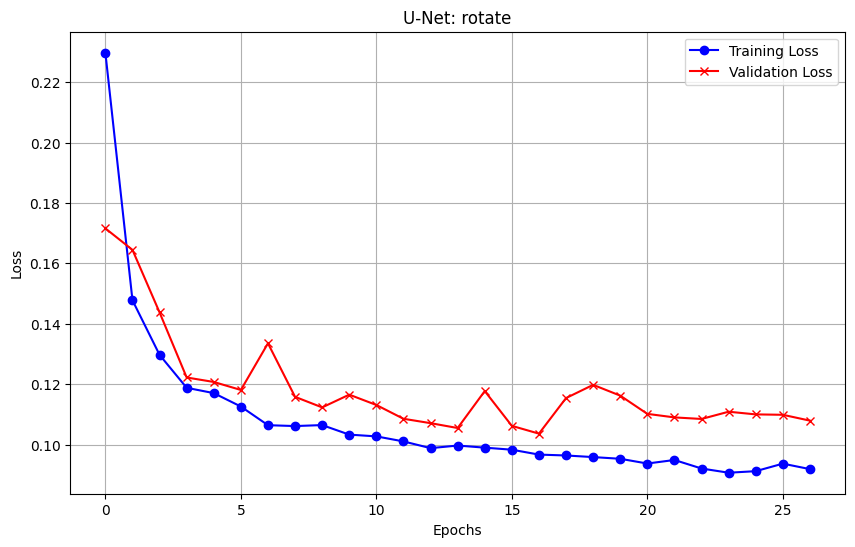

Combined dataset length: 140
Augmented Dataset: noise, len: 140


Epoch 1/100 Training: 100%|██████████| 140/140 [00:58<00:00,  2.38it/s, loss=0.142]


Epoch 1/100, Training Loss: 0.2461
Epoch 1/100, Validation Loss: 0.1896
Best model saved at epoch 1 with validation loss: 0.1896


Epoch 2/100 Training: 100%|██████████| 140/140 [00:58<00:00,  2.38it/s, loss=0.135]


Epoch 2/100, Training Loss: 0.1810
Epoch 2/100, Validation Loss: 0.1588
Best model saved at epoch 2 with validation loss: 0.1588


Epoch 3/100 Training: 100%|██████████| 140/140 [00:59<00:00,  2.37it/s, loss=0.133]


Epoch 3/100, Training Loss: 0.1695
Epoch 3/100, Validation Loss: 0.1590


Epoch 4/100 Training: 100%|██████████| 140/140 [00:58<00:00,  2.38it/s, loss=0.166]


Epoch 4/100, Training Loss: 0.1616
Epoch 4/100, Validation Loss: 0.1516
Best model saved at epoch 4 with validation loss: 0.1516


Epoch 5/100 Training: 100%|██████████| 140/140 [00:58<00:00,  2.38it/s, loss=0.273]


Epoch 5/100, Training Loss: 0.1575
Epoch 5/100, Validation Loss: 0.1477
Best model saved at epoch 5 with validation loss: 0.1477


Epoch 6/100 Training: 100%|██████████| 140/140 [00:58<00:00,  2.38it/s, loss=0.114]


Epoch 6/100, Training Loss: 0.1535
Epoch 6/100, Validation Loss: 0.1389
Best model saved at epoch 6 with validation loss: 0.1389


Epoch 7/100 Training: 100%|██████████| 140/140 [00:58<00:00,  2.38it/s, loss=0.125]


Epoch 7/100, Training Loss: 0.1478
Epoch 7/100, Validation Loss: 0.1338
Best model saved at epoch 7 with validation loss: 0.1338


Epoch 8/100 Training: 100%|██████████| 140/140 [00:58<00:00,  2.38it/s, loss=0.119]


Epoch 8/100, Training Loss: 0.1436
Epoch 8/100, Validation Loss: 0.1391


Epoch 9/100 Training: 100%|██████████| 140/140 [00:59<00:00,  2.37it/s, loss=0.153]


Epoch 9/100, Training Loss: 0.1425
Epoch 9/100, Validation Loss: 0.1352


Epoch 10/100 Training: 100%|██████████| 140/140 [00:58<00:00,  2.39it/s, loss=0.122]


Epoch 10/100, Training Loss: 0.1295
Epoch 10/100, Validation Loss: 0.1244
Best model saved at epoch 10 with validation loss: 0.1244


Epoch 11/100 Training: 100%|██████████| 140/140 [00:58<00:00,  2.38it/s, loss=0.182]


Epoch 11/100, Training Loss: 0.1271
Epoch 11/100, Validation Loss: 0.1241
Best model saved at epoch 11 with validation loss: 0.1241


Epoch 12/100 Training: 100%|██████████| 140/140 [00:59<00:00,  2.37it/s, loss=0.161]


Epoch 12/100, Training Loss: 0.1235
Epoch 12/100, Validation Loss: 0.1205
Best model saved at epoch 12 with validation loss: 0.1205


Epoch 13/100 Training: 100%|██████████| 140/140 [00:58<00:00,  2.38it/s, loss=0.0926]


Epoch 13/100, Training Loss: 0.1245
Epoch 13/100, Validation Loss: 0.1168
Best model saved at epoch 13 with validation loss: 0.1168


Epoch 14/100 Training: 100%|██████████| 140/140 [00:59<00:00,  2.37it/s, loss=0.153]


Epoch 14/100, Training Loss: 0.1206
Epoch 14/100, Validation Loss: 0.1209


Epoch 15/100 Training: 100%|██████████| 140/140 [00:58<00:00,  2.38it/s, loss=0.0776]


Epoch 15/100, Training Loss: 0.1183
Epoch 15/100, Validation Loss: 0.1116
Best model saved at epoch 15 with validation loss: 0.1116


Epoch 16/100 Training: 100%|██████████| 140/140 [00:58<00:00,  2.38it/s, loss=0.0932]


Epoch 16/100, Training Loss: 0.1195
Epoch 16/100, Validation Loss: 0.1262


Epoch 17/100 Training: 100%|██████████| 140/140 [00:58<00:00,  2.37it/s, loss=0.0752]


Epoch 17/100, Training Loss: 0.1207
Epoch 17/100, Validation Loss: 0.1142


Epoch 18/100 Training: 100%|██████████| 140/140 [00:58<00:00,  2.38it/s, loss=0.0718]


Epoch 18/100, Training Loss: 0.1187
Epoch 18/100, Validation Loss: 0.1104
Best model saved at epoch 18 with validation loss: 0.1104


Epoch 19/100 Training: 100%|██████████| 140/140 [00:59<00:00,  2.37it/s, loss=0.104]


Epoch 19/100, Training Loss: 0.1149
Epoch 19/100, Validation Loss: 0.1130


Epoch 20/100 Training: 100%|██████████| 140/140 [00:58<00:00,  2.38it/s, loss=0.149]


Epoch 20/100, Training Loss: 0.1108
Epoch 20/100, Validation Loss: 0.1218


Epoch 21/100 Training: 100%|██████████| 140/140 [00:58<00:00,  2.37it/s, loss=0.119]


Epoch 21/100, Training Loss: 0.1130
Epoch 21/100, Validation Loss: 0.1280


Epoch 22/100 Training: 100%|██████████| 140/140 [00:58<00:00,  2.38it/s, loss=0.126]


Epoch 22/100, Training Loss: 0.1109
Epoch 22/100, Validation Loss: 0.1142


Epoch 23/100 Training: 100%|██████████| 140/140 [00:58<00:00,  2.38it/s, loss=0.144]


Epoch 23/100, Training Loss: 0.1111
Epoch 23/100, Validation Loss: 0.1170


Epoch 24/100 Training: 100%|██████████| 140/140 [00:58<00:00,  2.38it/s, loss=0.171]


Epoch 24/100, Training Loss: 0.1107
Epoch 24/100, Validation Loss: 0.1185


Epoch 25/100 Training: 100%|██████████| 140/140 [00:58<00:00,  2.39it/s, loss=0.0709]


Epoch 25/100, Training Loss: 0.1069
Epoch 25/100, Validation Loss: 0.1080
Best model saved at epoch 25 with validation loss: 0.1080


Epoch 26/100 Training: 100%|██████████| 140/140 [00:58<00:00,  2.37it/s, loss=0.0804]


Epoch 26/100, Training Loss: 0.1078
Epoch 26/100, Validation Loss: 0.1273


Epoch 27/100 Training: 100%|██████████| 140/140 [00:59<00:00,  2.37it/s, loss=0.176]


Epoch 27/100, Training Loss: 0.1067
Epoch 27/100, Validation Loss: 0.1158


Epoch 28/100 Training: 100%|██████████| 140/140 [00:59<00:00,  2.37it/s, loss=0.0713]


Epoch 28/100, Training Loss: 0.1050
Epoch 28/100, Validation Loss: 0.1187


Epoch 29/100 Training: 100%|██████████| 140/140 [00:59<00:00,  2.36it/s, loss=0.0939]


Epoch 29/100, Training Loss: 0.1029
Epoch 29/100, Validation Loss: 0.1200


Epoch 30/100 Training: 100%|██████████| 140/140 [00:58<00:00,  2.37it/s, loss=0.099]


Epoch 30/100, Training Loss: 0.1023
Epoch 30/100, Validation Loss: 0.1148


Epoch 31/100 Training: 100%|██████████| 140/140 [00:59<00:00,  2.37it/s, loss=0.0914]


Epoch 31/100, Training Loss: 0.1023
Epoch 31/100, Validation Loss: 0.1132


Epoch 32/100 Training: 100%|██████████| 140/140 [00:58<00:00,  2.38it/s, loss=0.0958]


Epoch 32/100, Training Loss: 0.1012
Epoch 32/100, Validation Loss: 0.1141


Epoch 33/100 Training: 100%|██████████| 140/140 [00:58<00:00,  2.38it/s, loss=0.0892]


Epoch 33/100, Training Loss: 0.1015
Epoch 33/100, Validation Loss: 0.1141


Epoch 34/100 Training: 100%|██████████| 140/140 [00:58<00:00,  2.39it/s, loss=0.085]


Epoch 34/100, Training Loss: 0.0995
Epoch 34/100, Validation Loss: 0.1187


Epoch 35/100 Training: 100%|██████████| 140/140 [00:58<00:00,  2.39it/s, loss=0.0699]


Epoch 35/100, Training Loss: 0.0988
Epoch 35/100, Validation Loss: 0.1120
Early stopping triggered after 10 epochs without improvement.
Training completed. Best model was saved at epoch 25 with a validation loss of 0.1080


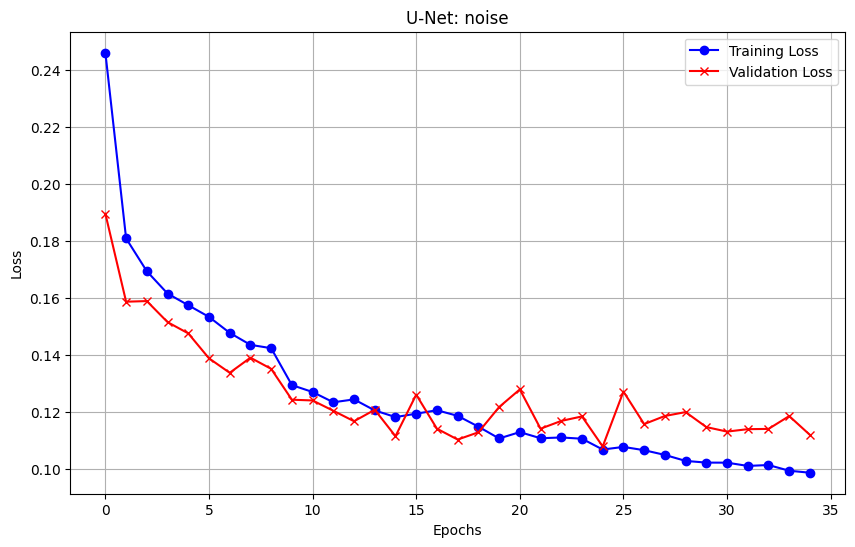

Combined dataset length: 140
Augmented Dataset: blur, len: 140


Epoch 1/100 Training: 100%|██████████| 140/140 [00:44<00:00,  3.14it/s, loss=0.196]


Epoch 1/100, Training Loss: 0.2428
Epoch 1/100, Validation Loss: 0.1736
Best model saved at epoch 1 with validation loss: 0.1736


Epoch 2/100 Training: 100%|██████████| 140/140 [00:44<00:00,  3.14it/s, loss=0.154]


Epoch 2/100, Training Loss: 0.1521
Epoch 2/100, Validation Loss: 0.1378
Best model saved at epoch 2 with validation loss: 0.1378


Epoch 3/100 Training: 100%|██████████| 140/140 [00:43<00:00,  3.19it/s, loss=0.115]


Epoch 3/100, Training Loss: 0.1348
Epoch 3/100, Validation Loss: 0.1425


Epoch 4/100 Training: 100%|██████████| 140/140 [00:43<00:00,  3.19it/s, loss=0.167]


Epoch 4/100, Training Loss: 0.1325
Epoch 4/100, Validation Loss: 0.1372
Best model saved at epoch 4 with validation loss: 0.1372


Epoch 5/100 Training: 100%|██████████| 140/140 [00:44<00:00,  3.12it/s, loss=0.142]


Epoch 5/100, Training Loss: 0.1189
Epoch 5/100, Validation Loss: 0.1298
Best model saved at epoch 5 with validation loss: 0.1298


Epoch 6/100 Training: 100%|██████████| 140/140 [00:43<00:00,  3.20it/s, loss=0.0843]


Epoch 6/100, Training Loss: 0.1159
Epoch 6/100, Validation Loss: 0.1218
Best model saved at epoch 6 with validation loss: 0.1218


Epoch 7/100 Training: 100%|██████████| 140/140 [00:44<00:00,  3.16it/s, loss=0.0859]


Epoch 7/100, Training Loss: 0.1136
Epoch 7/100, Validation Loss: 0.1188
Best model saved at epoch 7 with validation loss: 0.1188


Epoch 8/100 Training: 100%|██████████| 140/140 [00:44<00:00,  3.15it/s, loss=0.0843]


Epoch 8/100, Training Loss: 0.1070
Epoch 8/100, Validation Loss: 0.1280


Epoch 9/100 Training: 100%|██████████| 140/140 [00:44<00:00,  3.15it/s, loss=0.0832]


Epoch 9/100, Training Loss: 0.1093
Epoch 9/100, Validation Loss: 0.1132
Best model saved at epoch 9 with validation loss: 0.1132


Epoch 10/100 Training: 100%|██████████| 140/140 [00:43<00:00,  3.19it/s, loss=0.143]


Epoch 10/100, Training Loss: 0.1070
Epoch 10/100, Validation Loss: 0.1288


Epoch 11/100 Training: 100%|██████████| 140/140 [00:44<00:00,  3.16it/s, loss=0.0799]


Epoch 11/100, Training Loss: 0.1035
Epoch 11/100, Validation Loss: 0.1097
Best model saved at epoch 11 with validation loss: 0.1097


Epoch 12/100 Training: 100%|██████████| 140/140 [00:44<00:00,  3.11it/s, loss=0.146]


Epoch 12/100, Training Loss: 0.0999
Epoch 12/100, Validation Loss: 0.1131


Epoch 13/100 Training: 100%|██████████| 140/140 [00:44<00:00,  3.17it/s, loss=0.0963]


Epoch 13/100, Training Loss: 0.0981
Epoch 13/100, Validation Loss: 0.1142


Epoch 14/100 Training: 100%|██████████| 140/140 [00:44<00:00,  3.17it/s, loss=0.114]


Epoch 14/100, Training Loss: 0.0972
Epoch 14/100, Validation Loss: 0.1120


Epoch 15/100 Training: 100%|██████████| 140/140 [00:43<00:00,  3.18it/s, loss=0.159]


Epoch 15/100, Training Loss: 0.0969
Epoch 15/100, Validation Loss: 0.1118


Epoch 16/100 Training: 100%|██████████| 140/140 [00:43<00:00,  3.20it/s, loss=0.121]


Epoch 16/100, Training Loss: 0.0964
Epoch 16/100, Validation Loss: 0.1084
Best model saved at epoch 16 with validation loss: 0.1084


Epoch 17/100 Training: 100%|██████████| 140/140 [00:43<00:00,  3.19it/s, loss=0.178]


Epoch 17/100, Training Loss: 0.0967
Epoch 17/100, Validation Loss: 0.1129


Epoch 18/100 Training: 100%|██████████| 140/140 [00:44<00:00,  3.12it/s, loss=0.0742]


Epoch 18/100, Training Loss: 0.0923
Epoch 18/100, Validation Loss: 0.1150


Epoch 19/100 Training: 100%|██████████| 140/140 [00:44<00:00,  3.14it/s, loss=0.0814]


Epoch 19/100, Training Loss: 0.0895
Epoch 19/100, Validation Loss: 0.1107


Epoch 20/100 Training: 100%|██████████| 140/140 [00:44<00:00,  3.11it/s, loss=0.0798]


Epoch 20/100, Training Loss: 0.0887
Epoch 20/100, Validation Loss: 0.1115


Epoch 21/100 Training: 100%|██████████| 140/140 [00:45<00:00,  3.11it/s, loss=0.0766]


Epoch 21/100, Training Loss: 0.0878
Epoch 21/100, Validation Loss: 0.1138


Epoch 22/100 Training: 100%|██████████| 140/140 [00:44<00:00,  3.17it/s, loss=0.0888]


Epoch 22/100, Training Loss: 0.0868
Epoch 22/100, Validation Loss: 0.1087


Epoch 23/100 Training: 100%|██████████| 140/140 [00:44<00:00,  3.16it/s, loss=0.0825]


Epoch 23/100, Training Loss: 0.0884
Epoch 23/100, Validation Loss: 0.1237


Epoch 24/100 Training: 100%|██████████| 140/140 [00:43<00:00,  3.19it/s, loss=0.108]


Epoch 24/100, Training Loss: 0.0893
Epoch 24/100, Validation Loss: 0.1179


Epoch 25/100 Training: 100%|██████████| 140/140 [00:44<00:00,  3.17it/s, loss=0.07]


Epoch 25/100, Training Loss: 0.0830
Epoch 25/100, Validation Loss: 0.1119


Epoch 26/100 Training: 100%|██████████| 140/140 [00:44<00:00,  3.16it/s, loss=0.0755]


Epoch 26/100, Training Loss: 0.0818
Epoch 26/100, Validation Loss: 0.1130
Early stopping triggered after 10 epochs without improvement.
Training completed. Best model was saved at epoch 16 with a validation loss of 0.1084


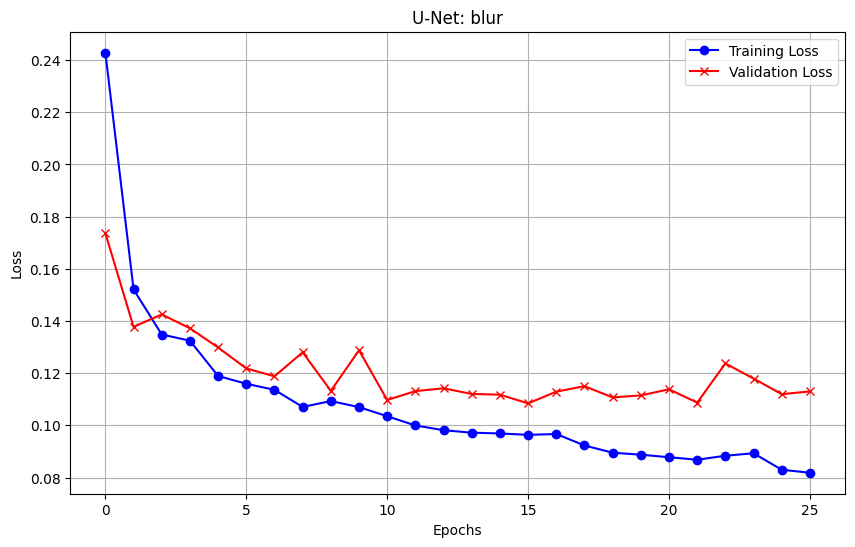

In [ ]:
import numpy as np
# training on datasets after different DA
augment_methods = ['rotate', 'noise', 'blur']
for method in augment_methods:
    aug_dataset = create_augmented_dataset(train_image_paths, train_mask_paths, method)
    print(f"Augmented Dataset: {method}, len: {len(aug_dataset)}")

    model = ResNetUNet(n_class=1).to(device)
    # init training parameters
    criterion = nn.BCEWithLogitsLoss()
    optimizer = optim.AdamW(model.parameters(), lr=0.001, weight_decay=0.01)
    num_epochs = 100

    batch_size=1
    aug_train_loader = DataLoader(aug_dataset, batch_size=1, shuffle=True)

    train_losses, val_losses = train_unet(model, aug_train_loader, val_loader,  criterion, optimizer, num_epochs, device, model_save_path)
    title = f"U-Net: {method}"
    plot_losses(train_losses, val_losses, title)


### Evaluation the performance of different DA method

Evaluating model: ./drive/MyDrive/9517/best_model_rotate.pth
Average Dice Coefficient: 0.7605
Average IoU: 0.6142
Average Accuracy: 0.9513


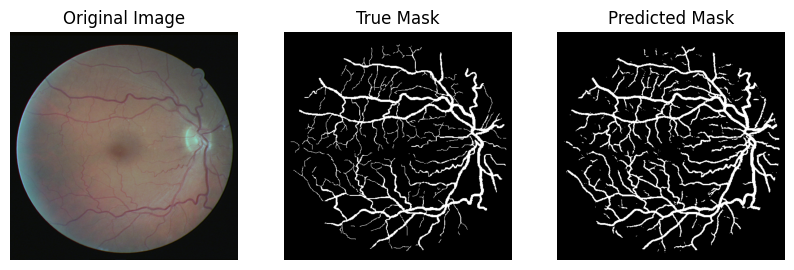

Evaluating model: ./drive/MyDrive/9517/best_model_noise.pth
Average Dice Coefficient: 0.7487
Average IoU: 0.5991
Average Accuracy: 0.9499


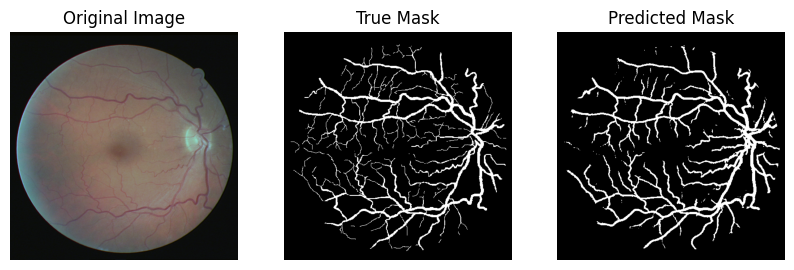

Evaluating model: ./drive/MyDrive/9517/best_model_blur.pth
Average Dice Coefficient: 0.7193
Average IoU: 0.5630
Average Accuracy: 0.9411


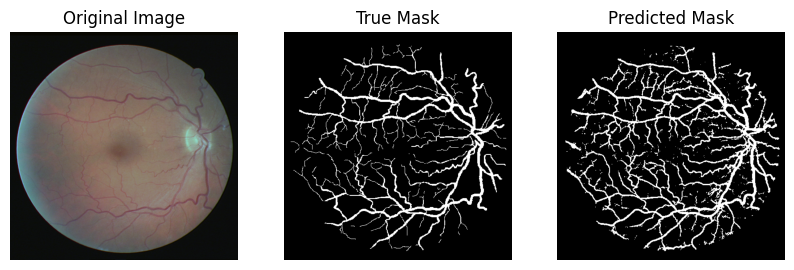

In [ ]:
model = ResNetUNet(n_class=1).to(device)
augment_methods = ['rotate', 'noise', 'blur']
for method in augment_methods:
    model_path = os.path.join(dir_save, f'best_model_{method}.pth')
    if os.path.isfile(model_path):
        model.load_state_dict(torch.load(model_path))
        print(f"Evaluating model: {model_path}")
        evaluate_model(model, test_loader, device)
        evaluate_and_plot(model, test_loader, device, num_images_to_plot=1)
    else:
        print(f"Model file not found: {model_path}")

### DA Comparison Experiments Summary
Rotate performs best which leads a **6% improvement from 70 to 76 on Dice.**

Hence, We will use this random rotate in our following experiments.

### Experiment on ResUNet after DA
- Result shows that it performance on test **increased from 70 to 75 on Dice after three times larger training data set using DA.**

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Epoch 1/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.36it/s, loss=0.242]


Epoch 1/100, Training Loss: 0.3116
Epoch 1/100, Validation Loss: 0.2259
Best model saved at epoch 1 with validation loss: 0.2259


Epoch 2/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.37it/s, loss=0.12]


Epoch 2/100, Training Loss: 0.1740
Epoch 2/100, Validation Loss: 0.1778
Best model saved at epoch 2 with validation loss: 0.1778


Epoch 3/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.38it/s, loss=0.169]


Epoch 3/100, Training Loss: 0.1575
Epoch 3/100, Validation Loss: 0.1489
Best model saved at epoch 3 with validation loss: 0.1489


Epoch 4/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.38it/s, loss=0.141]


Epoch 4/100, Training Loss: 0.1365
Epoch 4/100, Validation Loss: 0.1299
Best model saved at epoch 4 with validation loss: 0.1299


Epoch 5/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.36it/s, loss=0.132]


Epoch 5/100, Training Loss: 0.1262
Epoch 5/100, Validation Loss: 0.1219
Best model saved at epoch 5 with validation loss: 0.1219


Epoch 6/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.37it/s, loss=0.111]


Epoch 6/100, Training Loss: 0.1212
Epoch 6/100, Validation Loss: 0.1166
Best model saved at epoch 6 with validation loss: 0.1166


Epoch 7/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.37it/s, loss=0.112]


Epoch 7/100, Training Loss: 0.1171
Epoch 7/100, Validation Loss: 0.1137
Best model saved at epoch 7 with validation loss: 0.1137


Epoch 8/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.36it/s, loss=0.0924]


Epoch 8/100, Training Loss: 0.1141
Epoch 8/100, Validation Loss: 0.1281


Epoch 9/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.37it/s, loss=0.115]


Epoch 9/100, Training Loss: 0.1110
Epoch 9/100, Validation Loss: 0.1115
Best model saved at epoch 9 with validation loss: 0.1115


Epoch 10/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.38it/s, loss=0.101]


Epoch 10/100, Training Loss: 0.1087
Epoch 10/100, Validation Loss: 0.1069
Best model saved at epoch 10 with validation loss: 0.1069


Epoch 11/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.37it/s, loss=0.0963]


Epoch 11/100, Training Loss: 0.1074
Epoch 11/100, Validation Loss: 0.1054
Best model saved at epoch 11 with validation loss: 0.1054


Epoch 12/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.37it/s, loss=0.118]


Epoch 12/100, Training Loss: 0.1066
Epoch 12/100, Validation Loss: 0.1072


Epoch 13/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.36it/s, loss=0.0836]


Epoch 13/100, Training Loss: 0.1043
Epoch 13/100, Validation Loss: 0.1071


Epoch 14/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.37it/s, loss=0.144]


Epoch 14/100, Training Loss: 0.1044
Epoch 14/100, Validation Loss: 0.1054


Epoch 15/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.36it/s, loss=0.104]


Epoch 15/100, Training Loss: 0.1039
Epoch 15/100, Validation Loss: 0.1046
Best model saved at epoch 15 with validation loss: 0.1046


Epoch 16/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.39it/s, loss=0.116]


Epoch 16/100, Training Loss: 0.1034
Epoch 16/100, Validation Loss: 0.1020
Best model saved at epoch 16 with validation loss: 0.1020


Epoch 17/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.36it/s, loss=0.085]


Epoch 17/100, Training Loss: 0.1014
Epoch 17/100, Validation Loss: 0.1009
Best model saved at epoch 17 with validation loss: 0.1009


Epoch 18/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.36it/s, loss=0.0858]


Epoch 18/100, Training Loss: 0.0988
Epoch 18/100, Validation Loss: 0.0999
Best model saved at epoch 18 with validation loss: 0.0999


Epoch 19/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.37it/s, loss=0.118]


Epoch 19/100, Training Loss: 0.0974
Epoch 19/100, Validation Loss: 0.0980
Best model saved at epoch 19 with validation loss: 0.0980


Epoch 20/100 Training: 100%|██████████| 53/53 [00:39<00:00,  1.36it/s, loss=0.0774]


Epoch 20/100, Training Loss: 0.0962
Epoch 20/100, Validation Loss: 0.1001


Epoch 21/100 Training: 100%|██████████| 53/53 [00:39<00:00,  1.35it/s, loss=0.0779]


Epoch 21/100, Training Loss: 0.0962
Epoch 21/100, Validation Loss: 0.1020


Epoch 22/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.36it/s, loss=0.103]


Epoch 22/100, Training Loss: 0.0955
Epoch 22/100, Validation Loss: 0.1005


Epoch 23/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.37it/s, loss=0.0831]


Epoch 23/100, Training Loss: 0.0984
Epoch 23/100, Validation Loss: 0.0978
Best model saved at epoch 23 with validation loss: 0.0978


Epoch 24/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.37it/s, loss=0.0728]


Epoch 24/100, Training Loss: 0.0948
Epoch 24/100, Validation Loss: 0.1008


Epoch 25/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.37it/s, loss=0.0821]


Epoch 25/100, Training Loss: 0.0936
Epoch 25/100, Validation Loss: 0.0993


Epoch 26/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.37it/s, loss=0.101]


Epoch 26/100, Training Loss: 0.0947
Epoch 26/100, Validation Loss: 0.0984


Epoch 27/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.37it/s, loss=0.0917]


Epoch 27/100, Training Loss: 0.0939
Epoch 27/100, Validation Loss: 0.0994


Epoch 28/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.38it/s, loss=0.0908]


Epoch 28/100, Training Loss: 0.0928
Epoch 28/100, Validation Loss: 0.0988


Epoch 29/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.38it/s, loss=0.103]


Epoch 29/100, Training Loss: 0.0953
Epoch 29/100, Validation Loss: 0.1016


Epoch 30/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.37it/s, loss=0.082]


Epoch 30/100, Training Loss: 0.0974
Epoch 30/100, Validation Loss: 0.1004


Epoch 31/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.37it/s, loss=0.0787]


Epoch 31/100, Training Loss: 0.0941
Epoch 31/100, Validation Loss: 0.0958
Best model saved at epoch 31 with validation loss: 0.0958


Epoch 32/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.37it/s, loss=0.0872]


Epoch 32/100, Training Loss: 0.0901
Epoch 32/100, Validation Loss: 0.0948
Best model saved at epoch 32 with validation loss: 0.0948


Epoch 33/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.37it/s, loss=0.0842]


Epoch 33/100, Training Loss: 0.0910
Epoch 33/100, Validation Loss: 0.0957


Epoch 34/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.38it/s, loss=0.138]


Epoch 34/100, Training Loss: 0.0913
Epoch 34/100, Validation Loss: 0.0936
Best model saved at epoch 34 with validation loss: 0.0936


Epoch 35/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.36it/s, loss=0.112]


Epoch 35/100, Training Loss: 0.0906
Epoch 35/100, Validation Loss: 0.0966


Epoch 36/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.38it/s, loss=0.0822]


Epoch 36/100, Training Loss: 0.0893
Epoch 36/100, Validation Loss: 0.0943


Epoch 37/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.37it/s, loss=0.0741]


Epoch 37/100, Training Loss: 0.0927
Epoch 37/100, Validation Loss: 0.0953


Epoch 38/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.38it/s, loss=0.0866]


Epoch 38/100, Training Loss: 0.0905
Epoch 38/100, Validation Loss: 0.0954


Epoch 39/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.38it/s, loss=0.0994]


Epoch 39/100, Training Loss: 0.0890
Epoch 39/100, Validation Loss: 0.0932
Best model saved at epoch 39 with validation loss: 0.0932


Epoch 40/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.38it/s, loss=0.0738]


Epoch 40/100, Training Loss: 0.0887
Epoch 40/100, Validation Loss: 0.0929
Best model saved at epoch 40 with validation loss: 0.0929


Epoch 41/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.37it/s, loss=0.0743]


Epoch 41/100, Training Loss: 0.0887
Epoch 41/100, Validation Loss: 0.0941


Epoch 42/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.39it/s, loss=0.06]


Epoch 42/100, Training Loss: 0.0878
Epoch 42/100, Validation Loss: 0.0918
Best model saved at epoch 42 with validation loss: 0.0918


Epoch 43/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.37it/s, loss=0.0696]


Epoch 43/100, Training Loss: 0.0882
Epoch 43/100, Validation Loss: 0.0938


Epoch 44/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.37it/s, loss=0.0726]


Epoch 44/100, Training Loss: 0.0885
Epoch 44/100, Validation Loss: 0.0928


Epoch 45/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.38it/s, loss=0.0992]


Epoch 45/100, Training Loss: 0.0887
Epoch 45/100, Validation Loss: 0.0971


Epoch 46/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.38it/s, loss=0.0838]


Epoch 46/100, Training Loss: 0.0903
Epoch 46/100, Validation Loss: 0.0973


Epoch 47/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.37it/s, loss=0.0976]


Epoch 47/100, Training Loss: 0.0865
Epoch 47/100, Validation Loss: 0.0923


Epoch 48/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.38it/s, loss=0.0748]


Epoch 48/100, Training Loss: 0.0869
Epoch 48/100, Validation Loss: 0.0923


Epoch 49/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.38it/s, loss=0.0934]


Epoch 49/100, Training Loss: 0.0867
Epoch 49/100, Validation Loss: 0.0907
Best model saved at epoch 49 with validation loss: 0.0907


Epoch 50/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.37it/s, loss=0.0946]


Epoch 50/100, Training Loss: 0.0856
Epoch 50/100, Validation Loss: 0.0917


Epoch 51/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.39it/s, loss=0.0687]


Epoch 51/100, Training Loss: 0.0855
Epoch 51/100, Validation Loss: 0.0922


Epoch 52/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.38it/s, loss=0.0872]


Epoch 52/100, Training Loss: 0.0852
Epoch 52/100, Validation Loss: 0.0936


Epoch 53/100 Training: 100%|██████████| 53/53 [00:39<00:00,  1.36it/s, loss=0.113]


Epoch 53/100, Training Loss: 0.0865
Epoch 53/100, Validation Loss: 0.0961


Epoch 54/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.37it/s, loss=0.0982]


Epoch 54/100, Training Loss: 0.0866
Epoch 54/100, Validation Loss: 0.0926


Epoch 55/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.37it/s, loss=0.0678]


Epoch 55/100, Training Loss: 0.0850
Epoch 55/100, Validation Loss: 0.0946


Epoch 56/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.39it/s, loss=0.0654]


Epoch 56/100, Training Loss: 0.0869
Epoch 56/100, Validation Loss: 0.0953


Epoch 57/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.36it/s, loss=0.101]


Epoch 57/100, Training Loss: 0.0877
Epoch 57/100, Validation Loss: 0.0930


Epoch 58/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.38it/s, loss=0.113]


Epoch 58/100, Training Loss: 0.0862
Epoch 58/100, Validation Loss: 0.0895
Best model saved at epoch 58 with validation loss: 0.0895


Epoch 59/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.36it/s, loss=0.0917]


Epoch 59/100, Training Loss: 0.0845
Epoch 59/100, Validation Loss: 0.0972


Epoch 60/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.37it/s, loss=0.08]


Epoch 60/100, Training Loss: 0.0850
Epoch 60/100, Validation Loss: 0.0900


Epoch 61/100 Training: 100%|██████████| 53/53 [00:39<00:00,  1.35it/s, loss=0.0879]


Epoch 61/100, Training Loss: 0.0835
Epoch 61/100, Validation Loss: 0.0962


Epoch 62/100 Training: 100%|██████████| 53/53 [00:39<00:00,  1.35it/s, loss=0.0694]


Epoch 62/100, Training Loss: 0.0835
Epoch 62/100, Validation Loss: 0.0915


Epoch 63/100 Training: 100%|██████████| 53/53 [00:39<00:00,  1.36it/s, loss=0.0818]


Epoch 63/100, Training Loss: 0.0843
Epoch 63/100, Validation Loss: 0.0915


Epoch 64/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.37it/s, loss=0.0751]


Epoch 64/100, Training Loss: 0.0842
Epoch 64/100, Validation Loss: 0.0902


Epoch 65/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.37it/s, loss=0.0815]


Epoch 65/100, Training Loss: 0.0822
Epoch 65/100, Validation Loss: 0.0898


Epoch 66/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.37it/s, loss=0.0946]


Epoch 66/100, Training Loss: 0.0842
Epoch 66/100, Validation Loss: 0.0920


Epoch 67/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.37it/s, loss=0.101]


Epoch 67/100, Training Loss: 0.0836
Epoch 67/100, Validation Loss: 0.0900


Epoch 68/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.37it/s, loss=0.0686]


Epoch 68/100, Training Loss: 0.0828
Epoch 68/100, Validation Loss: 0.0890
Best model saved at epoch 68 with validation loss: 0.0890


Epoch 69/100 Training: 100%|██████████| 53/53 [00:39<00:00,  1.36it/s, loss=0.0777]


Epoch 69/100, Training Loss: 0.0828
Epoch 69/100, Validation Loss: 0.0924


Epoch 70/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.37it/s, loss=0.0771]


Epoch 70/100, Training Loss: 0.0831
Epoch 70/100, Validation Loss: 0.0905


Epoch 71/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.37it/s, loss=0.0829]


Epoch 71/100, Training Loss: 0.0824
Epoch 71/100, Validation Loss: 0.0915


Epoch 72/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.36it/s, loss=0.101]


Epoch 72/100, Training Loss: 0.0868
Epoch 72/100, Validation Loss: 0.0925


Epoch 73/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.38it/s, loss=0.0783]


Epoch 73/100, Training Loss: 0.0830
Epoch 73/100, Validation Loss: 0.0948


Epoch 74/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.38it/s, loss=0.0753]


Epoch 74/100, Training Loss: 0.0829
Epoch 74/100, Validation Loss: 0.0903


Epoch 75/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.39it/s, loss=0.13]


Epoch 75/100, Training Loss: 0.0819
Epoch 75/100, Validation Loss: 0.0914


Epoch 76/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.38it/s, loss=0.0939]


Epoch 76/100, Training Loss: 0.0821
Epoch 76/100, Validation Loss: 0.0905


Epoch 77/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.38it/s, loss=0.109]


Epoch 77/100, Training Loss: 0.0820
Epoch 77/100, Validation Loss: 0.0895


Epoch 78/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.36it/s, loss=0.08]


Epoch 78/100, Training Loss: 0.0810
Epoch 78/100, Validation Loss: 0.0889
Best model saved at epoch 78 with validation loss: 0.0889


Epoch 79/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.37it/s, loss=0.0942]


Epoch 79/100, Training Loss: 0.0811
Epoch 79/100, Validation Loss: 0.0901


Epoch 80/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.37it/s, loss=0.0643]


Epoch 80/100, Training Loss: 0.0808
Epoch 80/100, Validation Loss: 0.0904


Epoch 81/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.36it/s, loss=0.0823]


Epoch 81/100, Training Loss: 0.0811
Epoch 81/100, Validation Loss: 0.0924


Epoch 82/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.38it/s, loss=0.0795]


Epoch 82/100, Training Loss: 0.0823
Epoch 82/100, Validation Loss: 0.0880
Best model saved at epoch 82 with validation loss: 0.0880


Epoch 83/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.37it/s, loss=0.086]


Epoch 83/100, Training Loss: 0.0800
Epoch 83/100, Validation Loss: 0.0909


Epoch 84/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.37it/s, loss=0.0774]


Epoch 84/100, Training Loss: 0.0801
Epoch 84/100, Validation Loss: 0.0887


Epoch 85/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.37it/s, loss=0.0881]


Epoch 85/100, Training Loss: 0.0804
Epoch 85/100, Validation Loss: 0.0875
Best model saved at epoch 85 with validation loss: 0.0875


Epoch 86/100 Training: 100%|██████████| 53/53 [00:39<00:00,  1.35it/s, loss=0.0955]


Epoch 86/100, Training Loss: 0.0796
Epoch 86/100, Validation Loss: 0.0903


Epoch 87/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.38it/s, loss=0.0865]


Epoch 87/100, Training Loss: 0.0799
Epoch 87/100, Validation Loss: 0.0873
Best model saved at epoch 87 with validation loss: 0.0873


Epoch 88/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.37it/s, loss=0.0624]


Epoch 88/100, Training Loss: 0.0806
Epoch 88/100, Validation Loss: 0.0884


Epoch 89/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.38it/s, loss=0.102]


Epoch 89/100, Training Loss: 0.0802
Epoch 89/100, Validation Loss: 0.0908


Epoch 90/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.37it/s, loss=0.104]


Epoch 90/100, Training Loss: 0.0795
Epoch 90/100, Validation Loss: 0.0908


Epoch 91/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.36it/s, loss=0.0782]


Epoch 91/100, Training Loss: 0.0802
Epoch 91/100, Validation Loss: 0.0888


Epoch 92/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.36it/s, loss=0.105]


Epoch 92/100, Training Loss: 0.0796
Epoch 92/100, Validation Loss: 0.0868
Best model saved at epoch 92 with validation loss: 0.0868


Epoch 93/100 Training: 100%|██████████| 53/53 [00:39<00:00,  1.35it/s, loss=0.0886]


Epoch 93/100, Training Loss: 0.0790
Epoch 93/100, Validation Loss: 0.0909


Epoch 94/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.36it/s, loss=0.088]


Epoch 94/100, Training Loss: 0.0787
Epoch 94/100, Validation Loss: 0.0877


Epoch 95/100 Training: 100%|██████████| 53/53 [00:39<00:00,  1.36it/s, loss=0.0766]


Epoch 95/100, Training Loss: 0.0793
Epoch 95/100, Validation Loss: 0.0896


Epoch 96/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.37it/s, loss=0.076]


Epoch 96/100, Training Loss: 0.0802
Epoch 96/100, Validation Loss: 0.0886


Epoch 97/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.37it/s, loss=0.102]


Epoch 97/100, Training Loss: 0.0800
Epoch 97/100, Validation Loss: 0.0884


Epoch 98/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.37it/s, loss=0.0695]


Epoch 98/100, Training Loss: 0.0785
Epoch 98/100, Validation Loss: 0.0876


Epoch 99/100 Training: 100%|██████████| 53/53 [00:39<00:00,  1.35it/s, loss=0.0625]


Epoch 99/100, Training Loss: 0.0782
Epoch 99/100, Validation Loss: 0.0874


Epoch 100/100 Training: 100%|██████████| 53/53 [00:38<00:00,  1.36it/s, loss=0.0632]


Epoch 100/100, Training Loss: 0.0781
Epoch 100/100, Validation Loss: 0.0917
Training completed. Best model was saved at epoch 92 with a validation loss of 0.0868


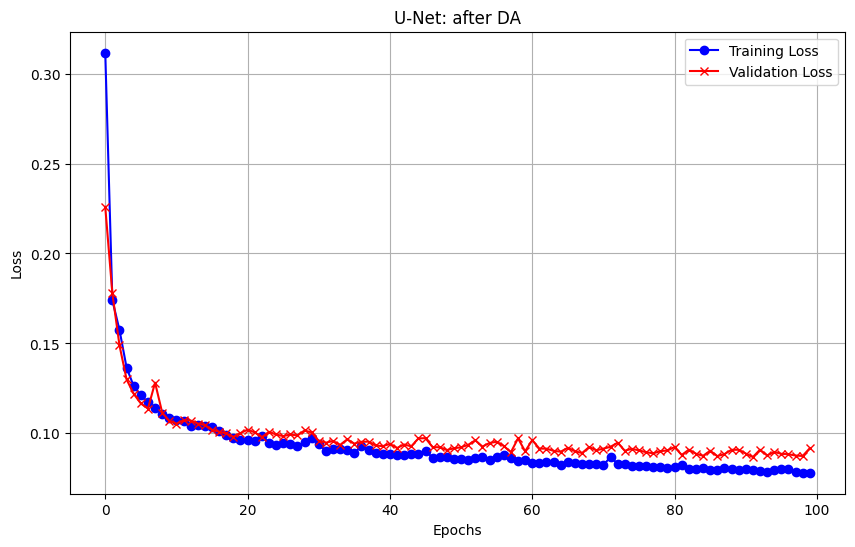

In [ ]:
model = ResNetUNet(n_class=1).to(device)


# init training parameters
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.AdamW(model.parameters(), lr=0.001, weight_decay=0.01)
num_epochs = 100
model_path = os.path.join(dir_save, f'best_model_afterDA_UNet.pth')
batch_size=4
aug_train_loader = DataLoader(aug_dataset, batch_size, shuffle=True)

train_losses, val_losses = train_unet(model, aug_train_loader, val_loader,  criterion, optimizer, num_epochs, device, model_path)
title = f"U-Net: after DA"
plot_losses(train_losses, val_losses, title)

In [ ]:
model_path = os.path.join(dir_save, f'best_model_afterDA_UNet.pth')
model.load_state_dict(torch.load(model_path))
evaluate_model(model, test_loader, device)

Average Dice Coefficient: 0.7579
Average IoU: 0.6112
Average Accuracy: 0.9503


## Imporved Model Expiremnets

## improvement model results


### Aggregation UNet

In [ ]:

# init Aggregation UNet model

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)
model = AggreUNet(n_class=1).to(device)


# init training parameters
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.AdamW(model.parameters(), lr=0.001, weight_decay=0.01)
num_epochs = 100

batch_size=1

model_save_path = os.path.join(dir_save, f'AggreUNet2.pth')
train_loader = DataLoader(train_dataset, batch_size, shuffle=False)

train_loss, val_loss = train_unet(model, train_loader, val_loader, criterion, optimizer, num_epochs, device, model_save_path)

cuda


Epoch 1/100 Training: 100%|██████████| 70/70 [00:21<00:00,  3.32it/s, loss=0.267]


Epoch 1/100, Training Loss: 0.4591
Epoch 1/100, Validation Loss: 0.3496
Best model saved at epoch 1 with validation loss: 0.3496


Epoch 2/100 Training: 100%|██████████| 70/70 [00:21<00:00,  3.31it/s, loss=0.154]


Epoch 2/100, Training Loss: 0.2169
Epoch 2/100, Validation Loss: 0.2068
Best model saved at epoch 2 with validation loss: 0.2068


Epoch 3/100 Training: 100%|██████████| 70/70 [00:21<00:00,  3.32it/s, loss=0.13]


Epoch 3/100, Training Loss: 0.1566
Epoch 3/100, Validation Loss: 0.3263


Epoch 4/100 Training: 100%|██████████| 70/70 [00:20<00:00,  3.38it/s, loss=0.0929]


Epoch 4/100, Training Loss: 0.1347
Epoch 4/100, Validation Loss: 0.1746
Best model saved at epoch 4 with validation loss: 0.1746


Epoch 5/100 Training: 100%|██████████| 70/70 [00:20<00:00,  3.34it/s, loss=0.098]


Epoch 5/100, Training Loss: 0.1248
Epoch 5/100, Validation Loss: 0.1544
Best model saved at epoch 5 with validation loss: 0.1544


Epoch 6/100 Training: 100%|██████████| 70/70 [00:21<00:00,  3.32it/s, loss=0.095]


Epoch 6/100, Training Loss: 0.1186
Epoch 6/100, Validation Loss: 0.1907


Epoch 7/100 Training: 100%|██████████| 70/70 [00:20<00:00,  3.39it/s, loss=0.116]


Epoch 7/100, Training Loss: 0.1141
Epoch 7/100, Validation Loss: 0.2159


Epoch 8/100 Training: 100%|██████████| 70/70 [00:20<00:00,  3.38it/s, loss=0.0824]


Epoch 8/100, Training Loss: 0.1124
Epoch 8/100, Validation Loss: 0.1499
Best model saved at epoch 8 with validation loss: 0.1499


Epoch 9/100 Training: 100%|██████████| 70/70 [00:21<00:00,  3.32it/s, loss=0.0823]


Epoch 9/100, Training Loss: 0.1094
Epoch 9/100, Validation Loss: 0.1335
Best model saved at epoch 9 with validation loss: 0.1335


Epoch 10/100 Training: 100%|██████████| 70/70 [00:21<00:00,  3.29it/s, loss=0.0856]


Epoch 10/100, Training Loss: 0.1060
Epoch 10/100, Validation Loss: 0.1543


Epoch 11/100 Training: 100%|██████████| 70/70 [00:20<00:00,  3.37it/s, loss=0.082]


Epoch 11/100, Training Loss: 0.1054
Epoch 11/100, Validation Loss: 0.1222
Best model saved at epoch 11 with validation loss: 0.1222


Epoch 12/100 Training: 100%|██████████| 70/70 [00:21<00:00,  3.32it/s, loss=0.0741]


Epoch 12/100, Training Loss: 0.1020
Epoch 12/100, Validation Loss: 0.1363


Epoch 13/100 Training: 100%|██████████| 70/70 [00:20<00:00,  3.38it/s, loss=0.0752]


Epoch 13/100, Training Loss: 0.1012
Epoch 13/100, Validation Loss: 0.1523


Epoch 14/100 Training: 100%|██████████| 70/70 [00:21<00:00,  3.33it/s, loss=0.0726]


Epoch 14/100, Training Loss: 0.0992
Epoch 14/100, Validation Loss: 0.1327


Epoch 15/100 Training: 100%|██████████| 70/70 [00:20<00:00,  3.38it/s, loss=0.0777]


Epoch 15/100, Training Loss: 0.0991
Epoch 15/100, Validation Loss: 0.1299


Epoch 16/100 Training: 100%|██████████| 70/70 [00:20<00:00,  3.38it/s, loss=0.0726]


Epoch 16/100, Training Loss: 0.0981
Epoch 16/100, Validation Loss: 0.1286


Epoch 17/100 Training: 100%|██████████| 70/70 [00:20<00:00,  3.37it/s, loss=0.0699]


Epoch 17/100, Training Loss: 0.0967
Epoch 17/100, Validation Loss: 0.1242


Epoch 18/100 Training: 100%|██████████| 70/70 [00:20<00:00,  3.36it/s, loss=0.0721]


Epoch 18/100, Training Loss: 0.0970
Epoch 18/100, Validation Loss: 0.1161
Best model saved at epoch 18 with validation loss: 0.1161


Epoch 19/100 Training: 100%|██████████| 70/70 [00:21<00:00,  3.33it/s, loss=0.068]


Epoch 19/100, Training Loss: 0.0946
Epoch 19/100, Validation Loss: 0.1453


Epoch 20/100 Training: 100%|██████████| 70/70 [00:20<00:00,  3.37it/s, loss=0.0771]


Epoch 20/100, Training Loss: 0.0962
Epoch 20/100, Validation Loss: 0.1170


Epoch 21/100 Training: 100%|██████████| 70/70 [00:20<00:00,  3.38it/s, loss=0.0741]


Epoch 21/100, Training Loss: 0.0990
Epoch 21/100, Validation Loss: 0.1387


Epoch 22/100 Training: 100%|██████████| 70/70 [00:20<00:00,  3.38it/s, loss=0.0701]


Epoch 22/100, Training Loss: 0.0979
Epoch 22/100, Validation Loss: 0.2793


Epoch 23/100 Training: 100%|██████████| 70/70 [00:20<00:00,  3.38it/s, loss=0.0718]


Epoch 23/100, Training Loss: 0.0965
Epoch 23/100, Validation Loss: 0.1246


Epoch 24/100 Training: 100%|██████████| 70/70 [00:20<00:00,  3.39it/s, loss=0.0666]


Epoch 24/100, Training Loss: 0.0930
Epoch 24/100, Validation Loss: 0.1183


Epoch 25/100 Training: 100%|██████████| 70/70 [00:20<00:00,  3.39it/s, loss=0.0709]


Epoch 25/100, Training Loss: 0.0927
Epoch 25/100, Validation Loss: 0.1214


Epoch 26/100 Training: 100%|██████████| 70/70 [00:20<00:00,  3.37it/s, loss=0.0663]


Epoch 26/100, Training Loss: 0.0916
Epoch 26/100, Validation Loss: 0.1161


Epoch 27/100 Training: 100%|██████████| 70/70 [00:20<00:00,  3.38it/s, loss=0.0645]


Epoch 27/100, Training Loss: 0.0894
Epoch 27/100, Validation Loss: 0.1128
Best model saved at epoch 27 with validation loss: 0.1128


Epoch 28/100 Training: 100%|██████████| 70/70 [00:21<00:00,  3.32it/s, loss=0.0627]


Epoch 28/100, Training Loss: 0.0899
Epoch 28/100, Validation Loss: 0.1151


Epoch 29/100 Training: 100%|██████████| 70/70 [00:20<00:00,  3.37it/s, loss=0.063]


Epoch 29/100, Training Loss: 0.0881
Epoch 29/100, Validation Loss: 0.1103
Best model saved at epoch 29 with validation loss: 0.1103


Epoch 30/100 Training: 100%|██████████| 70/70 [00:20<00:00,  3.36it/s, loss=0.0651]


Epoch 30/100, Training Loss: 0.0896
Epoch 30/100, Validation Loss: 0.1161


Epoch 31/100 Training: 100%|██████████| 70/70 [00:20<00:00,  3.36it/s, loss=0.0661]


Epoch 31/100, Training Loss: 0.0887
Epoch 31/100, Validation Loss: 0.1150


Epoch 32/100 Training: 100%|██████████| 70/70 [00:20<00:00,  3.38it/s, loss=0.0614]


Epoch 32/100, Training Loss: 0.0873
Epoch 32/100, Validation Loss: 0.1115


Epoch 33/100 Training: 100%|██████████| 70/70 [00:20<00:00,  3.37it/s, loss=0.0664]


Epoch 33/100, Training Loss: 0.0863
Epoch 33/100, Validation Loss: 0.1144


Epoch 34/100 Training: 100%|██████████| 70/70 [00:21<00:00,  3.32it/s, loss=0.0598]


Epoch 34/100, Training Loss: 0.0864
Epoch 34/100, Validation Loss: 0.1157


Epoch 35/100 Training: 100%|██████████| 70/70 [00:20<00:00,  3.37it/s, loss=0.0619]


Epoch 35/100, Training Loss: 0.0864
Epoch 35/100, Validation Loss: 0.1128


Epoch 36/100 Training: 100%|██████████| 70/70 [00:20<00:00,  3.37it/s, loss=0.0648]


Epoch 36/100, Training Loss: 0.0858
Epoch 36/100, Validation Loss: 0.1105


Epoch 37/100 Training: 100%|██████████| 70/70 [00:20<00:00,  3.37it/s, loss=0.0611]


Epoch 37/100, Training Loss: 0.0847
Epoch 37/100, Validation Loss: 0.1147


Epoch 38/100 Training: 100%|██████████| 70/70 [00:20<00:00,  3.38it/s, loss=0.0603]


Epoch 38/100, Training Loss: 0.0848
Epoch 38/100, Validation Loss: 0.1244


Epoch 39/100 Training: 100%|██████████| 70/70 [00:20<00:00,  3.38it/s, loss=0.0582]


Epoch 39/100, Training Loss: 0.0834
Epoch 39/100, Validation Loss: 0.1176
Early stopping triggered after 10 epochs without improvement.
Training completed. Best model was saved at epoch 29 with a validation loss of 0.1103


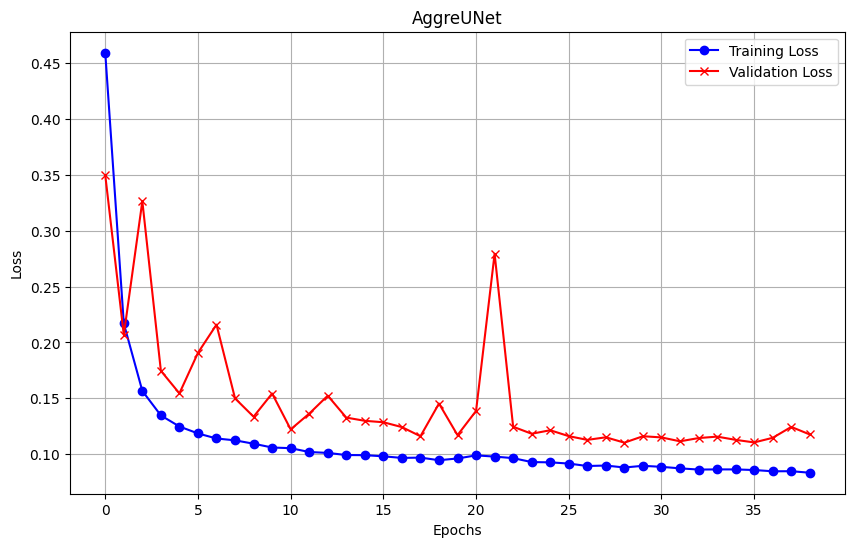

In [ ]:
plot_losses(train_loss, val_loss, title='AggreUNet')

Average Dice Coefficient: 0.7784
Average IoU: 0.6383
Average Accuracy: 0.9619


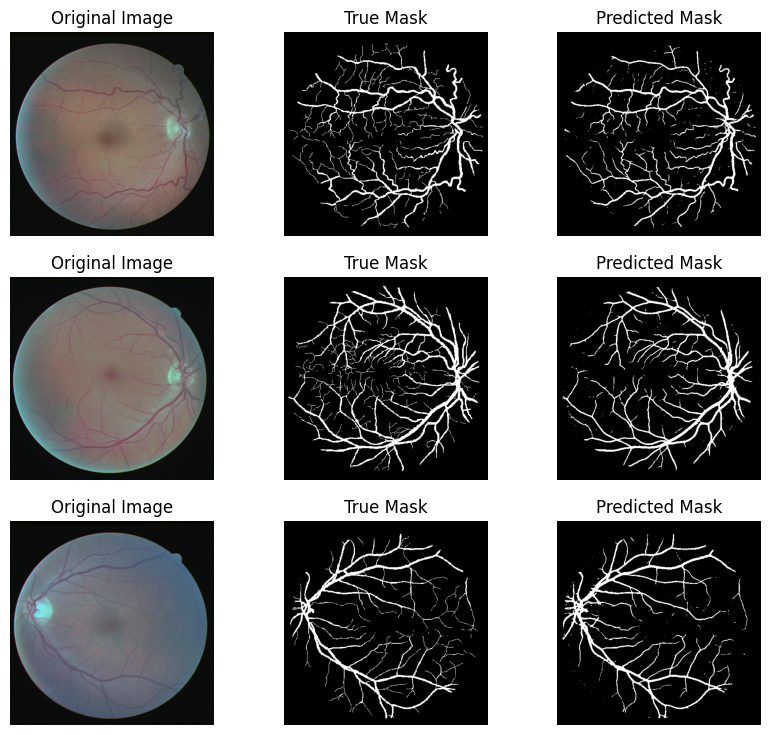

In [ ]:
model_path = os.path.join(dir_save, f'AggreUNet2.pth')
model.load_state_dict(torch.load(model_path))
evaluate_model(model, test_loader, device)
evaluate_and_plot(model, test_loader, device, num_images_to_plot=3)

#### Aggregation UNet After DA

In [ ]:
len(aug_dataset)

140

In [ ]:
# init Aggregation UNet model

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)
model = AggreUNet(n_class=1).to(device)


# init training parameters
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.AdamW(model.parameters(), lr=0.001, weight_decay=0.05)
num_epochs = 100

batch_size=2

model_save_path = os.path.join(dir_save, f'AggreUNet_afterDA.pth')
aug_train_loader = DataLoader(aug_dataset, batch_size, shuffle=True)

train_losses, val_losses = train_unet(model, aug_train_loader, val_loader,  criterion, optimizer, num_epochs, device, model_path, 5)


cuda


Epoch 1/100 Training: 100%|██████████| 70/70 [00:52<00:00,  1.34it/s, loss=0.355]


Epoch 1/100, Training Loss: 0.4979
Epoch 1/100, Validation Loss: 0.4157
Best model saved at epoch 1 with validation loss: 0.4157


Epoch 2/100 Training: 100%|██████████| 70/70 [00:52<00:00,  1.34it/s, loss=0.253]


Epoch 2/100, Training Loss: 0.3037
Epoch 2/100, Validation Loss: 0.7168


Epoch 3/100 Training: 100%|██████████| 70/70 [00:51<00:00,  1.36it/s, loss=0.251]


Epoch 3/100, Training Loss: 0.2112
Epoch 3/100, Validation Loss: 0.1627
Best model saved at epoch 3 with validation loss: 0.1627


Epoch 4/100 Training: 100%|██████████| 70/70 [00:51<00:00,  1.35it/s, loss=0.13]


Epoch 4/100, Training Loss: 0.1612
Epoch 4/100, Validation Loss: 0.1406
Best model saved at epoch 4 with validation loss: 0.1406


Epoch 5/100 Training: 100%|██████████| 70/70 [00:51<00:00,  1.35it/s, loss=0.204]


Epoch 5/100, Training Loss: 0.1388
Epoch 5/100, Validation Loss: 0.1294
Best model saved at epoch 5 with validation loss: 0.1294


Epoch 6/100 Training: 100%|██████████| 70/70 [00:51<00:00,  1.35it/s, loss=0.12]


Epoch 6/100, Training Loss: 0.1249
Epoch 6/100, Validation Loss: 0.1165
Best model saved at epoch 6 with validation loss: 0.1165


Epoch 7/100 Training: 100%|██████████| 70/70 [00:51<00:00,  1.36it/s, loss=0.104]


Epoch 7/100, Training Loss: 0.1167
Epoch 7/100, Validation Loss: 0.1100
Best model saved at epoch 7 with validation loss: 0.1100


Epoch 8/100 Training: 100%|██████████| 70/70 [00:51<00:00,  1.36it/s, loss=0.14]


Epoch 8/100, Training Loss: 0.1136
Epoch 8/100, Validation Loss: 0.1116


Epoch 9/100 Training: 100%|██████████| 70/70 [00:51<00:00,  1.36it/s, loss=0.0821]


Epoch 9/100, Training Loss: 0.1097
Epoch 9/100, Validation Loss: 0.1096
Best model saved at epoch 9 with validation loss: 0.1096


Epoch 10/100 Training: 100%|██████████| 70/70 [00:51<00:00,  1.36it/s, loss=0.116]


Epoch 10/100, Training Loss: 0.1088
Epoch 10/100, Validation Loss: 0.1054
Best model saved at epoch 10 with validation loss: 0.1054


Epoch 11/100 Training: 100%|██████████| 70/70 [00:51<00:00,  1.36it/s, loss=0.0925]


Epoch 11/100, Training Loss: 0.1044
Epoch 11/100, Validation Loss: 0.1102


Epoch 12/100 Training: 100%|██████████| 70/70 [00:51<00:00,  1.36it/s, loss=0.102]


Epoch 12/100, Training Loss: 0.1024
Epoch 12/100, Validation Loss: 0.1043
Best model saved at epoch 12 with validation loss: 0.1043


Epoch 13/100 Training: 100%|██████████| 70/70 [00:51<00:00,  1.37it/s, loss=0.103]


Epoch 13/100, Training Loss: 0.1023
Epoch 13/100, Validation Loss: 0.1106


Epoch 14/100 Training: 100%|██████████| 70/70 [00:51<00:00,  1.37it/s, loss=0.0808]


Epoch 14/100, Training Loss: 0.1029
Epoch 14/100, Validation Loss: 0.1003
Best model saved at epoch 14 with validation loss: 0.1003


Epoch 15/100 Training: 100%|██████████| 70/70 [00:51<00:00,  1.37it/s, loss=0.119]


Epoch 15/100, Training Loss: 0.1035
Epoch 15/100, Validation Loss: 0.1069


Epoch 16/100 Training: 100%|██████████| 70/70 [00:51<00:00,  1.37it/s, loss=0.0975]


Epoch 16/100, Training Loss: 0.1000
Epoch 16/100, Validation Loss: 0.1036


Epoch 17/100 Training: 100%|██████████| 70/70 [00:51<00:00,  1.37it/s, loss=0.0911]


Epoch 17/100, Training Loss: 0.1003
Epoch 17/100, Validation Loss: 0.1429


Epoch 18/100 Training: 100%|██████████| 70/70 [00:50<00:00,  1.37it/s, loss=0.0841]


Epoch 18/100, Training Loss: 0.1007
Epoch 18/100, Validation Loss: 0.1820


Epoch 19/100 Training: 100%|██████████| 70/70 [00:50<00:00,  1.38it/s, loss=0.114]


Epoch 19/100, Training Loss: 0.0982
Epoch 19/100, Validation Loss: 0.0971
Best model saved at epoch 19 with validation loss: 0.0971


Epoch 20/100 Training: 100%|██████████| 70/70 [00:51<00:00,  1.37it/s, loss=0.11]


Epoch 20/100, Training Loss: 0.0988
Epoch 20/100, Validation Loss: 0.0993


Epoch 21/100 Training: 100%|██████████| 70/70 [00:51<00:00,  1.37it/s, loss=0.0919]


Epoch 21/100, Training Loss: 0.0977
Epoch 21/100, Validation Loss: 0.0971


Epoch 22/100 Training: 100%|██████████| 70/70 [00:51<00:00,  1.37it/s, loss=0.115]


Epoch 22/100, Training Loss: 0.0969
Epoch 22/100, Validation Loss: 0.1448


Epoch 23/100 Training: 100%|██████████| 70/70 [00:51<00:00,  1.37it/s, loss=0.0794]


Epoch 23/100, Training Loss: 0.0969
Epoch 23/100, Validation Loss: 0.0974


Epoch 24/100 Training: 100%|██████████| 70/70 [00:51<00:00,  1.37it/s, loss=0.0798]


Epoch 24/100, Training Loss: 0.0955
Epoch 24/100, Validation Loss: 0.0952
Best model saved at epoch 24 with validation loss: 0.0952


Epoch 25/100 Training: 100%|██████████| 70/70 [00:51<00:00,  1.37it/s, loss=0.0863]


Epoch 25/100, Training Loss: 0.0932
Epoch 25/100, Validation Loss: 0.0950
Best model saved at epoch 25 with validation loss: 0.0950


Epoch 26/100 Training: 100%|██████████| 70/70 [00:51<00:00,  1.36it/s, loss=0.113]


Epoch 26/100, Training Loss: 0.0930
Epoch 26/100, Validation Loss: 0.0921
Best model saved at epoch 26 with validation loss: 0.0921


Epoch 27/100 Training: 100%|██████████| 70/70 [00:51<00:00,  1.37it/s, loss=0.0828]


Epoch 27/100, Training Loss: 0.0940
Epoch 27/100, Validation Loss: 0.0960


Epoch 28/100 Training: 100%|██████████| 70/70 [00:50<00:00,  1.38it/s, loss=0.11]


Epoch 28/100, Training Loss: 0.0933
Epoch 28/100, Validation Loss: 0.0943


Epoch 29/100 Training: 100%|██████████| 70/70 [00:51<00:00,  1.37it/s, loss=0.095]


Epoch 29/100, Training Loss: 0.0931
Epoch 29/100, Validation Loss: 0.0945


Epoch 30/100 Training: 100%|██████████| 70/70 [00:51<00:00,  1.37it/s, loss=0.0826]


Epoch 30/100, Training Loss: 0.0934
Epoch 30/100, Validation Loss: 0.0993


Epoch 31/100 Training: 100%|██████████| 70/70 [00:50<00:00,  1.38it/s, loss=0.0874]


Epoch 31/100, Training Loss: 0.0925
Epoch 31/100, Validation Loss: 0.0934
Early stopping triggered after 5 epochs without improvement.
Training completed. Best model was saved at epoch 26 with a validation loss of 0.0921


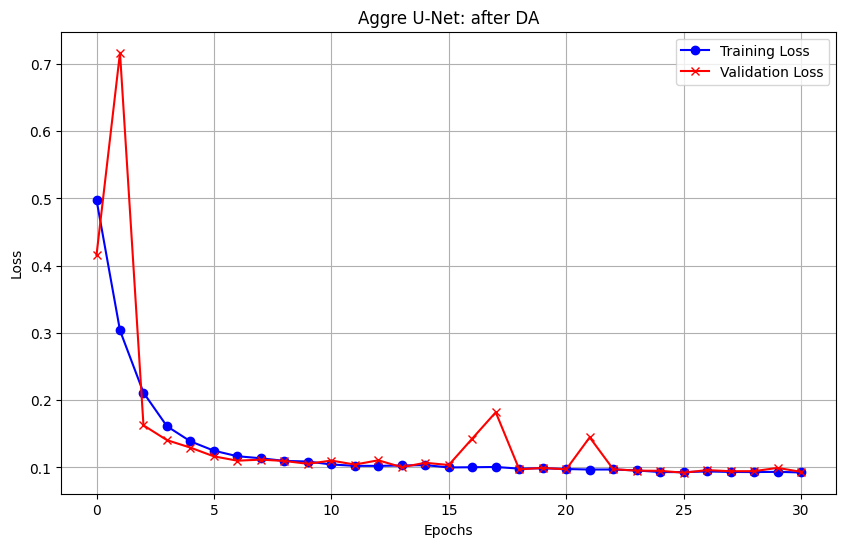

In [ ]:
title = f"Aggre U-Net: after DA"
plot_losses(train_losses, val_losses, title)

Average Dice Coefficient: 0.7257
Average IoU: 0.5720
Average Accuracy: 0.9399


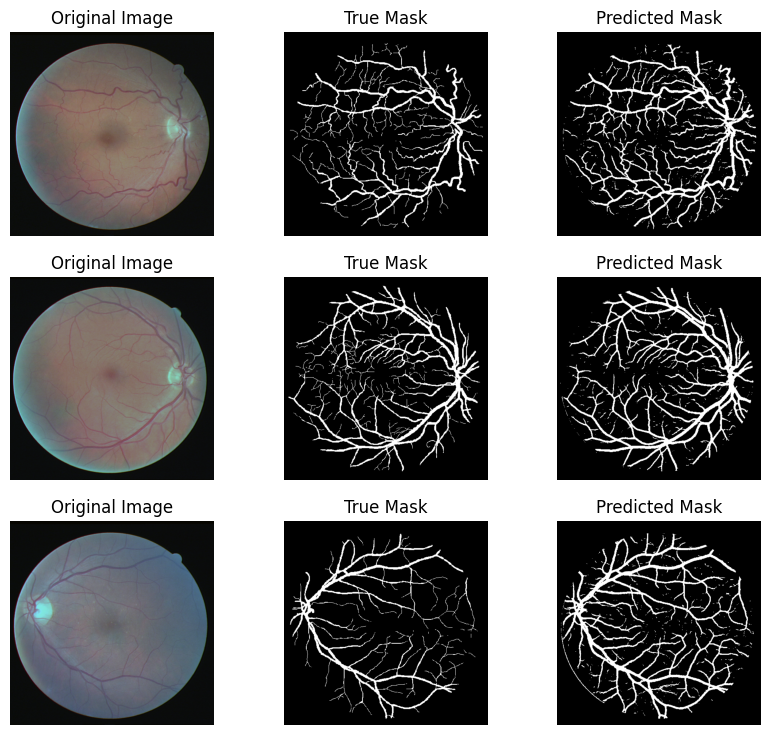

In [ ]:
# model_path = os.path.join(dir_save, f'AggreUNet_afterDA.pth')
# model.load_state_dict(torch.load(model_path))
evaluate_model(model, test_loader, device)
evaluate_and_plot(model, test_loader, device, num_images_to_plot=3)

### Aggregation UNet with SA

In [ ]:

# init Aggregation UNet model

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)
model = AtResNetUNet(n_class=1).to(device)


# init training parameters
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.AdamW(model.parameters(), lr=0.001, weight_decay=0.01)
num_epochs = 100

batch_size=1

model_save_path = os.path.join(dir_save, f'AtResNetUNet1.pth')
train_loader = DataLoader(train_dataset, batch_size, shuffle=False)

train_loss, val_loss = train_unet(model, train_loader, val_loader, criterion, optimizer, num_epochs, device, model_save_path)

cuda


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 182MB/s]
Epoch 1/100 Training: 100%|██████████| 70/70 [02:26<00:00,  2.10s/it, loss=0.397]


Epoch 1/100, Training Loss: 0.5304
Epoch 1/100, Validation Loss: 0.5050
Best model saved at epoch 1 with validation loss: 0.5050


Epoch 2/100 Training: 100%|██████████| 70/70 [00:23<00:00,  3.04it/s, loss=0.239]


Epoch 2/100, Training Loss: 0.3077
Epoch 2/100, Validation Loss: 0.7318


Epoch 3/100 Training: 100%|██████████| 70/70 [00:23<00:00,  2.99it/s, loss=0.154]


Epoch 3/100, Training Loss: 0.2170
Epoch 3/100, Validation Loss: 0.1880
Best model saved at epoch 3 with validation loss: 0.1880


Epoch 4/100 Training: 100%|██████████| 70/70 [00:23<00:00,  2.96it/s, loss=0.119]


Epoch 4/100, Training Loss: 0.1634
Epoch 4/100, Validation Loss: 0.1483
Best model saved at epoch 4 with validation loss: 0.1483


Epoch 5/100 Training: 100%|██████████| 70/70 [00:23<00:00,  2.96it/s, loss=0.11]


Epoch 5/100, Training Loss: 0.1390
Epoch 5/100, Validation Loss: 0.1367
Best model saved at epoch 5 with validation loss: 0.1367


Epoch 6/100 Training: 100%|██████████| 70/70 [00:23<00:00,  2.97it/s, loss=0.0942]


Epoch 6/100, Training Loss: 0.1259
Epoch 6/100, Validation Loss: 0.1294
Best model saved at epoch 6 with validation loss: 0.1294


Epoch 7/100 Training: 100%|██████████| 70/70 [00:23<00:00,  2.95it/s, loss=0.0954]


Epoch 7/100, Training Loss: 0.1201
Epoch 7/100, Validation Loss: 0.1321


Epoch 8/100 Training: 100%|██████████| 70/70 [00:23<00:00,  2.94it/s, loss=0.0851]


Epoch 8/100, Training Loss: 0.1147
Epoch 8/100, Validation Loss: 0.1209
Best model saved at epoch 8 with validation loss: 0.1209


Epoch 9/100 Training: 100%|██████████| 70/70 [00:23<00:00,  2.93it/s, loss=0.0797]


Epoch 9/100, Training Loss: 0.1090
Epoch 9/100, Validation Loss: 0.1224


Epoch 10/100 Training: 100%|██████████| 70/70 [00:23<00:00,  2.94it/s, loss=0.0776]


Epoch 10/100, Training Loss: 0.1050
Epoch 10/100, Validation Loss: 0.1244


Epoch 11/100 Training: 100%|██████████| 70/70 [00:23<00:00,  2.95it/s, loss=0.0727]


Epoch 11/100, Training Loss: 0.1030
Epoch 11/100, Validation Loss: 0.1210


Epoch 12/100 Training: 100%|██████████| 70/70 [00:24<00:00,  2.89it/s, loss=0.0722]


Epoch 12/100, Training Loss: 0.1004
Epoch 12/100, Validation Loss: 0.1178
Best model saved at epoch 12 with validation loss: 0.1178


Epoch 13/100 Training: 100%|██████████| 70/70 [00:24<00:00,  2.81it/s, loss=0.0756]


Epoch 13/100, Training Loss: 0.0975
Epoch 13/100, Validation Loss: 0.1224


Epoch 14/100 Training: 100%|██████████| 70/70 [00:24<00:00,  2.88it/s, loss=0.0705]


Epoch 14/100, Training Loss: 0.0956
Epoch 14/100, Validation Loss: 0.1183


Epoch 15/100 Training: 100%|██████████| 70/70 [00:24<00:00,  2.91it/s, loss=0.0709]


Epoch 15/100, Training Loss: 0.0949
Epoch 15/100, Validation Loss: 0.1204


Epoch 16/100 Training: 100%|██████████| 70/70 [00:24<00:00,  2.91it/s, loss=0.071]


Epoch 16/100, Training Loss: 0.0946
Epoch 16/100, Validation Loss: 0.1225


Epoch 17/100 Training: 100%|██████████| 70/70 [00:24<00:00,  2.89it/s, loss=0.0671]


Epoch 17/100, Training Loss: 0.0930
Epoch 17/100, Validation Loss: 0.1143
Best model saved at epoch 17 with validation loss: 0.1143


Epoch 18/100 Training: 100%|██████████| 70/70 [00:24<00:00,  2.89it/s, loss=0.0666]


Epoch 18/100, Training Loss: 0.0915
Epoch 18/100, Validation Loss: 0.1187


Epoch 19/100 Training: 100%|██████████| 70/70 [00:24<00:00,  2.88it/s, loss=0.0663]


Epoch 19/100, Training Loss: 0.0913
Epoch 19/100, Validation Loss: 0.1240


Epoch 20/100 Training: 100%|██████████| 70/70 [00:25<00:00,  2.77it/s, loss=0.0626]


Epoch 20/100, Training Loss: 0.0898
Epoch 20/100, Validation Loss: 0.1159


Epoch 21/100 Training: 100%|██████████| 70/70 [00:24<00:00,  2.82it/s, loss=0.0619]


Epoch 21/100, Training Loss: 0.0880
Epoch 21/100, Validation Loss: 0.1104
Best model saved at epoch 21 with validation loss: 0.1104


Epoch 22/100 Training: 100%|██████████| 70/70 [00:24<00:00,  2.86it/s, loss=0.0616]


Epoch 22/100, Training Loss: 0.0862
Epoch 22/100, Validation Loss: 0.1157


Epoch 23/100 Training: 100%|██████████| 70/70 [00:24<00:00,  2.89it/s, loss=0.066]


Epoch 23/100, Training Loss: 0.0871
Epoch 23/100, Validation Loss: 0.1153


Epoch 24/100 Training: 100%|██████████| 70/70 [00:24<00:00,  2.90it/s, loss=0.0656]


Epoch 24/100, Training Loss: 0.0852
Epoch 24/100, Validation Loss: 0.1178


Epoch 25/100 Training: 100%|██████████| 70/70 [00:24<00:00,  2.90it/s, loss=0.0633]


Epoch 25/100, Training Loss: 0.0856
Epoch 25/100, Validation Loss: 0.1134


Epoch 26/100 Training: 100%|██████████| 70/70 [00:24<00:00,  2.91it/s, loss=0.0579]


Epoch 26/100, Training Loss: 0.0864
Epoch 26/100, Validation Loss: 0.1175


Epoch 27/100 Training: 100%|██████████| 70/70 [00:24<00:00,  2.92it/s, loss=0.0586]


Epoch 27/100, Training Loss: 0.0825
Epoch 27/100, Validation Loss: 0.1164


Epoch 28/100 Training: 100%|██████████| 70/70 [00:24<00:00,  2.84it/s, loss=0.057]


Epoch 28/100, Training Loss: 0.0800
Epoch 28/100, Validation Loss: 0.1135


Epoch 29/100 Training: 100%|██████████| 70/70 [00:24<00:00,  2.81it/s, loss=0.0597]


Epoch 29/100, Training Loss: 0.0822
Epoch 29/100, Validation Loss: 0.1192


Epoch 30/100 Training: 100%|██████████| 70/70 [00:24<00:00,  2.89it/s, loss=0.0586]


Epoch 30/100, Training Loss: 0.0818
Epoch 30/100, Validation Loss: 0.1171


Epoch 31/100 Training: 100%|██████████| 70/70 [00:24<00:00,  2.91it/s, loss=0.0539]


Epoch 31/100, Training Loss: 0.0812
Epoch 31/100, Validation Loss: 0.1174
Early stopping triggered after 10 epochs without improvement.
Training completed. Best model was saved at epoch 21 with a validation loss of 0.1104


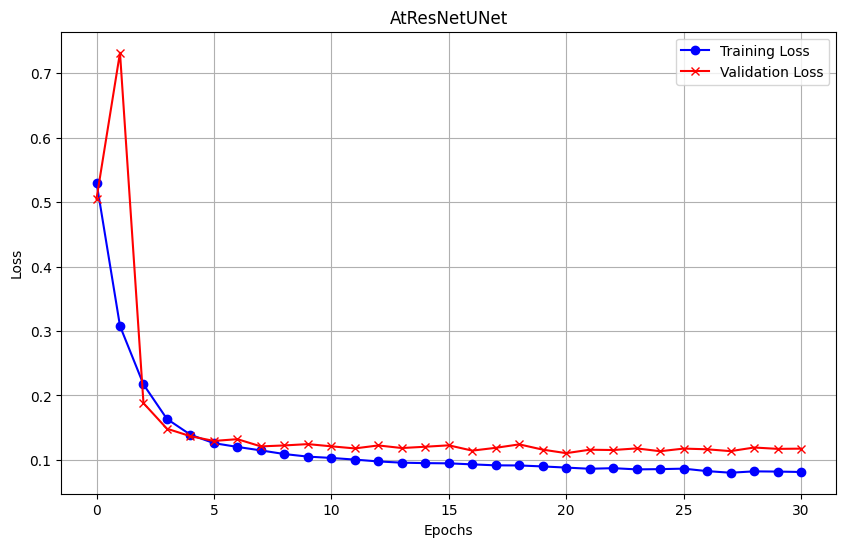

In [ ]:
plot_losses(train_loss, val_loss, title='AtResNetUNet')

Average Dice Coefficient: 0.7720
Average IoU: 0.6300
Average Accuracy: 0.9571


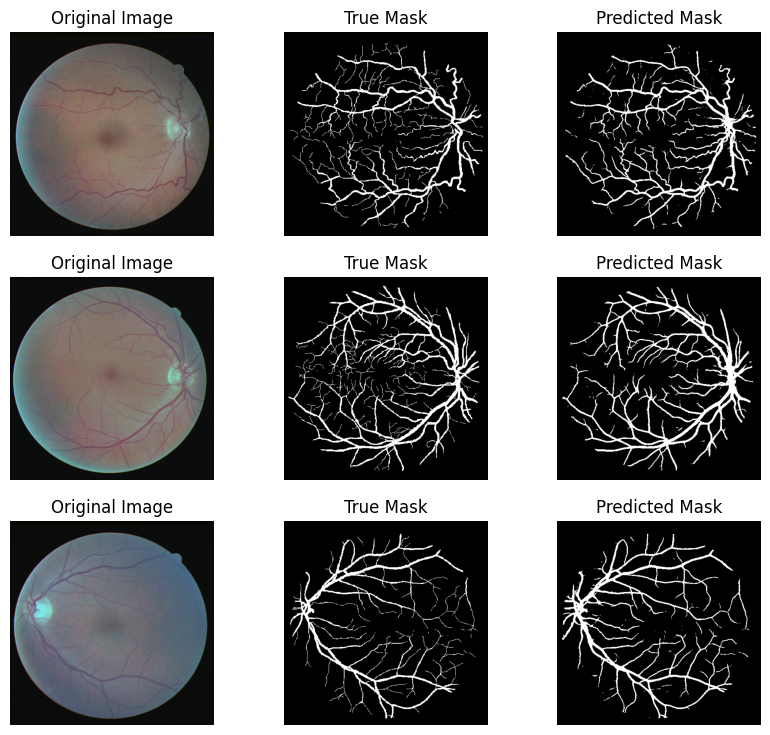

In [ ]:
model_path = os.path.join(dir_save, f'AtResNetUNet1.pth')
model.load_state_dict(torch.load(model_path))
evaluate_model(model, test_loader, device)
evaluate_and_plot(model, test_loader, device, num_images_to_plot=3)

#### AUNet with SA after DA

In [ ]:
# init Aggregation UNet model

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)
model = AtResNetUNet(n_class=1).to(device)


# init training parameters
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.AdamW(model.parameters(), lr=0.001, weight_decay=0.01)
num_epochs = 100

batch_size=2

model_save_path = os.path.join(dir_save, f'AtResNetUNet_afterDA.pth')
aug_train_loader = DataLoader(aug_dataset, batch_size, shuffle=True)

train_losses, val_losses = train_unet(model, aug_train_loader, val_loader,  criterion, optimizer, num_epochs, device, model_path, 5)


cuda


Epoch 1/100 Training: 100%|██████████| 70/70 [00:55<00:00,  1.27it/s, loss=0.311]


Epoch 1/100, Training Loss: 0.5566
Epoch 1/100, Validation Loss: 0.3855
Best model saved at epoch 1 with validation loss: 0.3855


Epoch 2/100 Training: 100%|██████████| 70/70 [00:54<00:00,  1.28it/s, loss=0.279]


Epoch 2/100, Training Loss: 0.3171
Epoch 2/100, Validation Loss: 0.1813
Best model saved at epoch 2 with validation loss: 0.1813


Epoch 3/100 Training: 100%|██████████| 70/70 [00:54<00:00,  1.29it/s, loss=0.165]


Epoch 3/100, Training Loss: 0.2043
Epoch 3/100, Validation Loss: 0.1623
Best model saved at epoch 3 with validation loss: 0.1623


Epoch 4/100 Training: 100%|██████████| 70/70 [00:54<00:00,  1.29it/s, loss=0.138]


Epoch 4/100, Training Loss: 0.1578
Epoch 4/100, Validation Loss: 0.1264
Best model saved at epoch 4 with validation loss: 0.1264


Epoch 5/100 Training: 100%|██████████| 70/70 [00:54<00:00,  1.28it/s, loss=0.123]


Epoch 5/100, Training Loss: 0.1432
Epoch 5/100, Validation Loss: 0.1394


Epoch 6/100 Training: 100%|██████████| 70/70 [00:54<00:00,  1.29it/s, loss=0.135]


Epoch 6/100, Training Loss: 0.1314
Epoch 6/100, Validation Loss: 0.1219
Best model saved at epoch 6 with validation loss: 0.1219


Epoch 7/100 Training: 100%|██████████| 70/70 [00:54<00:00,  1.28it/s, loss=0.139]


Epoch 7/100, Training Loss: 0.1201
Epoch 7/100, Validation Loss: 0.1118
Best model saved at epoch 7 with validation loss: 0.1118


Epoch 8/100 Training: 100%|██████████| 70/70 [00:54<00:00,  1.29it/s, loss=0.1]


Epoch 8/100, Training Loss: 0.1180
Epoch 8/100, Validation Loss: 0.1115
Best model saved at epoch 8 with validation loss: 0.1115


Epoch 9/100 Training: 100%|██████████| 70/70 [00:54<00:00,  1.29it/s, loss=0.113]


Epoch 9/100, Training Loss: 0.1117
Epoch 9/100, Validation Loss: 0.1050
Best model saved at epoch 9 with validation loss: 0.1050


Epoch 10/100 Training: 100%|██████████| 70/70 [00:54<00:00,  1.29it/s, loss=0.121]


Epoch 10/100, Training Loss: 0.1076
Epoch 10/100, Validation Loss: 0.1033
Best model saved at epoch 10 with validation loss: 0.1033


Epoch 11/100 Training: 100%|██████████| 70/70 [00:54<00:00,  1.28it/s, loss=0.112]


Epoch 11/100, Training Loss: 0.1057
Epoch 11/100, Validation Loss: 0.1015
Best model saved at epoch 11 with validation loss: 0.1015


Epoch 12/100 Training: 100%|██████████| 70/70 [00:54<00:00,  1.29it/s, loss=0.0888]


Epoch 12/100, Training Loss: 0.1038
Epoch 12/100, Validation Loss: 0.1038


Epoch 13/100 Training: 100%|██████████| 70/70 [00:54<00:00,  1.30it/s, loss=0.0954]


Epoch 13/100, Training Loss: 0.1030
Epoch 13/100, Validation Loss: 0.1013
Best model saved at epoch 13 with validation loss: 0.1013


Epoch 14/100 Training: 100%|██████████| 70/70 [00:54<00:00,  1.29it/s, loss=0.0922]


Epoch 14/100, Training Loss: 0.0990
Epoch 14/100, Validation Loss: 0.0983
Best model saved at epoch 14 with validation loss: 0.0983


Epoch 15/100 Training: 100%|██████████| 70/70 [00:54<00:00,  1.28it/s, loss=0.118]


Epoch 15/100, Training Loss: 0.0987
Epoch 15/100, Validation Loss: 0.0950
Best model saved at epoch 15 with validation loss: 0.0950


Epoch 16/100 Training: 100%|██████████| 70/70 [00:54<00:00,  1.29it/s, loss=0.0986]


Epoch 16/100, Training Loss: 0.0963
Epoch 16/100, Validation Loss: 0.0979


Epoch 17/100 Training: 100%|██████████| 70/70 [00:54<00:00,  1.29it/s, loss=0.0853]


Epoch 17/100, Training Loss: 0.0966
Epoch 17/100, Validation Loss: 0.0985


Epoch 18/100 Training: 100%|██████████| 70/70 [00:54<00:00,  1.29it/s, loss=0.106]


Epoch 18/100, Training Loss: 0.0944
Epoch 18/100, Validation Loss: 0.0950
Best model saved at epoch 18 with validation loss: 0.0950


Epoch 19/100 Training: 100%|██████████| 70/70 [00:54<00:00,  1.29it/s, loss=0.122]


Epoch 19/100, Training Loss: 0.0939
Epoch 19/100, Validation Loss: 0.0948
Best model saved at epoch 19 with validation loss: 0.0948


Epoch 20/100 Training: 100%|██████████| 70/70 [00:54<00:00,  1.28it/s, loss=0.106]


Epoch 20/100, Training Loss: 0.0931
Epoch 20/100, Validation Loss: 0.0938
Best model saved at epoch 20 with validation loss: 0.0938


Epoch 21/100 Training: 100%|██████████| 70/70 [00:54<00:00,  1.29it/s, loss=0.094]


Epoch 21/100, Training Loss: 0.0946
Epoch 21/100, Validation Loss: 0.0923
Best model saved at epoch 21 with validation loss: 0.0923


Epoch 22/100 Training: 100%|██████████| 70/70 [00:54<00:00,  1.29it/s, loss=0.14]


Epoch 22/100, Training Loss: 0.0929
Epoch 22/100, Validation Loss: 0.0927


Epoch 23/100 Training: 100%|██████████| 70/70 [00:54<00:00,  1.30it/s, loss=0.0968]


Epoch 23/100, Training Loss: 0.0932
Epoch 23/100, Validation Loss: 0.0964


Epoch 24/100 Training: 100%|██████████| 70/70 [00:53<00:00,  1.30it/s, loss=0.0819]


Epoch 24/100, Training Loss: 0.0938
Epoch 24/100, Validation Loss: 0.0957


Epoch 25/100 Training: 100%|██████████| 70/70 [00:54<00:00,  1.29it/s, loss=0.0964]


Epoch 25/100, Training Loss: 0.0910
Epoch 25/100, Validation Loss: 0.0938


Epoch 26/100 Training: 100%|██████████| 70/70 [00:54<00:00,  1.29it/s, loss=0.11]


Epoch 26/100, Training Loss: 0.0916
Epoch 26/100, Validation Loss: 0.0937
Early stopping triggered after 5 epochs without improvement.
Training completed. Best model was saved at epoch 21 with a validation loss of 0.0923


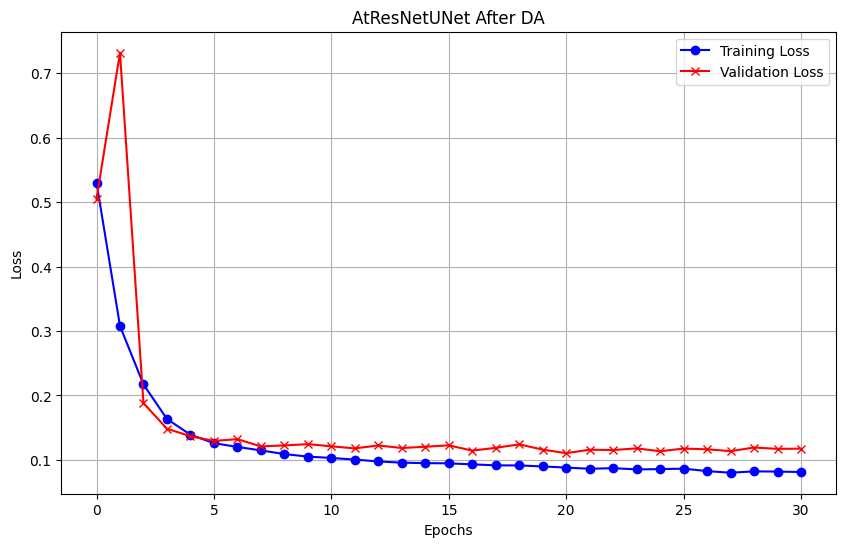

In [ ]:
plot_losses(train_loss, val_loss, title='AtResNetUNet After DA')

Average Dice Coefficient: 0.7780
Average IoU: 0.6383
Average Accuracy: 0.9582


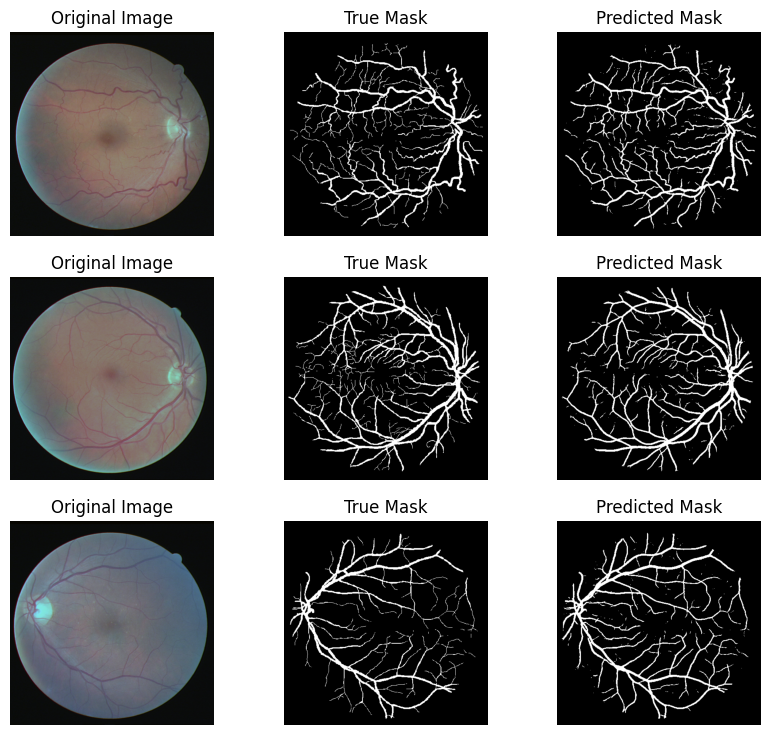

In [ ]:
# model_path = os.path.join(dir_save, f'AtResNetUNet_afterDA.pth')
# model.load_state_dict(torch.load(model_path))
evaluate_model(model, test_loader, device)
evaluate_and_plot(model, test_loader, device, num_images_to_plot=3)

# Results

All the reuslts in the following table **can be found in the corresponding section of the Experiments above, as well as the corresponding training log and predicted segmentation output.**


## Result Table

## Data Augmentation Comparison Table
| Data Augmentation Method | DICE   | IoU    | ACC    |
|--------------------------|--------|--------|--------|
| Rotate                   | 0.7605 | 0.6142 | 0.9513 |
| Add Noise                | 0.7487 | 0.5991 | 0.9499 |
| Gaussian Blur            | 0.7193 | 0.563  | 0.9411 |

## Baseline Models Comparison Table
| Model         | Average Dice Coefficient | Average IoU | Average Accuracy |
|---------------|--------------------------|-------------|------------------|
| ResU-Net      | 0.7437                   | 0.5949      | 0.9511           |
| DeepLabv3     | 0.4424                   | 0.2854      | 0.7848           |
| FCN           | 0.6132                   | 0.4434      | 0.9025           |
| Attention UNet| **0.7543**               | **0.6081**  | **0.9539**       |

## Improved Models and Baseline Comparison Table
| Model                    | Average Dice Coefficient | Average IoU | Average Accuracy |
|--------------------------|--------------------------|-------------|------------------|
| DeepLabv3                | 0.4424                   | 0.2854      | 0.7848           |
| FCN                      | 0.6132                   | 0.4434      | 0.9025           |
| Attention UNet           | 0.7543                   | 0.6081      | 0.9539           |
| ResU-Net                 | 0.7437                   | 0.5949      | 0.9511           |
| Aggregation UNet         | **0.7784**               | **0.6383**  | **0.9619**       |
| Aggregation UNet with RA | 0.7780                   | 0.6383      | 0.9582           |



## Evaluation Metrics
1. **Average Dice Coefficient:**
   $$ \text{Dice Coefficient} = \frac{2 \times |X \cap Y|}{|X| + |Y|} $$
   Where \(X\) is the predicted set of pixels and \(Y\) is the ground truth.

2. **Average IoU (Intersection over Union):**
   $$ \text{IoU} = \frac{|X \cap Y|}{|X \cup Y|} $$
   Where \(X\) is the predicted set of pixels and \(Y\) is the ground truth.

3. **Average Accuracy:**
   $$ \text{Accuracy} = \frac{\text{Number of Correct Predictions}}{\text{Total Number of Predictions}} $$

# Discussion
- **Data Augmentation Comparison Experiments:**
  - Rotation proves to be the most effective, recommended for following experimental setups.

- **Model Performance Comparison:**
  - Aggregation UNet outperforms the baseline models.
  - Achieves a 3.47% improvement in Dice coefficient from 74.37 to 77.84 over the basic UNet.
  - Significantly reduces misclassification of noise.
  - Demonstrates substantial improvements in segmentation accuracy, particularly in IoU and noise immunity, which are vital for medical diagnostic applications.

- **Feature extraction in Aggregation UNet:**
  - The introduction of the Feature Fuse module enhances feature extraction capabilities, especially for blood vessels, and offers resistance to noise in original images.
  - Outperforms complex models like DeepLabv3, especially in contexts with very limited datasets.
  - Maintains crucial spatial information for blood vessel segmentation thanks to the preserved skip connection structure of UNet.
  - Shows a 2.41% Dice improvement over Attention UNet.

- **Architectural Modifications to U-Net:**
  - Preserved skip connections to enhance high-resolution feature retention.
  - Implemented modified residual blocks and feature fusion techniques.
  - Integrated residual-attention blocks to boost accuracy and efficiency.
  - These modifications led to a significant 4.34% increase in the IoU metric.

## Limitation:
Although our model can initially segment blood vessels, its accuracy needs further improvement; it remains inadequate for detailed medical diagnosis tasks, such as quantifying vessel curvature and diameter.



## Future Work:
**Limitation of Datasets:** This issue may still affect the generalization ability of the model. Due to the very limited public medical image datasets, we can further introduce unsupervised learning, such as the GAN adversarial generation mechanism, to further improve the segmentation performance of the model.

**Model pruning:** By introducing the deep supervision mechanism, the model is pruned to further reduce the number of model parameters, thereby improving the reasoning speed and achieving real-time segmentation.

**Model deployment in Real-World:** For deployment, the model can be exported using Libtorch to a C++ compatible format, which provides higher performance than Python. This facilitates faster real-time inference. Additionally, employing deep supervision and network pruning significantly reduces network complexity, enhancing speed and suitability for real-time medical applications.